<a href="https://colab.research.google.com/github/ericwang10/Clustering-algorithms-from-scratch-/blob/main/Clustering%20and%20ML%20algorithms.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Initial data generation

In [ ]:
#some basic imports
import pandas as pd
import numpy as np
import random
import matplotlib.pyplot as plt
import math

from matplotlib.pyplot import cm


In [ ]:
#function to get distance
def getDistance(p1, p2):
  return math.dist(p1, p2)

## generating data for example 1
note: generating points for ex 1 is easier as polar coords

**CARTESIAN FORM**

(x, y) 

**POLAR FORM**

(r, theta) 

r = radius

theta = degrees 


In [ ]:
#storing some values to plot it in polar coordinates later 
tmp_r1 = []
tmp_theta1 = []

tmp_r2 = []
tmp_theta2 = []

tmp_r3 = []
tmp_theta3 = []

#case 1 - inner circle 
x1 = [] #storing both x and y coordinates this time
y1= []

radius_c1 = 1
radius_c2 = 4
radius_c3 = 10

points = 200 #generate 200 data points 

for i in range(points): 
  radius = random.random()*radius_c1 #make inner circle take values from 0 to radius_c1
  theta = random.uniform(0,2*math.pi) #2pi is full circle so we can get data around the entire circle
  x1.append(radius*math.sin(theta)) #to get the x and y coords, get sin and cos in rads
  y1.append(radius*math.cos(theta))

  #tmp
  tmp_r1.append(radius)
  tmp_theta1.append(theta)

#case 2 - middle ring 
x2 = []
y2 = []

for i in range(points): 
  radius = radius_c2 + random.random()*radius_c2*0.1 #to make a ring, add radius_c2 to the radius 
  theta = random.uniform(0,2*math.pi)
  x2.append(radius*math.sin(theta))  
  y2.append(radius*math.cos(theta))

  #tmp
  tmp_r2.append(radius)
  tmp_theta2.append(theta)

#case 3 - outer ring 
x3 = []
y3 = []

for i in range(points): 
  radius = radius_c3 + random.random()*radius_c3*0.1
  theta = random.uniform(0,2*math.pi)
  x3.append(radius*math.sin(theta)) 
  y3.append(radius*math.cos(theta))

  #tmp
  tmp_r3.append(radius)
  tmp_theta3.append(theta)

## generating dataframe

In [ ]:
#creating a dataframe for our clustering, kNN, neural network, etc 

df = pd.DataFrame()
df["x"] = x1
df["y"] = y1
df["label"] = 1


df2 = pd.DataFrame()
df2["x"] = x2
df2["y"] = y2
df2["label"] = 2

df3 = pd.DataFrame()
df3["x"] = x3
df3["y"] = y3
df3["label"] = 3

dfex1 = df.append(df2, ignore_index = True)
dfex1 = dfex1.append(df3, ignore_index = True)
dfex1

,x,y,label
0,0.466077,0.448894,1
1,0.002052,-0.007788,1
2,-0.185807,-0.097086,1
3,0.078732,0.022657,1
4,0.355644,0.125111,1
...,...,...,...
595,0.998579,-10.929375,3
596,-10.577027,-0.534584,3
597,10.131943,2.120521,3
598,10.774014,1.092984,3


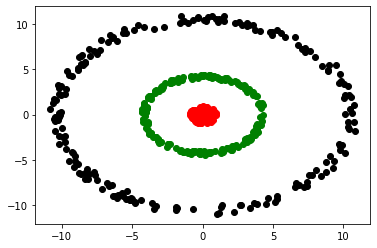

In [ ]:
#PLOTTING 

subset = dfex1.loc[dfex1['label'] == 1]
plt.scatter(subset["x"], subset["y"], color = "red")

subset = dfex1.loc[dfex1['label'] == 2]
plt.scatter(subset["x"], subset["y"], color = "green")

subset = dfex1.loc[dfex1['label'] == 3]
plt.scatter(subset["x"], subset["y"], color = "black")

plt.show()


# example 2


In [ ]:
#case 1 black dots 
count = 0
case_1x = []
case_1y = []

#note random prints from 0.0 to 1.0 
xboundred = 10
yboundred = 10

xboundgreen = 7
yboundgreen = 4

boxthickness = 1

i = 0

while i < 200: #generate random data points for black points 
  x = random.random() * 20
  y = random.random() * 20

  #skip if this enters our green or red box coordinate area 
  if x < xboundred + boxthickness and x > xboundred and y < yboundred + boxthickness and y> yboundred: #prevent case 2 
    continue
  elif x < xboundgreen + boxthickness and x > xboundgreen and y <yboundgreen + boxthickness and y >yboundgreen:
    continue
  else:
    case_1x.append(x)
    case_1y.append(y)
    i+= 1


#case 2 green dots 
case_2x = []
case_2y = []
for i in range(200): #generate 200 data points 
  case_2x.append(xboundgreen + random.random() * boxthickness) #box coordinates made by getting random values within the box 
  case_2y.append(yboundgreen + random.random() * boxthickness)


#case 3 red dots
case_3x = []
case_3y = []
for i in range(200): 
  val = random.random()
  case_3x.append(xboundred + random.random() * boxthickness)
  case_3y.append(yboundred + random.random() * boxthickness)

## creating data frame

In [ ]:
df = pd.DataFrame()
df["x"] = case_1x
df["y"] = case_1y
df["label"] = 1


df2 = pd.DataFrame()
df2["x"] = case_2x
df2["y"] = case_2y
df2["label"] = 2

df3 = pd.DataFrame()
df3["x"] = case_3x
df3["y"] = case_3y
df3["label"] = 3

#creating dataframe to use for our clustering, neural network, etc

dfex2 = df.append(df2, ignore_index = True)
dfex2 = dfex2.append(df3, ignore_index = True)
dfex2

,x,y,label
0,19.548623,13.058487,1
1,5.218036,18.029997,1
2,10.015804,3.185759,1
3,18.919526,12.054292,1
4,13.192554,19.690970,1
...,...,...,...
595,10.012077,10.248402,3
596,10.336569,10.042464,3
597,10.435477,10.949508,3
598,10.055935,10.330230,3


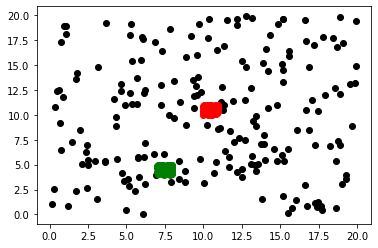

In [ ]:
#plotting 
subset = dfex2.loc[dfex2['label'] == 1]
plt.scatter(subset["x"], subset["y"], color = "black")

subset = dfex2.loc[dfex2['label'] == 2]
plt.scatter(subset["x"], subset["y"], color = "green")

subset = dfex2.loc[dfex2['label'] == 3]
plt.scatter(subset["x"], subset["y"], color = "red")

plt.show()


# example 3

In [ ]:
#case 1 
count = 0
case_1x = []
case_1y = []

#note random prints from 0.0 to 1.0 
xboundred = 1
yboundred = 5

xboundgreen = -1
yboundgreen = 5

yboxadjustment = 1.1
xboxadjustment = 0.5
xboxthickness = 1 * xboxadjustment
yboxthickness = 1 * yboxadjustment

i = 0
while i < 200: #generate random data points for our smile, a x^2 parabola  
  x = random.random() * 5 - 2.5 # generate points from -20 to 20 
  y = pow(x, 2)
  if x < xboundred + boxthickness and x > xboundred and y < yboundred + boxthickness and y> yboundred: #prevent case 2 
    continue
  elif x < xboundgreen + boxthickness and x > xboundgreen and y <yboundgreen + boxthickness and y >yboundgreen:
    continue
  else:
    case_1x.append(x)
    case_1y.append(y)
    i+= 1


#case 2 - our green eye box
case_2x = []
case_2y = []
for i in range(200): #generate 200 data points 
  case_2x.append(xboundgreen + random.random() * boxthickness * xboxadjustment- xboxthickness/2)
  case_2y.append(yboundgreen + random.random() * boxthickness * yboxadjustment - yboxthickness/2)


#case 3 - our red eye box 
case_3x = []
case_3y = []
for i in range(200): #generate 200 data points 
  val = random.random()
  case_3x.append(xboundred + random.random() * boxthickness * xboxadjustment- xboxthickness/2)
  case_3y.append(yboundred + random.random() * boxthickness * yboxadjustment- yboxthickness/2)

## combines all data into a table for the machine learning functions later down the road

In [ ]:
dfcase1 = pd.DataFrame()
dfcase1["x"] = case_1x
dfcase1["y"] = case_1y
dfcase1["label"] = 1
dfcase1



,x,y,label
0,0.479574,0.229991,1
1,2.245693,5.043135,1
2,1.697264,2.880704,1
3,0.800084,0.640134,1
4,0.994719,0.989466,1
...,...,...,...
195,1.226213,1.503598,1
196,-1.784815,3.185564,1
197,1.728499,2.987709,1
198,-1.360895,1.852035,1


In [ ]:
dfcase2 = pd.DataFrame()
dfcase2["x"] = case_2x
dfcase2["y"] = case_2y
dfcase2["label"] = 2

dfcase3 = pd.DataFrame()
dfcase3["x"] = case_3x
dfcase3["y"] = case_3y
dfcase3["label"] = 3

dfex3 = dfcase1.append(dfcase2, ignore_index = True)
dfex3 = dfex3.append(dfcase3, ignore_index = True)
dfex3

,x,y,label
0,0.479574,0.229991,1
1,2.245693,5.043135,1
2,1.697264,2.880704,1
3,0.800084,0.640134,1
4,0.994719,0.989466,1
...,...,...,...
595,0.987999,4.612108,3
596,1.135014,5.294547,3
597,0.753190,4.798248,3
598,1.200485,4.633492,3


## plotting data

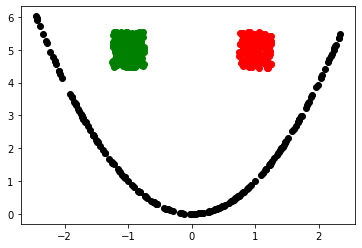

In [ ]:
subset = dfex3.loc[dfex2['label'] == 1]
plt.scatter(subset["x"], subset["y"], color = "black")

subset = dfex3.loc[dfex2['label'] == 2]
plt.scatter(subset["x"], subset["y"], color = "green")

subset = dfex3.loc[dfex2['label'] == 3]
plt.scatter(subset["x"], subset["y"], color = "red")

plt.show()


# program a KNN algorithm

In [ ]:
def kMeans(train, test, kmeans = 1):
  dfcopy = train.copy(deep=True)  #make a copy of the dataframe to calculate distances 

  count = 0
  correct = 0
  for index, row in test.iterrows(): #iterate through each row of test
    #for each test point, we will evaluate the kNN with our train dataset 
    prediction = predict(train, row[0], row[1], kmeans) 
    if prediction == test.loc[index, 'label']: #use test actual label to find our prediction rate  
      correct += 1
    count += 1

  return count

In [ ]:
#kmeans prediction algorithm that will predict the label of one point given a train dataset 
def predict(train, test_x, test_y, neighbors = 1): 
  dfcopy = train.copy(deep=True) #make a copy of dataset 
  distances = []
  for index, row in dfcopy.iterrows():  #for each row in our train dataset 
    distances.append(getDistance([test_x, test_y], [row[0], row[1]])) #calculate the distance to our test point 
  dfcopy["distance"] = distances  
  dfcopy = dfcopy.sort_values("distance") #then sort by distance ASCENDING
  
  dfcopy = dfcopy["label"][:neighbors]  #split top # neighbors  
  return dfcopy.mode()[0] #get the most common label 

# find kNN accuracy and set up cross validation

In [ ]:
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
#EXAMPLE 1 
df = dfex1 

#added some parameters
kf = KFold(n_splits = 5, shuffle = True, random_state = 2) #5 fold cv 

print("-------- EXAMPLE 1")
for kmean in range(1,5):
  print("trying kmean of ", kmean)
  fold = 0
  for train_index, test_index in kf.split(df): 
    train = df.iloc[train_index]  #split into train and test
    test = df.iloc[test_index]

    train, val = train_test_split(train, test_size=0.20, random_state=1) #split train into train and validation 
    fold += 1
    print("\tFOLD", fold, ": test accuracy is", kMeans(train, test, kmean)/len(test), "validation accuracy is", kMeans(train, val, kmean)/len(val)) #evaluate both test and validation 
    

-------- EXAMPLE 1
trying kmean of  1
	FOLD 1 : test accuracy is 1.0 validation accuracy is 1.0
	FOLD 2 : test accuracy is 1.0 validation accuracy is 1.0
	FOLD 3 : test accuracy is 1.0 validation accuracy is 1.0
	FOLD 4 : test accuracy is 1.0 validation accuracy is 1.0
	FOLD 5 : test accuracy is 1.0 validation accuracy is 1.0
trying kmean of  2
	FOLD 1 : test accuracy is 1.0 validation accuracy is 1.0
	FOLD 2 : test accuracy is 1.0 validation accuracy is 1.0
	FOLD 3 : test accuracy is 1.0 validation accuracy is 1.0
	FOLD 4 : test accuracy is 1.0 validation accuracy is 1.0
	FOLD 5 : test accuracy is 1.0 validation accuracy is 1.0
trying kmean of  3
	FOLD 1 : test accuracy is 1.0 validation accuracy is 1.0
	FOLD 2 : test accuracy is 1.0 validation accuracy is 1.0
	FOLD 3 : test accuracy is 1.0 validation accuracy is 1.0
	FOLD 4 : test accuracy is 1.0 validation accuracy is 1.0
	FOLD 5 : test accuracy is 1.0 validation accuracy is 1.0
trying kmean of  4
	FOLD 1 : test accuracy is 1.0 vali

In [ ]:
df = dfex2 #EXAMPLE 2 


#added some parameters
kf = KFold(n_splits = 5, shuffle = True, random_state = 2)

print("-------- EXAMPLE 2")
for kmean in range(1,5):
  print("trying kmean of ", kmean)
  fold = 0
  for train_index, test_index in kf.split(df):
    train = df.iloc[train_index]
    test = df.iloc[test_index]

    train, val = train_test_split(train, test_size=0.20, random_state=1)
    fold += 1
    print("\tFOLD", fold, ": test accuracy is", kMeans(train, test, kmean)/len(test), "validation accuracy is", kMeans(train, val, kmean)/len(val))
    

-------- EXAMPLE 2
trying kmean of  1
	FOLD 1 : test accuracy is 1.0 validation accuracy is 1.0
	FOLD 2 : test accuracy is 1.0 validation accuracy is 1.0
	FOLD 3 : test accuracy is 1.0 validation accuracy is 1.0
	FOLD 4 : test accuracy is 1.0 validation accuracy is 1.0
	FOLD 5 : test accuracy is 1.0 validation accuracy is 1.0
trying kmean of  2
	FOLD 1 : test accuracy is 1.0 validation accuracy is 1.0
	FOLD 2 : test accuracy is 1.0 validation accuracy is 1.0
	FOLD 3 : test accuracy is 1.0 validation accuracy is 1.0
	FOLD 4 : test accuracy is 1.0 validation accuracy is 1.0
	FOLD 5 : test accuracy is 1.0 validation accuracy is 1.0
trying kmean of  3
	FOLD 1 : test accuracy is 1.0 validation accuracy is 1.0
	FOLD 2 : test accuracy is 1.0 validation accuracy is 1.0
	FOLD 3 : test accuracy is 1.0 validation accuracy is 1.0
	FOLD 4 : test accuracy is 1.0 validation accuracy is 1.0
	FOLD 5 : test accuracy is 1.0 validation accuracy is 1.0
trying kmean of  4
	FOLD 1 : test accuracy is 1.0 vali

In [ ]:
df = dfex3 #EXAMPLE 3 


#added some parameters
kf = KFold(n_splits = 5, shuffle = True, random_state = 2)

print("-------- EXAMPLE 3")
for kmean in range(1,5):
  print("trying kmean of ", kmean)
  fold = 0
  for train_index, test_index in kf.split(df):
    train = df.iloc[train_index]
    test = df.iloc[test_index]

    train, val = train_test_split(train, test_size=0.20, random_state=1)
    fold += 1
    print("\tFOLD", fold, ": test accuracy is", kMeans(train, test, kmean)/len(test), "validation accuracy is", kMeans(train, val, kmean)/len(val))
    

-------- EXAMPLE 3
trying kmean of  1
	FOLD 1 : test accuracy is 1.0 validation accuracy is 1.0
	FOLD 2 : test accuracy is 1.0 validation accuracy is 1.0
	FOLD 3 : test accuracy is 1.0 validation accuracy is 1.0
	FOLD 4 : test accuracy is 1.0 validation accuracy is 1.0
	FOLD 5 : test accuracy is 1.0 validation accuracy is 1.0
trying kmean of  2
	FOLD 1 : test accuracy is 1.0 validation accuracy is 1.0
	FOLD 2 : test accuracy is 1.0 validation accuracy is 1.0
	FOLD 3 : test accuracy is 1.0 validation accuracy is 1.0
	FOLD 4 : test accuracy is 1.0 validation accuracy is 1.0
	FOLD 5 : test accuracy is 1.0 validation accuracy is 1.0
trying kmean of  3
	FOLD 1 : test accuracy is 1.0 validation accuracy is 1.0
	FOLD 2 : test accuracy is 1.0 validation accuracy is 1.0
	FOLD 3 : test accuracy is 1.0 validation accuracy is 1.0
	FOLD 4 : test accuracy is 1.0 validation accuracy is 1.0
	FOLD 5 : test accuracy is 1.0 validation accuracy is 1.0
trying kmean of  4
	FOLD 1 : test accuracy is 1.0 vali

# test with decision tree algorithm

In [ ]:
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeClassifier #use decision tree classifier 


In [ ]:
df = dfex1 #EXAMPLE 1 
clf = DecisionTreeClassifier(random_state=0)

scores = cross_val_score(clf, df[["x", "y"]], df["label"], cv=5) #use built in cross validation 

for i in range(5):
  print("FOLD", i+1, "score is", scores[i])
print(df[["x", "y"]])

FOLD 1 score is 0.9833333333333333
FOLD 2 score is 1.0
FOLD 3 score is 1.0
FOLD 4 score is 0.9916666666666667
FOLD 5 score is 1.0
            x          y
0    0.125975   0.081644
1    0.602363   0.498117
2   -0.819807  -0.406688
3    0.314422  -0.001522
4    0.626600  -0.547624
..        ...        ...
595 -9.717902   4.598569
596 -9.625798   3.457984
597  1.384082 -10.331050
598  3.596826  -9.819487
599  2.655308 -10.272346

[600 rows x 2 columns]


In [ ]:
df = dfex2 #EXAMPLE 2 
clf = DecisionTreeClassifier(random_state=1)

cross_val_score(clf, df[["x", "y"]], df["label"], cv=5)

for i in range(5):
  print("FOLD", i+1, "score is", scores[i])
print(df[["x", "y"]])

FOLD 1 score is 0.9833333333333333
FOLD 2 score is 1.0
FOLD 3 score is 1.0
FOLD 4 score is 0.9916666666666667
FOLD 5 score is 1.0
             x          y
0     1.687080   2.000756
1     1.389632   4.235520
2    18.695551  15.491099
3     8.857622   3.187203
4     9.954516  11.215715
..         ...        ...
595  10.631399  10.835867
596  10.182854  10.475693
597  10.388516  10.426989
598  10.029750  10.967005
599  10.959403  10.353021

[600 rows x 2 columns]


In [ ]:
df = dfex3 #EXAMPLE 3 
clf = DecisionTreeClassifier(random_state=2)

cross_val_score(clf, df[["x", "y"]], df["label"], cv=5)

for i in range(5):
  print("FOLD", i+1, "score is", scores[i])

print(df[["x", "y"]])

FOLD 1 score is 0.9833333333333333
FOLD 2 score is 1.0
FOLD 3 score is 1.0
FOLD 4 score is 0.9916666666666667
FOLD 5 score is 1.0
            x         y
0    2.224275  4.947401
1   -1.398714  1.956401
2   -0.880374  0.775058
3   -1.656650  2.744488
4    2.359256  5.566090
..        ...       ...
595  0.860368  5.478966
596  1.005755  5.373936
597  1.002664  4.897959
598  1.240843  4.919342
599  0.950266  5.343426

[600 rows x 2 columns]


# program a k-means algorithm

In [ ]:
def kMeans(df, kmeans = 1):
  dfcopy = df.copy(deep=True) #copy our dataframe to use 
  means = []  #store our means value in a list 
  for i in range(kmeans): #randomly initialize mean weights based on the number of means we want 
    means.append([random.random() * dfcopy["x"].max(), random.random() * dfcopy["y"].max()])
  line_colors = ['r', 'g', 'b', 'c', 'm', 'y', 'k'] #color map for clusters, only works for 7 clusters for now 

  i = 1 #checking the iteration number 
  while(True): #infinite loop 
    converge = True #check convergence ie if kmeans no longer adjusts any values in an iteration 
    
    #assign points to labels  
    for index, row in dfcopy.iterrows(): #Loop through each point 
      means_distance = [getDistance([row[0], row[1]], mean) for mean in means] #calculate distance to mean for each point  

      #get minimum index which it is closest to 
      ind = np.argmin(means_distance)  #get index of closest mean. this will be the label for the specific point 

      #check for kmeans converges, if a label is changed then no convergence 
      if converge == True and dfcopy.loc[index, 'label'] != ind:
        converge = False

      #change our point to the new label (new closest mean) 
      dfcopy.loc[index, 'label'] = ind

    print("previous means were... ", means)
    
    #first plot our clusters 
    for count, mean in enumerate(means):
      subset = dfcopy.loc[dfcopy['label'] == count]
      plt.scatter(subset["x"], subset["y"], color = line_colors[count])
      plt.scatter(mean[0], mean[1], marker = 'v', color = line_colors[count], s = 20)
      

    #if kmeans converged, then we can break out of loop 
    if converge:
      plt.show()
      print("K MEANS HAS CONVERGED IN ", i, "ITERATIONS")
      break

    #update means portion 
    for count, mean in enumerate(means): #loop through each mean
      subset = dfcopy.loc[dfcopy['label'] == count] 
      subset = subset.mean() #calculate the mean of all points with that specific mean label 
      new_x = subset["x"]
      new_y = subset["y"]
      if math.isnan(new_x) and math.isnan(new_y):
        print("THIS MEAN IS NAN", count, mean)
        continue
      else:
        means[count][0] = new_x #update our new means 
        means[count][1] = new_y
    print("new means are updated to be", means)
    plt.show()
    
    
    i+= 1
  #return dfcopy

previous means were...  [[9.955554788109412, 10.314649403368568], [4.189452232851792, 10.421504760281044], [9.22686224425327, 7.318566257049808]]
THIS MEAN IS NAN 0 [9.955554788109412, 10.314649403368568]
new means are updated to be [[9.955554788109412, 10.314649403368568], [-2.0014268156440362, 0.9973757334869077], [4.135882663239245, -2.8350971350714618]]


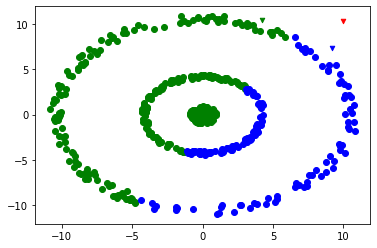

previous means were...  [[9.955554788109412, 10.314649403368568], [-2.0014268156440362, 0.9973757334869077], [4.135882663239245, -2.8350971350714618]]
new means are updated to be [[5.427052657527602, 8.001166525756641], [-2.2289479429622343, 0.4958355529330009], [3.7358083041096943, -4.038702541979234]]


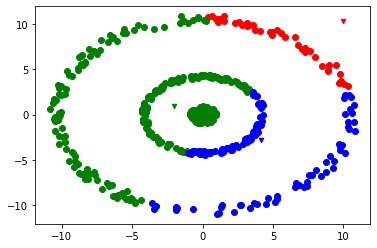

previous means were...  [[5.427052657527602, 8.001166525756641], [-2.2289479429622343, 0.4958355529330009], [3.7358083041096943, -4.038702541979234]]
new means are updated to be [[4.156133862509662, 7.004588172685784], [-2.379199218015703, 0.24145012214157982], [3.296951322258119, -4.508959172648517]]


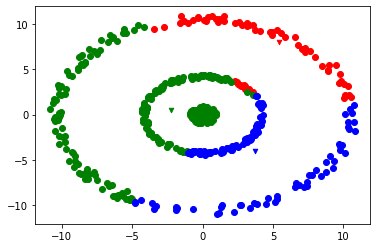

previous means were...  [[4.156133862509662, 7.004588172685784], [-2.379199218015703, 0.24145012214157982], [3.296951322258119, -4.508959172648517]]
new means are updated to be [[3.2823960280165916, 6.0950000230239105], [-2.544038301192739, 0.10496353732357834], [2.7898308318019454, -4.962921366785139]]


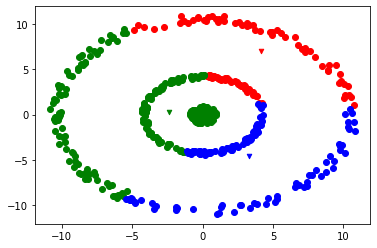

previous means were...  [[3.2823960280165916, 6.0950000230239105], [-2.544038301192739, 0.10496353732357834], [2.7898308318019454, -4.962921366785139]]
new means are updated to be [[2.9104423720064023, 5.82423829099999], [-2.535209744045417, 0.08392355522662948], [2.3023457622663583, -5.320702583334682]]


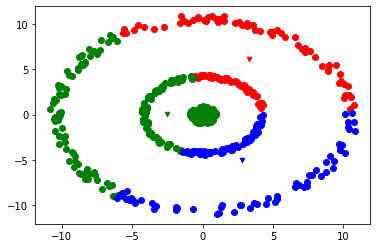

previous means were...  [[2.9104423720064023, 5.82423829099999], [-2.535209744045417, 0.08392355522662948], [2.3023457622663583, -5.320702583334682]]
new means are updated to be [[2.912437792369788, 5.673843957304553], [-2.5291049495197386, 0.1389951626262973], [1.9327183755767128, -5.4611841820928815]]


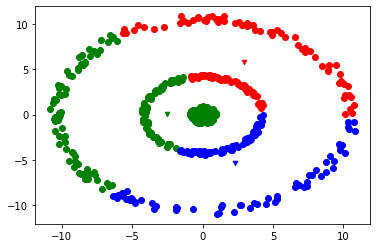

previous means were...  [[2.912437792369788, 5.673843957304553], [-2.5291049495197386, 0.1389951626262973], [1.9327183755767128, -5.4611841820928815]]
new means are updated to be [[2.923899764371959, 5.627366524597694], [-2.4918179224983774, 0.21024081885601212], [1.7232339037926443, -5.556129289862211]]


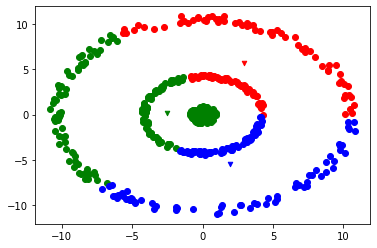

previous means were...  [[2.923899764371959, 5.627366524597694], [-2.4918179224983774, 0.21024081885601212], [1.7232339037926443, -5.556129289862211]]
new means are updated to be [[3.045454693411812, 5.524194502829885], [-2.4792731880291856, 0.23285941015213163], [1.5300786490003735, -5.640532547935591]]


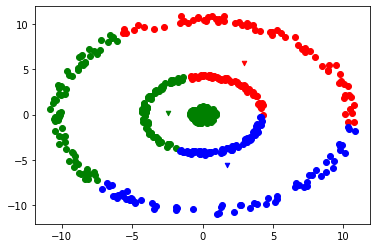

previous means were...  [[3.045454693411812, 5.524194502829885], [-2.4792731880291856, 0.23285941015213163], [1.5300786490003735, -5.640532547935591]]
new means are updated to be [[3.131397837526315, 5.4045114798531335], [-2.488485976573434, 0.2585857647711134], [1.4910312845475866, -5.72121484146082]]


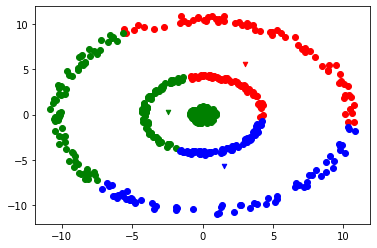

previous means were...  [[3.131397837526315, 5.4045114798531335], [-2.488485976573434, 0.2585857647711134], [1.4910312845475866, -5.72121484146082]]
new means are updated to be [[3.231446710494965, 5.387748072524062], [-2.491886246602335, 0.29465140307714577], [1.4910312845475866, -5.72121484146082]]


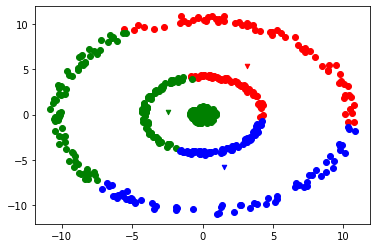

previous means were...  [[3.231446710494965, 5.387748072524062], [-2.491886246602335, 0.29465140307714577], [1.4910312845475866, -5.72121484146082]]
new means are updated to be [[3.3371011422295678, 5.364479312561733], [-2.4978869358480136, 0.34394376274419625], [1.4659428129948742, -5.705660538674474]]


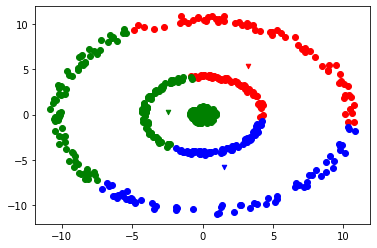

previous means were...  [[3.3371011422295678, 5.364479312561733], [-2.4978869358480136, 0.34394376274419625], [1.4659428129948742, -5.705660538674474]]
new means are updated to be [[3.46247688055902, 5.328694508326604], [-2.4878372785869765, 0.3658756648355522], [1.3994102722184667, -5.737897723356878]]


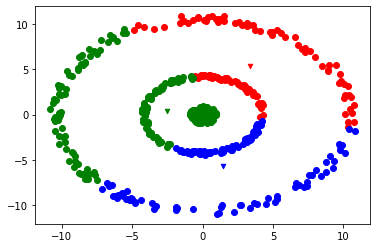

previous means were...  [[3.46247688055902, 5.328694508326604], [-2.4878372785869765, 0.3658756648355522], [1.3994102722184667, -5.737897723356878]]
new means are updated to be [[3.5193645247823113, 5.272329150859256], [-2.4732711317485077, 0.38789354882611865], [1.2647040510631335, -5.780622649741989]]


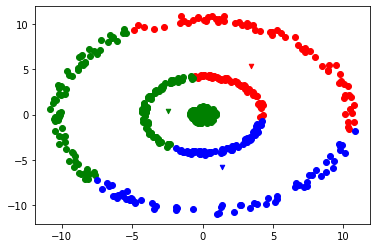

previous means were...  [[3.5193645247823113, 5.272329150859256], [-2.4732711317485077, 0.38789354882611865], [1.2647040510631335, -5.780622649741989]]
new means are updated to be [[3.64807389781772, 5.1810242813904095], [-2.4802596713288008, 0.4136420794379882], [1.1923818265727804, -5.810458359704685]]


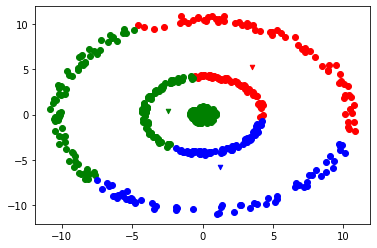

previous means were...  [[3.64807389781772, 5.1810242813904095], [-2.4802596713288008, 0.4136420794379882], [1.1923818265727804, -5.810458359704685]]
new means are updated to be [[3.65294608405342, 5.133366425069463], [-2.4638048437823437, 0.4355349926524161], [1.098408129757133, -5.859386548594484]]


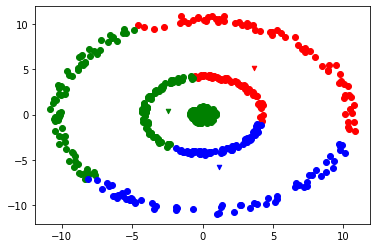

previous means were...  [[3.65294608405342, 5.133366425069463], [-2.4638048437823437, 0.4355349926524161], [1.098408129757133, -5.859386548594484]]


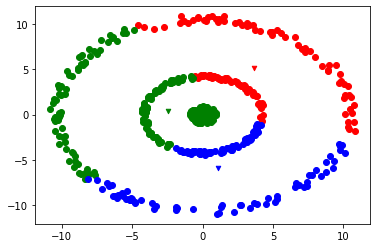

K MEANS HAS CONVERGED IN  16 ITERATIONS


In [ ]:
kMeans(dfex1, kmeans = 3)

previous means were...  [[6.450437712996945, 18.480852821285584], [12.47230141376281, 14.63043995051177], [15.544631920400304, 7.631283129573769]]
new means are updated to be [[3.5070603476941313, 13.958585514375647], [11.072914849502453, 11.231624767165195], [8.5117988759049, 4.5303833568734975]]


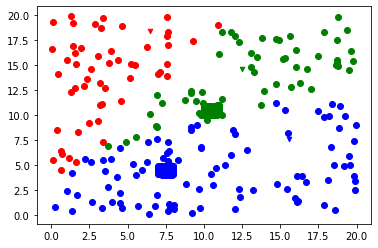

previous means were...  [[3.5070603476941313, 13.958585514375647], [11.072914849502453, 11.231624767165195], [8.5117988759049, 4.5303833568734975]]
new means are updated to be [[3.5859945578717336, 14.799541215504744], [11.611965446393, 11.123602086612035], [7.686442847999135, 4.303270542839119]]


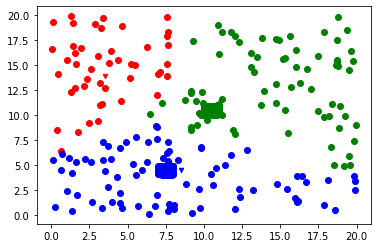

previous means were...  [[3.5859945578717336, 14.799541215504744], [11.611965446393, 11.123602086612035], [7.686442847999135, 4.303270542839119]]
new means are updated to be [[3.7733186570133244, 15.038187284677628], [11.75476574967279, 10.947202611427928], [7.440272536896729, 4.317617199362175]]


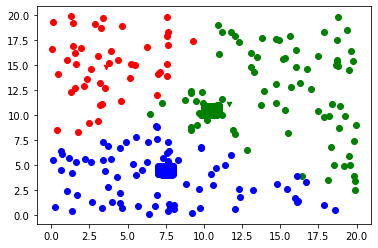

previous means were...  [[3.7733186570133244, 15.038187284677628], [11.75476574967279, 10.947202611427928], [7.440272536896729, 4.317617199362175]]
new means are updated to be [[3.7733186570133244, 15.038187284677628], [11.787851698615627, 10.895290177036344], [7.374969426934879, 4.322275267995433]]


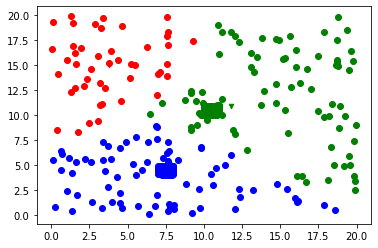

previous means were...  [[3.7733186570133244, 15.038187284677628], [11.787851698615627, 10.895290177036344], [7.374969426934879, 4.322275267995433]]
new means are updated to be [[3.8189024170973696, 15.186152284848971], [11.787851698615627, 10.895290177036344], [7.3544133543032295, 4.337029766209876]]


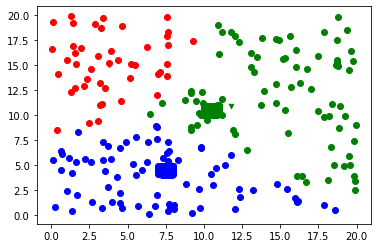

previous means were...  [[3.8189024170973696, 15.186152284848971], [11.787851698615627, 10.895290177036344], [7.3544133543032295, 4.337029766209876]]
new means are updated to be [[3.9739484892222903, 15.270753488040134], [11.790851089166782, 10.865962157485782], [7.3544133543032295, 4.337029766209876]]


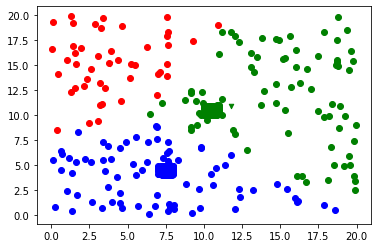

previous means were...  [[3.9739484892222903, 15.270753488040134], [11.790851089166782, 10.865962157485782], [7.3544133543032295, 4.337029766209876]]


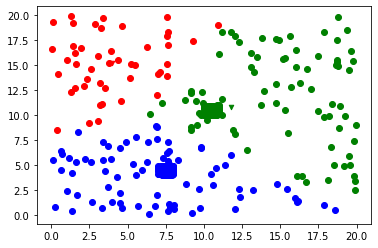

K MEANS HAS CONVERGED IN  7 ITERATIONS


In [ ]:
kMeans(dfex2, kmeans = 3)

previous means were...  [[1.1614802290025719, 3.221191074152619], [0.20544942862482848, 1.5282026780175115], [0.7218290977409887, 5.037448450126008]]
new means are updated to be [[1.708418596118854, 2.958616102359354], [-0.27492641902092047, 1.1221875667486998], [-0.023894903190830055, 5.013562433178091]]


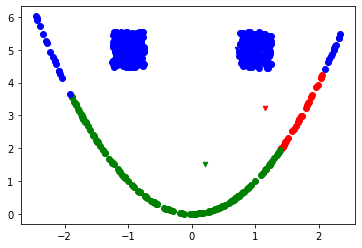

previous means were...  [[1.708418596118854, 2.958616102359354], [-0.27492641902092047, 1.1221875667486998], [-0.023894903190830055, 5.013562433178091]]
new means are updated to be [[1.705810182482647, 3.0187552689758963], [-0.32588042974657044, 0.9437710054811073], [-0.10045958002191938, 4.9903208371321774]]


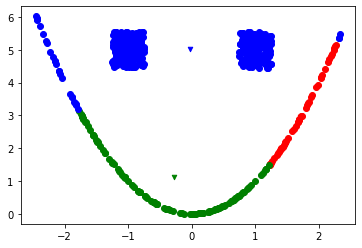

previous means were...  [[1.705810182482647, 3.0187552689758963], [-0.32588042974657044, 0.9437710054811073], [-0.10045958002191938, 4.9903208371321774]]
new means are updated to be [[1.7197598973890047, 3.0788877643589787], [-0.326660907736696, 0.9211788490119465], [-0.11568346368770022, 4.98429825683713]]


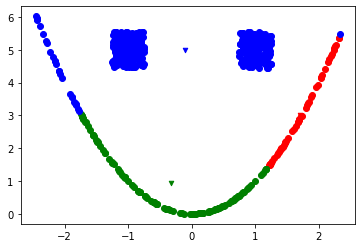

previous means were...  [[1.7197598973890047, 3.0788877643589787], [-0.326660907736696, 0.9211788490119465], [-0.11568346368770022, 4.98429825683713]]
new means are updated to be [[1.7413461584387522, 3.155600380163003], [-0.3140190771959288, 0.9257412067169046], [-0.12144358447763315, 4.983165523846547]]


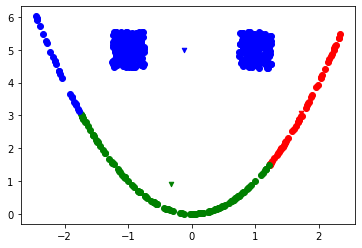

previous means were...  [[1.7413461584387522, 3.155600380163003], [-0.3140190771959288, 0.9257412067169046], [-0.12144358447763315, 4.983165523846547]]
new means are updated to be [[1.770738256726128, 3.375218408276048], [-0.24127740877988857, 0.932708505883164], [-0.13143650644676308, 4.981066320940617]]


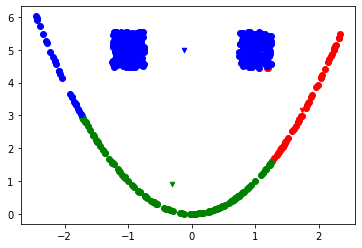

previous means were...  [[1.770738256726128, 3.375218408276048], [-0.24127740877988857, 0.932708505883164], [-0.13143650644676308, 4.981066320940617]]
new means are updated to be [[1.6939253887546388, 3.6231388801629136], [-0.2173952846529385, 0.9440263939984146], [-0.15992432572414328, 4.990694722177036]]


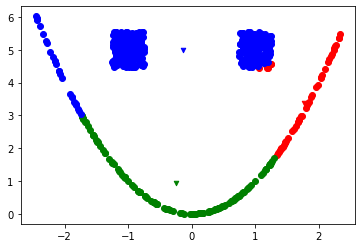

previous means were...  [[1.6939253887546388, 3.6231388801629136], [-0.2173952846529385, 0.9440263939984146], [-0.15992432572414328, 4.990694722177036]]
new means are updated to be [[1.5153926170946432, 3.9587515318871502], [-0.19342128589001806, 0.9346515659685004], [-0.24033940540232693, 5.0063190551743375]]


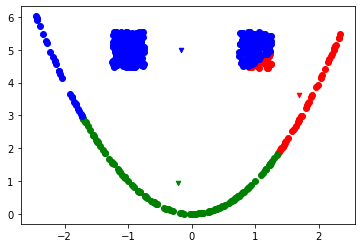

previous means were...  [[1.5153926170946432, 3.9587515318871502], [-0.19342128589001806, 0.9346515659685004], [-0.24033940540232693, 5.0063190551743375]]
new means are updated to be [[1.2766294389236323, 4.518652096635909], [-0.09723262494846817, 0.9260833256648264], [-0.5630912169301805, 5.006748781248018]]


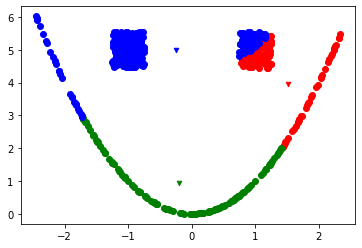

previous means were...  [[1.2766294389236323, 4.518652096635909], [-0.09723262494846817, 0.9260833256648264], [-0.5630912169301805, 5.006748781248018]]
new means are updated to be [[1.1422487853874845, 4.865649252520291], [0.02262371117780896, 0.9232003546601761], [-1.1430876214353816, 4.869367819124237]]


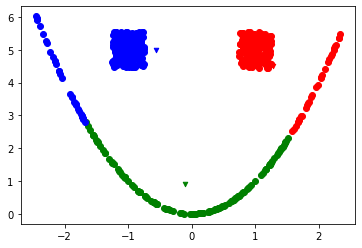

previous means were...  [[1.1422487853874845, 4.865649252520291], [0.02262371117780896, 0.9232003546601761], [-1.1430876214353816, 4.869367819124237]]
new means are updated to be [[1.138317494818203, 4.8857129811000775], [0.07186703993362135, 0.9203693788172612], [-1.1473969820287042, 4.8513573987703404]]


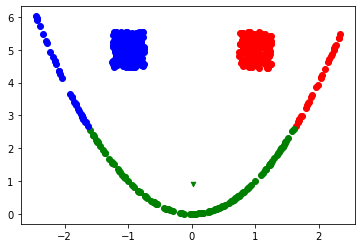

previous means were...  [[1.138317494818203, 4.8857129811000775], [0.07186703993362135, 0.9203693788172612], [-1.1473969820287042, 4.8513573987703404]]
new means are updated to be [[1.138317494818203, 4.8857129811000775], [0.08465119653104185, 0.9077832513043349], [-1.1493106815761818, 4.841768300804965]]


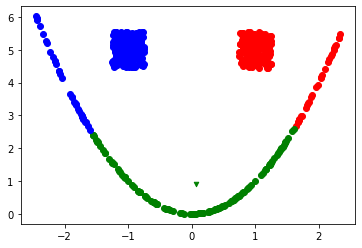

previous means were...  [[1.138317494818203, 4.8857129811000775], [0.08465119653104185, 0.9077832513043349], [-1.1493106815761818, 4.841768300804965]]


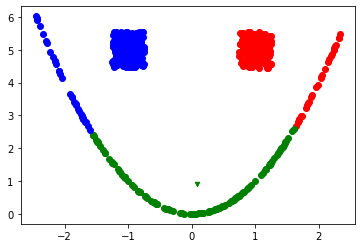

K MEANS HAS CONVERGED IN  12 ITERATIONS


In [ ]:
kMeans(dfex3, kmeans = 3)

# program an agglomerative algorithm

## before doing that though, need to reduce the number of points or else it will become WAY TOO SLOW
this is because I am calculating the distance between every point, so if there are 600 points, I would be doing 600 x 600 calculations


In [ ]:
#sample only a few points otherwise it will take too long (i haven't optimized the algorithm yet...)
dfex1_reduced = dfex1.sample(n=250, random_state=1).copy(deep=True)
print(len(dfex1_reduced))

250


In [ ]:
dfex2_reduced = dfex2.sample(n=250, random_state=1).copy(deep=True)
print(len(dfex2_reduced))

250


In [ ]:
dfex3_reduced = dfex3.sample(n=250, random_state=1).copy(deep=True)
print(len(dfex3_reduced))

250


## now, create the algo

In [ ]:
import itertools #this is for iterating through our colors 

In [ ]:
def agglomerate(df):
  dfcopy = df.copy(deep=True) #we don't want to change the actual df 
  #graph colors 
  #we are basically creating 600 different colors, as there are LOTS of labels. this is hardcoded right now, should be length of the original df 
  ys = [i+x+(i*x)**2 for i in range(600)]  #need to hardcode 600 for now so that we can get color by index
  colors = cm.rainbow(np.linspace(0, 1, len(ys))) 
  colorindex = [i for i in random.sample(range(600), 600)] #we are going to randomly sample colors in a rainbow to display our clusters 


  #first step: create the different clusters, every point will have its own cluster, clusters will be the row index 
  distances = []
  for index, row in dfcopy.iterrows():
    dfcopy.loc[index, 'label'] = index 

  #now loop through and agglomerate clusters, pick and change only two clusters at a time 
  while len(dfcopy["label"].unique()) > 1: #loop through until we have 1 cluster left 
    dfcopy = calculateDistancesAgglomerative(dfcopy) #call calculate distance function for our agglomerative using CLOSEST PAIR 

    #draw and plot 
    count = 0
    for cluster in dfcopy["label"].unique(): #each cluster will have its own unique color 
      dfclusters = dfcopy.loc[dfcopy['label'] == cluster] 
      #print(dfclusters[["x", "y"]])
      plt.scatter(dfclusters["x"], dfclusters["y"], color=colors[colorindex[cluster]]) #color index contains indices 0 to 599 randomized, so then when we get the color, we would get a more distinctive color per count++ increment
      count+=1

    print("number of clusters", len(dfcopy["label"].unique())) #illustrate the number of clusters 
    plt.show()

In [ ]:
#agglomerative method that does MOST of the work 
def calculateDistancesAgglomerative(df, min = True):
  
  #subset = dfcopy.loc[dfcopy['label'] != cluster]
  distances = []
  p2 = []

  #sort original dataframe into 2 dataframes, one with a specific cluster and one with the other clusters 
  for cluster in df["label"].unique():
    dfcluster = df.loc[df['label'] == cluster] #get df of a specific cluster 
    dfothers = df.loc[df['label'] != cluster]   #get df of every other point 

    #then, we loop through each point inside our chosen cluster  
    for index, row_clusters in dfcluster.iterrows():
      #for each point in a specific cluster
      #find the minimum distance to the CLOSEST point 
      min_point = 0      
      min_dist = 1000 #arbitrary max distance value 
      for i, row_else in dfothers.iterrows(): #for each point of our chosen color, we will find the point with the minimum distance NOT in the same cluster 
        distance = getDistance([row_clusters[0], row_clusters[1]], [row_else[0], row_else[1]])
        if distance < min_dist:
          min_dist = distance
          min_point = i
    

      #then we change the specific point to the min distance and the other point
      df.loc[index, 'distance'] = min_dist
      df.loc[index, 'point'] = min_point

  #after the loops are over, we should have a dataframe with the number of points, and each point will have a column of its 
  #shortest distance as well as it's corresponding point 
  
  #we will sort the ENTIRE dataset by the lowest distance, and change that label 
  #NOTE, THERE SHOULD BE SOMETIMES 2X THE SAME DISTANCES, SINCE P1 TO P2 DISTANCE IS SAME AS P2 TO P1 DISTANCE 
  df = df.sort_values(by = 'distance', ascending = True)
  #print(df.to_string())
  

  #this gives us the index of the first point which has the lowest distance in the entire graph 
  minidx = df["distance"].idxmin()
  label1 = df.loc[minidx, 'label']

  idx2 = df.loc[minidx, 'point']
  label3 = df.loc[idx2, 'label']

  #combine clusters together, aka agglomerate 
  #TODO, could make cluster label take on the label of the cluster with the most points for consistency and clarity sake
  df.loc[df["label"]==label1, 'label'] = label3

  #TESTING TO SEE IF I COULD GET THE COLORS MORE DISTINCTIVE BUT PROBS NOT
  # if(label1 <= label3):
  #   #df.loc[df["label"]==label3, 'label'] = label1
  #   df.loc[df["label"]==label1, 'label'] = label3

  # else:
  #   #df.loc[df["label"]==label1, 'label'] = label3
  #   df.loc[df["label"]==label3, 'label'] = label1
  return df #return df for next iteration  


In [ ]:
#test how to randomly sample a color to make the clusters look more distinct!!!
test = [i for i in random.sample(range(600), 600)]
print(test)

[22, 194, 256, 81, 516, 147, 188, 545, 84, 357, 209, 68, 377, 319, 238, 501, 504, 137, 406, 366, 491, 538, 172, 424, 312, 40, 250, 526, 115, 165, 434, 321, 198, 389, 0, 573, 578, 386, 280, 493, 181, 395, 98, 222, 192, 271, 255, 480, 282, 247, 316, 126, 508, 226, 63, 596, 529, 410, 230, 447, 524, 440, 468, 89, 212, 382, 393, 178, 517, 335, 531, 289, 102, 41, 56, 585, 572, 9, 179, 3, 18, 310, 467, 204, 19, 580, 71, 308, 10, 99, 589, 463, 48, 470, 295, 210, 513, 420, 2, 557, 313, 65, 130, 208, 42, 21, 540, 426, 120, 53, 107, 164, 394, 6, 121, 33, 317, 207, 274, 234, 590, 38, 296, 379, 437, 96, 464, 106, 52, 597, 161, 27, 554, 80, 31, 514, 512, 496, 575, 323, 380, 442, 363, 15, 25, 328, 283, 428, 541, 358, 490, 309, 307, 465, 125, 370, 195, 11, 116, 376, 492, 135, 506, 355, 217, 432, 30, 333, 14, 46, 456, 471, 391, 469, 343, 347, 36, 151, 298, 375, 184, 8, 82, 29, 69, 35, 111, 332, 371, 193, 127, 91, 503, 95, 162, 388, 535, 245, 591, 436, 206, 12, 129, 34, 419, 369, 500, 361, 163, 421, 537

# agglomerate our examples

number of clusters 249


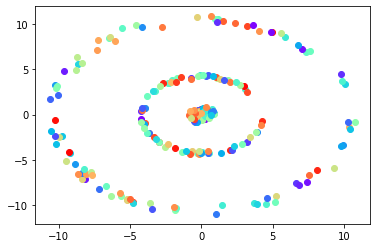

number of clusters 248


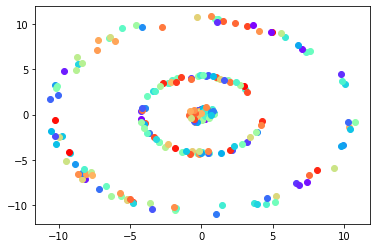

number of clusters 247


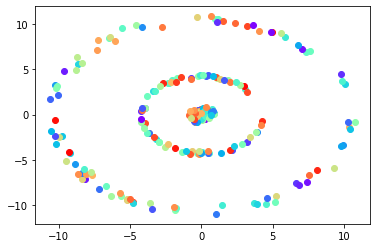

number of clusters 246


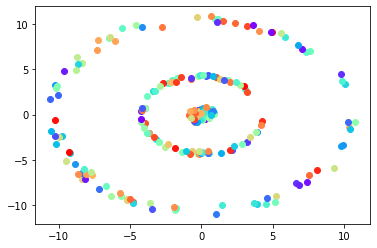

number of clusters 245


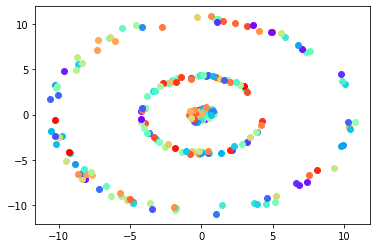

number of clusters 244


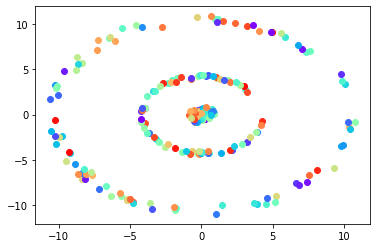

number of clusters 243


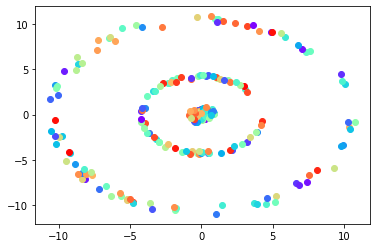

number of clusters 242


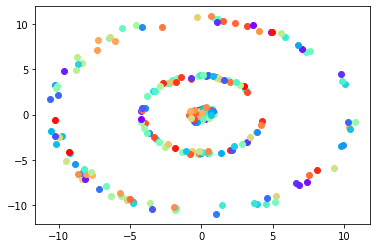

number of clusters 241


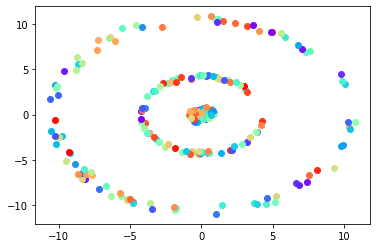

number of clusters 240


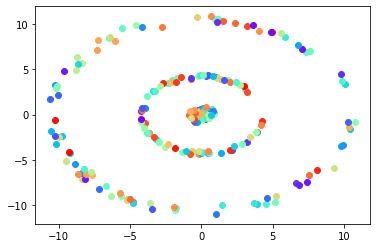

number of clusters 239


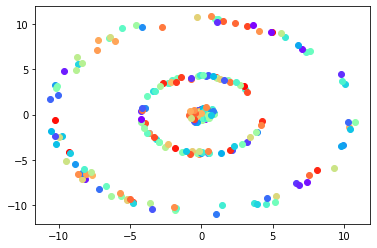

number of clusters 238


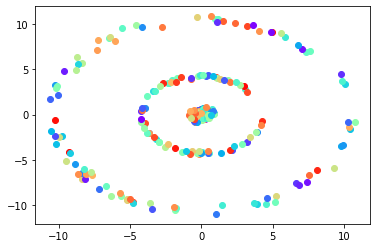

number of clusters 237


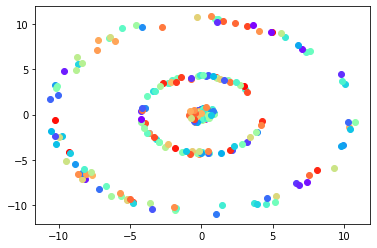

number of clusters 236


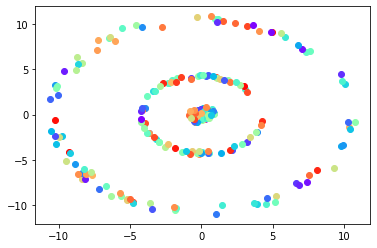

number of clusters 235


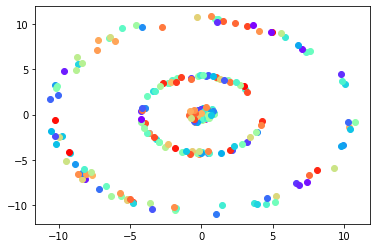

number of clusters 234


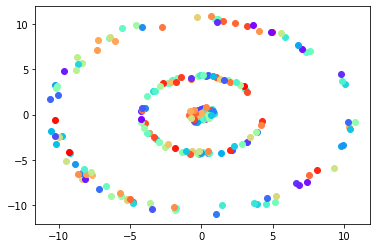

number of clusters 233


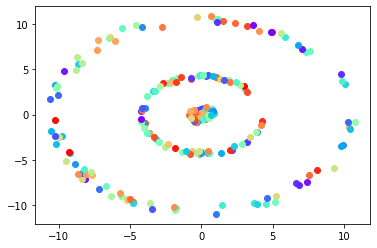

number of clusters 232


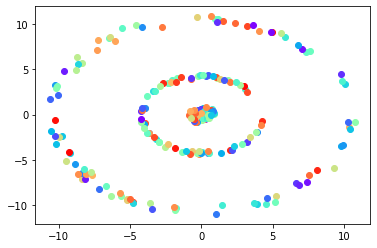

number of clusters 231


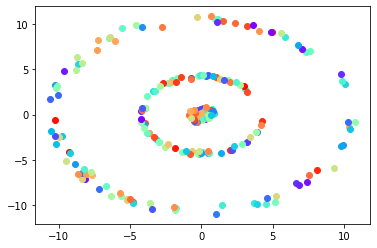

number of clusters 230


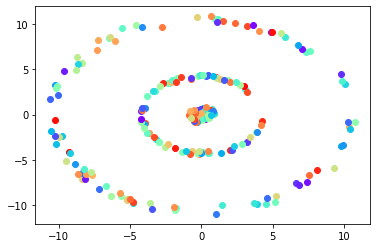

number of clusters 229


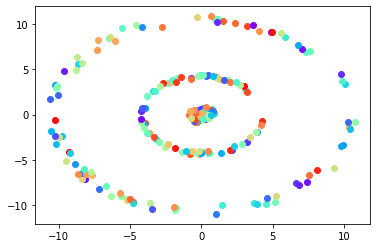

number of clusters 228


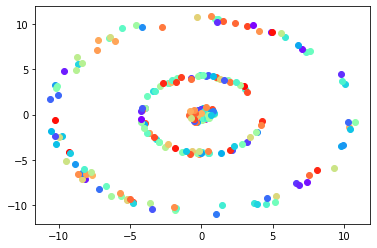

number of clusters 227


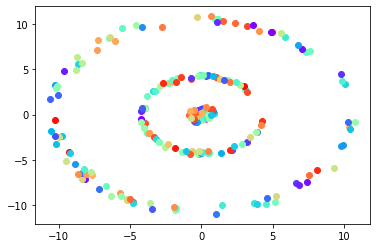

number of clusters 226


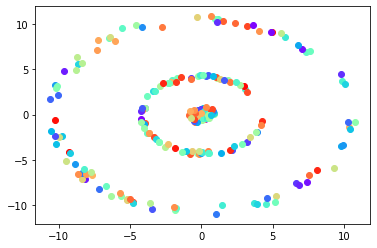

number of clusters 225


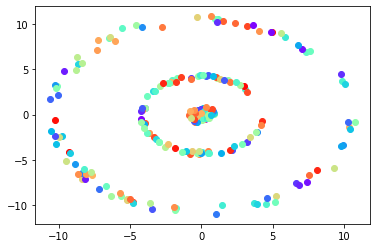

number of clusters 224


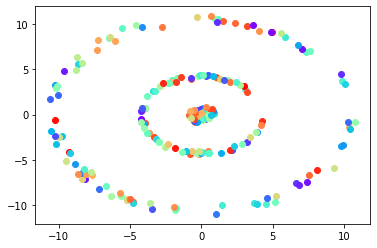

number of clusters 223


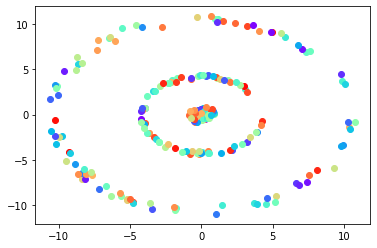

number of clusters 222


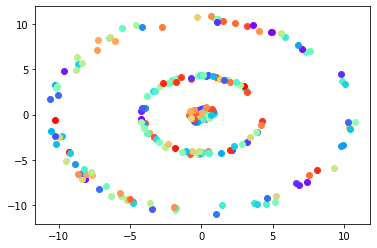

number of clusters 221


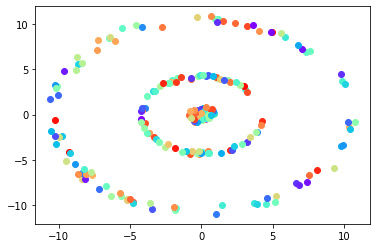

number of clusters 220


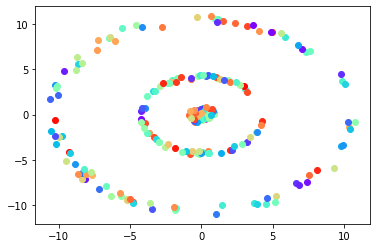

number of clusters 219


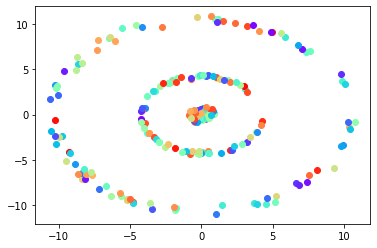

number of clusters 218


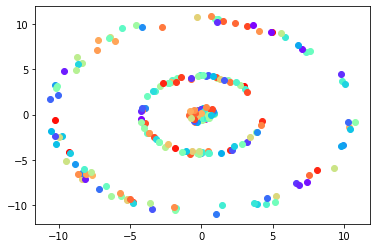

number of clusters 217


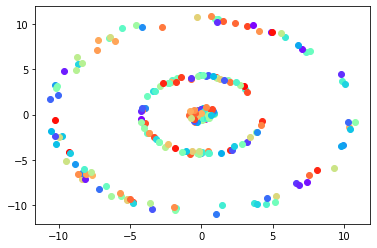

number of clusters 216


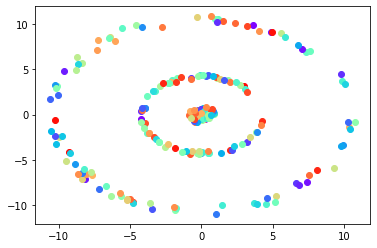

number of clusters 215


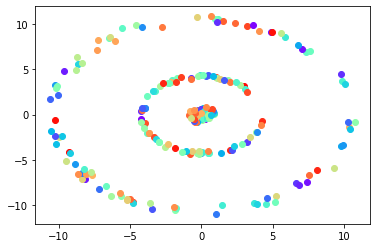

number of clusters 214


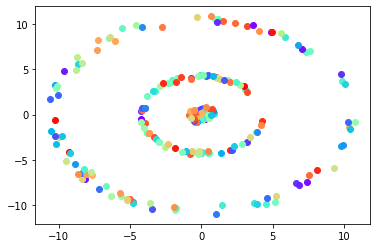

number of clusters 213


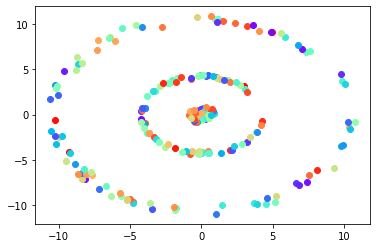

number of clusters 212


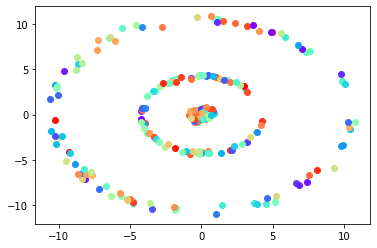

number of clusters 211


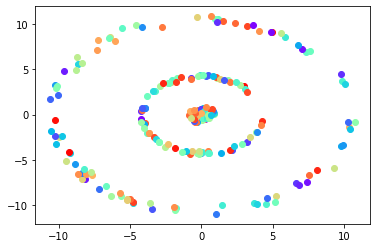

number of clusters 210


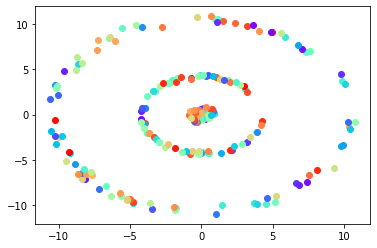

number of clusters 209


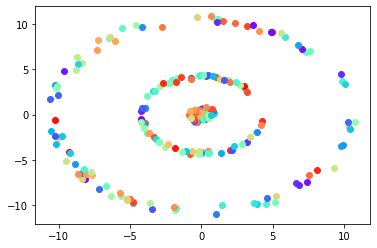

number of clusters 208


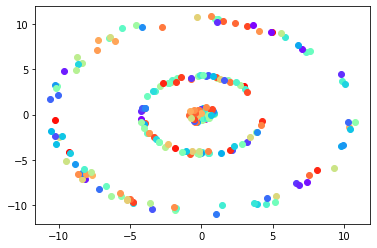

number of clusters 207


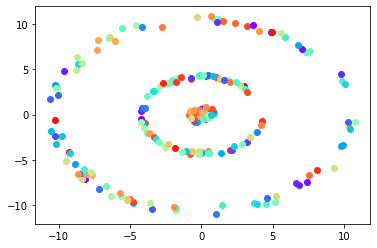

number of clusters 206


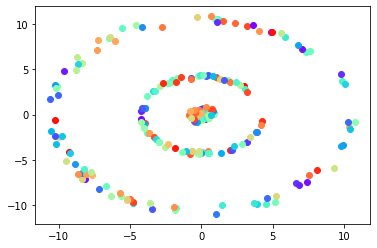

number of clusters 205


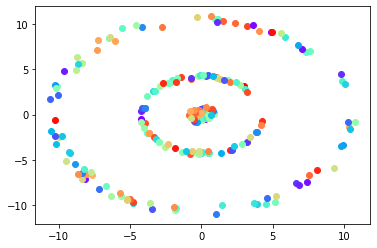

number of clusters 204


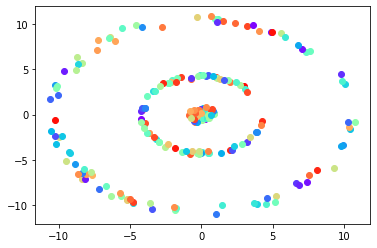

number of clusters 203


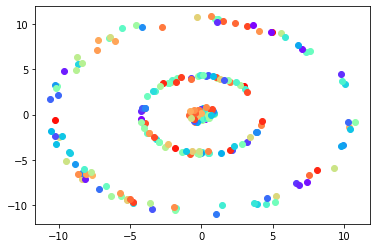

number of clusters 202


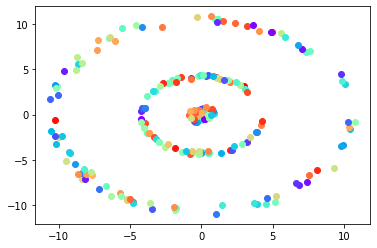

number of clusters 201


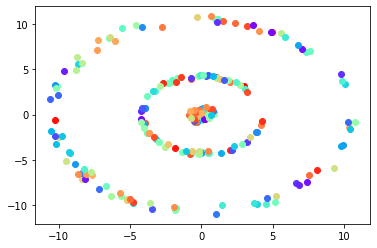

number of clusters 200


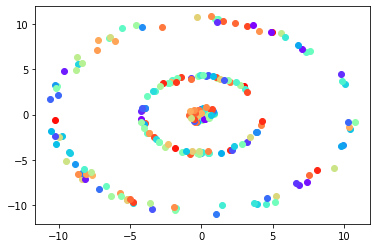

number of clusters 199


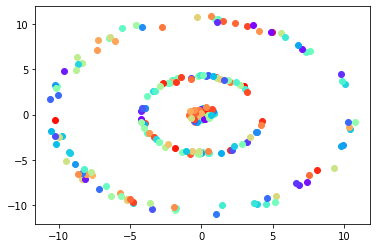

number of clusters 198


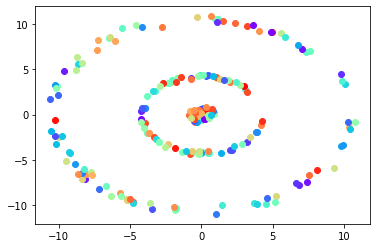

number of clusters 197


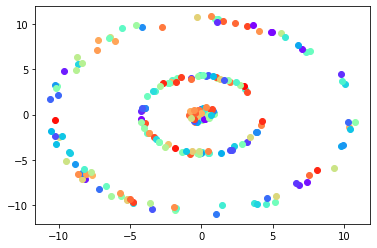

number of clusters 196


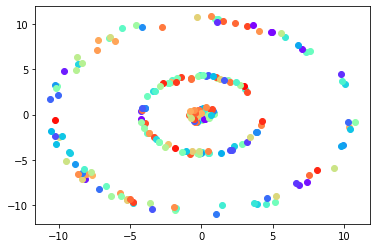

number of clusters 195


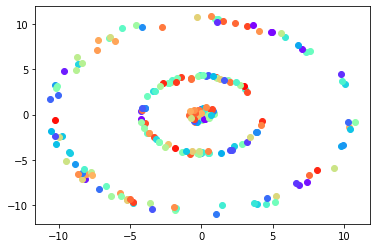

number of clusters 194


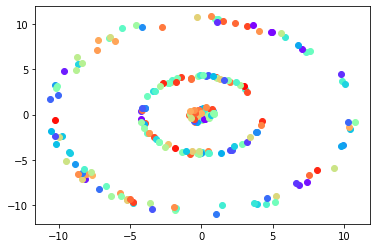

number of clusters 193


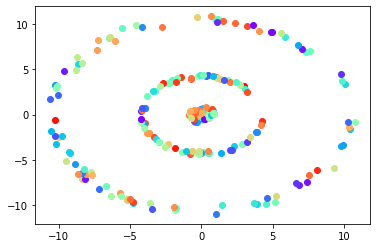

number of clusters 192


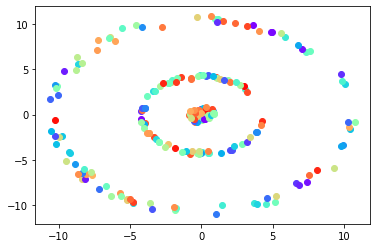

number of clusters 191


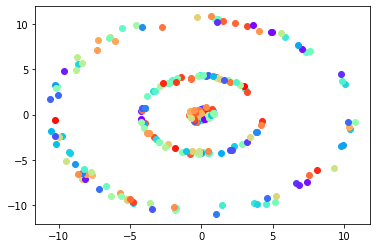

number of clusters 190


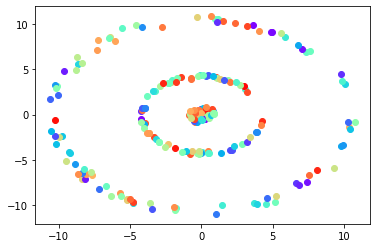

number of clusters 189


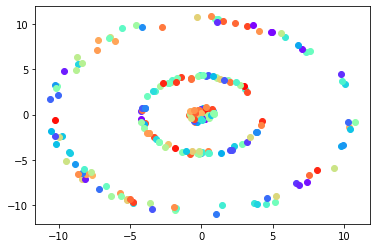

number of clusters 188


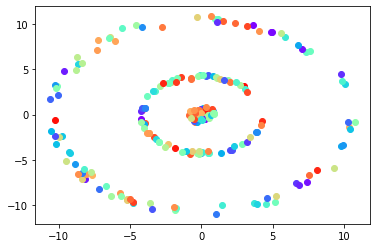

number of clusters 187


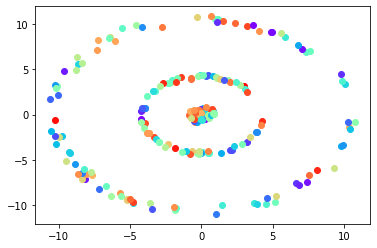

number of clusters 186


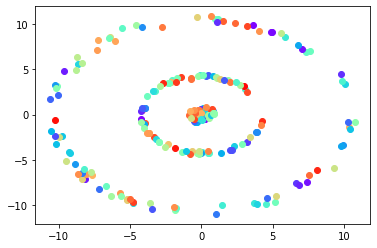

number of clusters 185


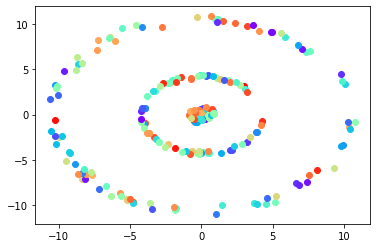

number of clusters 184


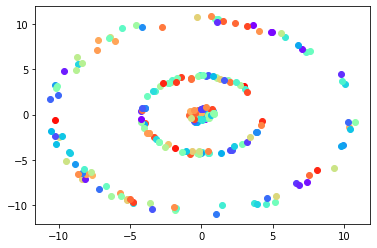

number of clusters 183


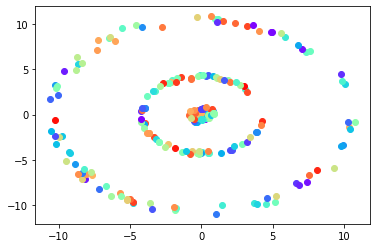

number of clusters 182


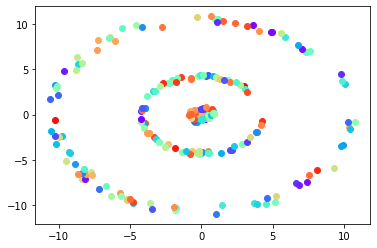

number of clusters 181


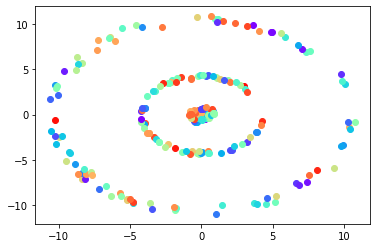

number of clusters 180


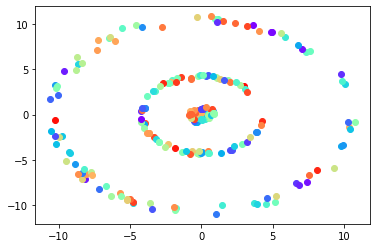

number of clusters 179


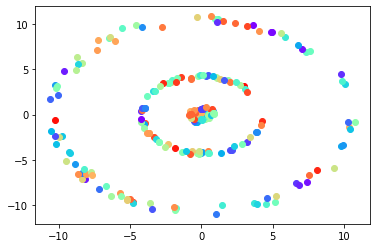

number of clusters 178


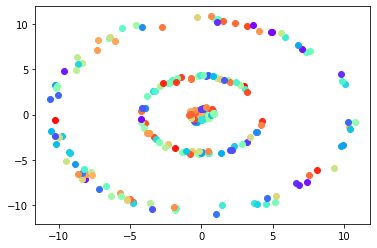

number of clusters 177


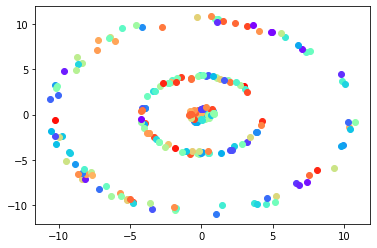

number of clusters 176


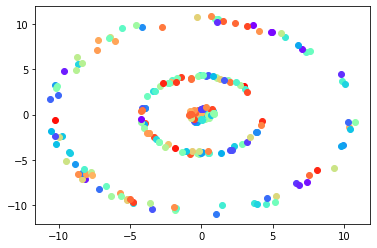

number of clusters 175


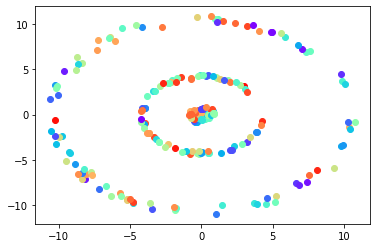

number of clusters 174


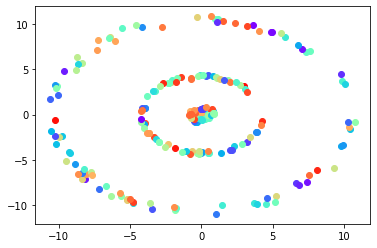

number of clusters 173


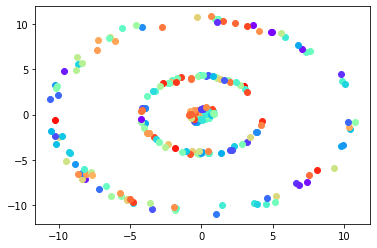

number of clusters 172


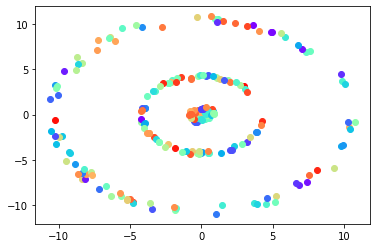

number of clusters 171


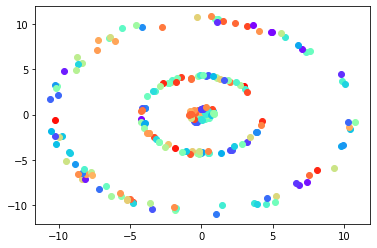

number of clusters 170


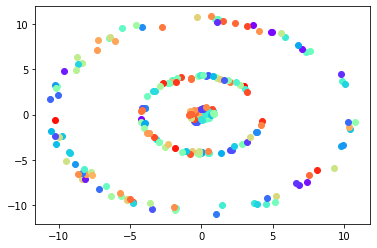

number of clusters 169


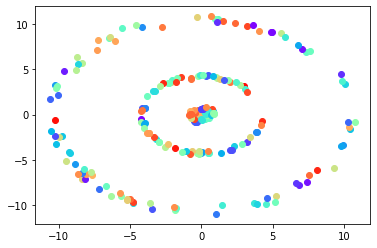

number of clusters 168


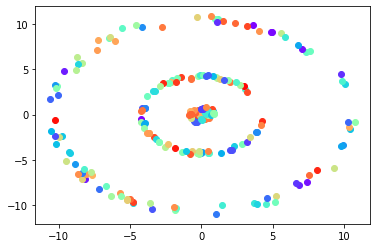

number of clusters 167


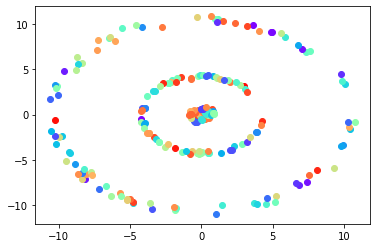

number of clusters 166


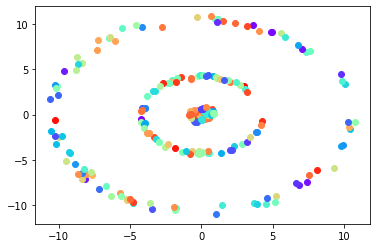

number of clusters 165


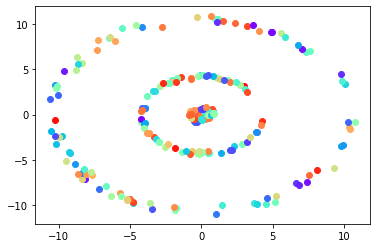

number of clusters 164


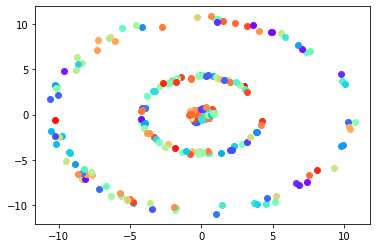

number of clusters 163


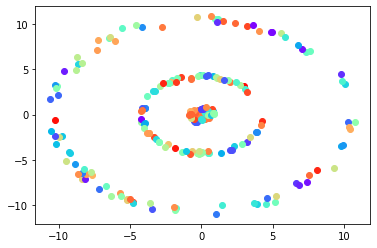

number of clusters 162


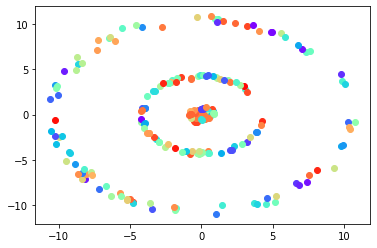

number of clusters 161


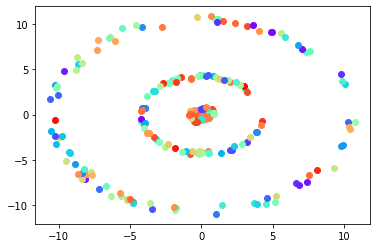

number of clusters 160


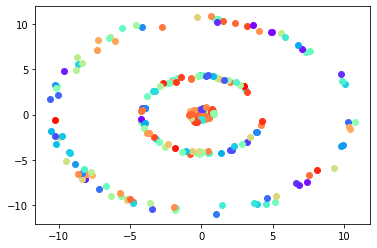

number of clusters 159


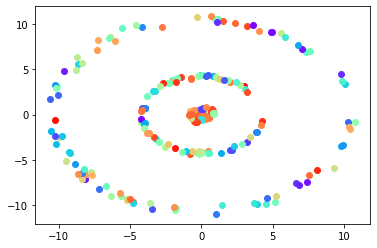

number of clusters 158


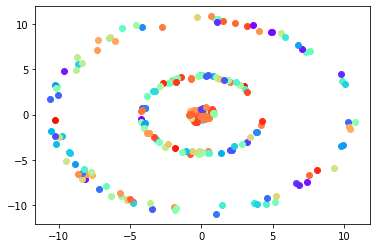

number of clusters 157


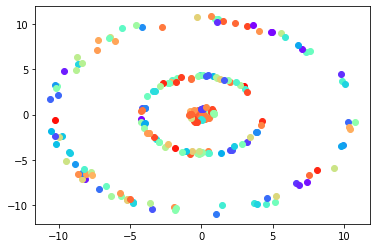

number of clusters 156


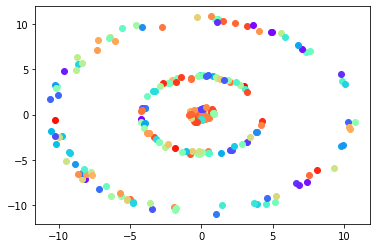

number of clusters 155


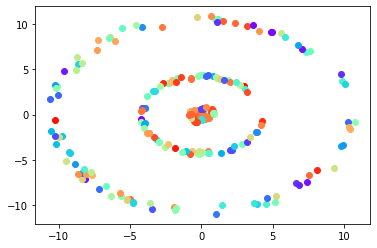

number of clusters 154


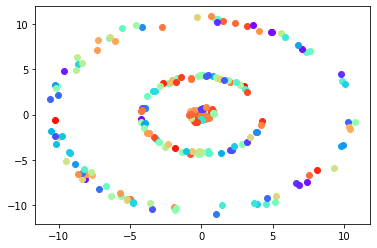

number of clusters 153


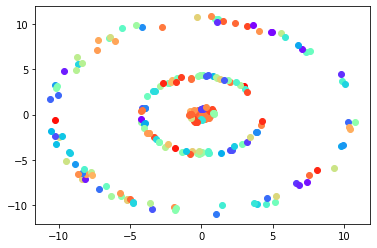

number of clusters 152


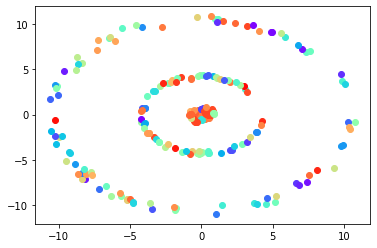

number of clusters 151


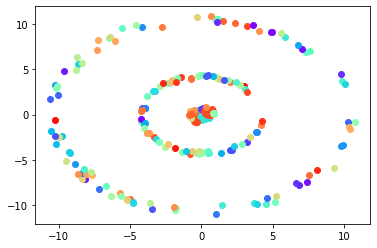

number of clusters 150


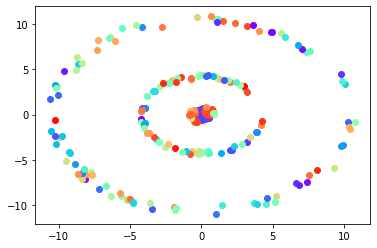

number of clusters 149


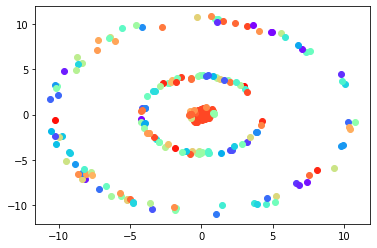

number of clusters 148


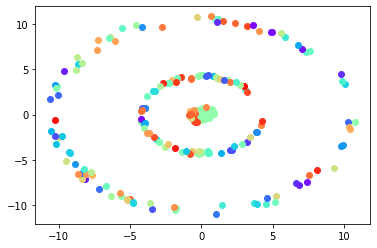

number of clusters 147


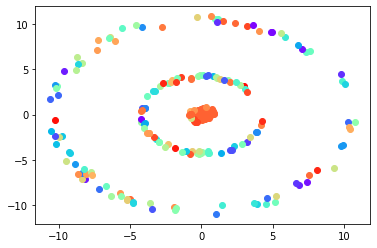

number of clusters 146


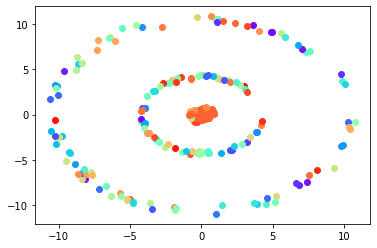

number of clusters 145


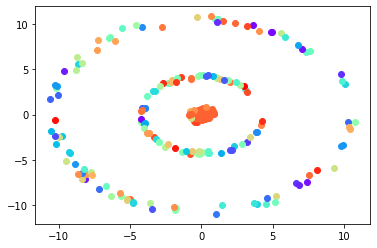

number of clusters 144


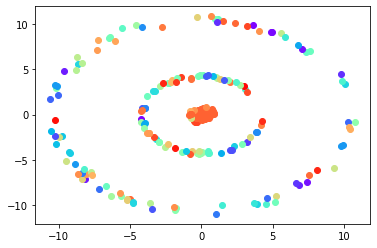

number of clusters 143


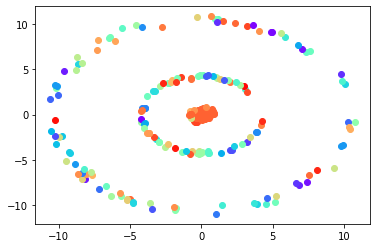

number of clusters 142


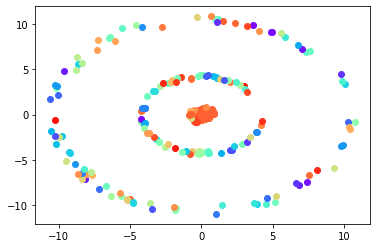

number of clusters 141


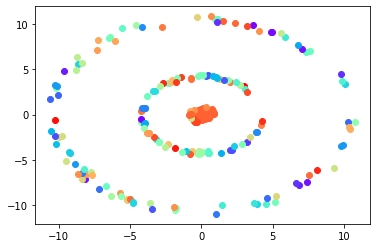

number of clusters 140


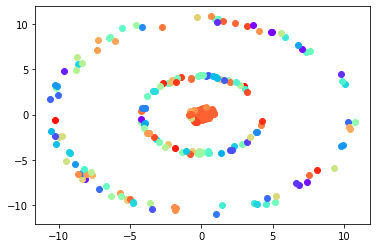

number of clusters 139


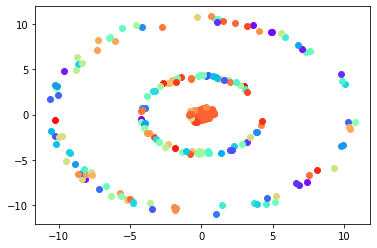

number of clusters 138


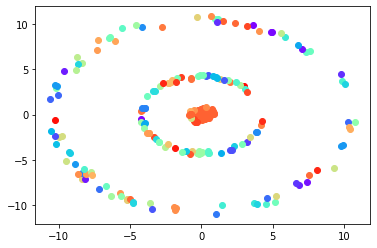

number of clusters 137


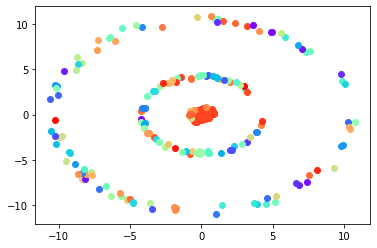

number of clusters 136


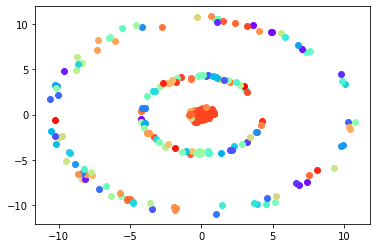

number of clusters 135


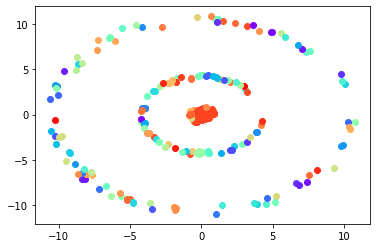

number of clusters 134


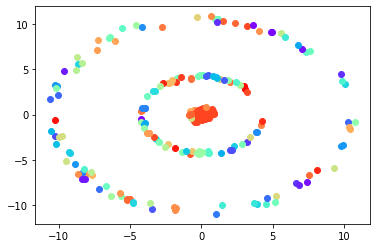

number of clusters 133


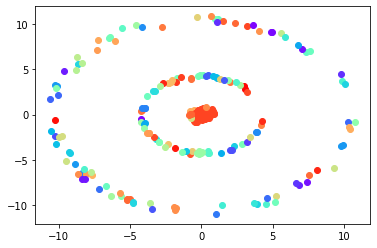

number of clusters 132


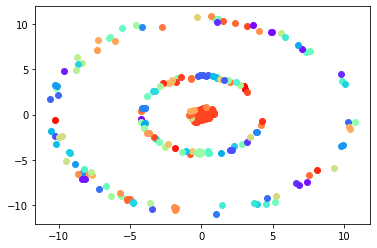

number of clusters 131


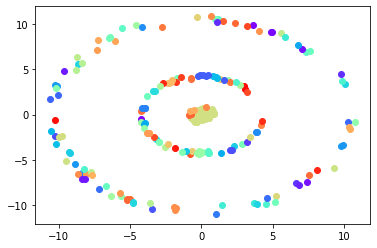

number of clusters 130


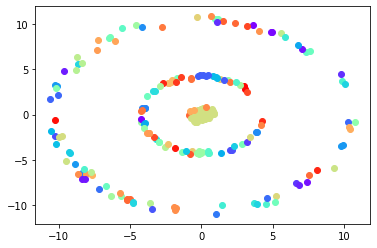

number of clusters 129


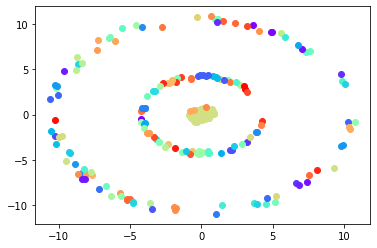

number of clusters 128


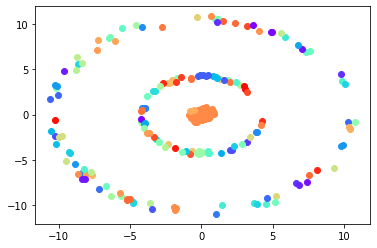

number of clusters 127


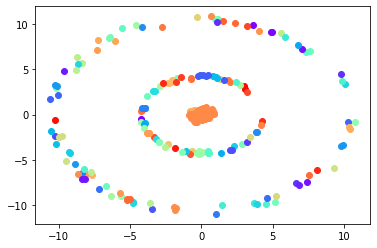

number of clusters 126


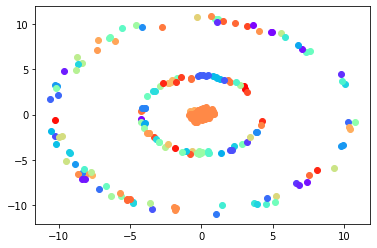

number of clusters 125


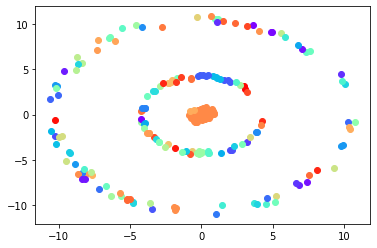

number of clusters 124


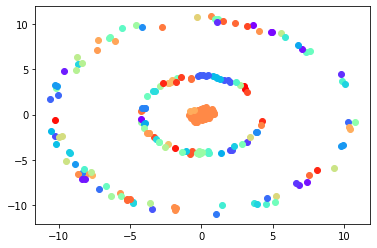

number of clusters 123


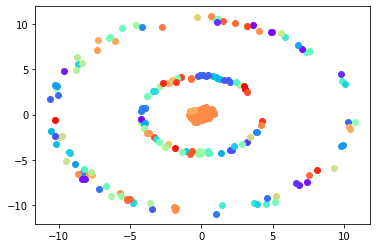

number of clusters 122


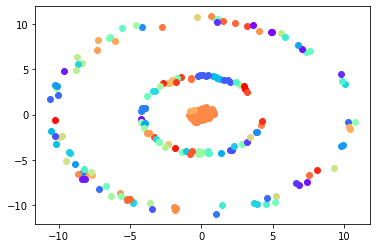

number of clusters 121


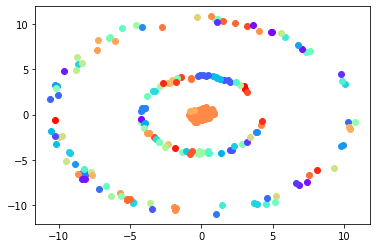

number of clusters 120


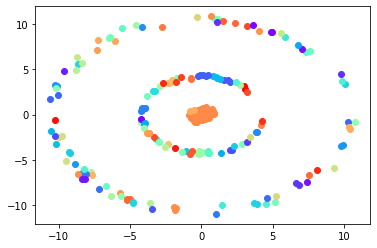

number of clusters 119


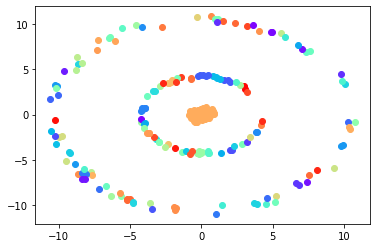

number of clusters 118


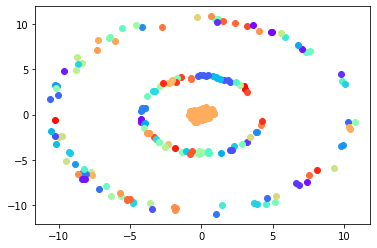

number of clusters 117


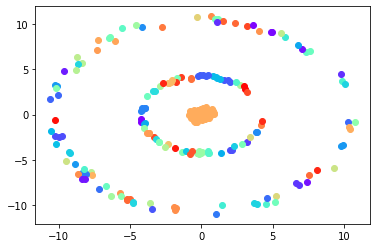

number of clusters 116


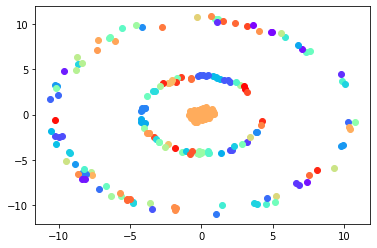

number of clusters 115


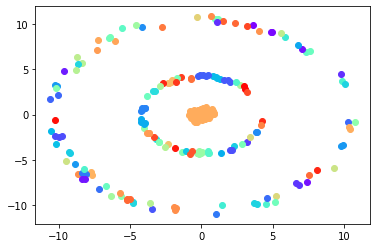

number of clusters 114


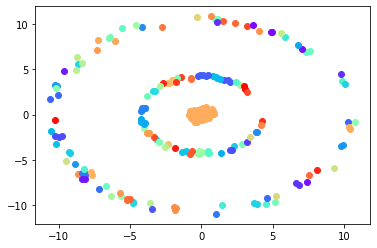

number of clusters 113


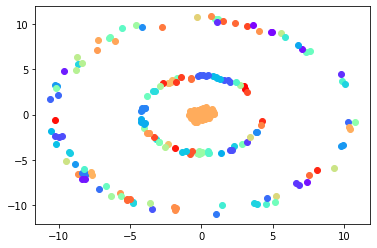

number of clusters 112


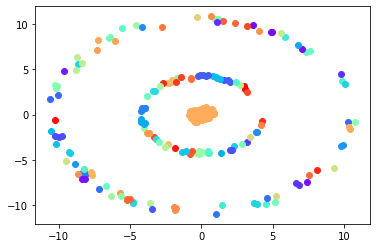

number of clusters 111


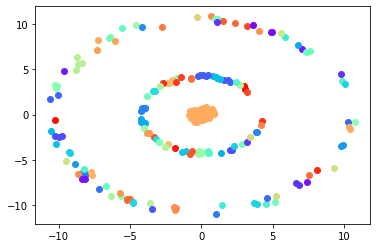

number of clusters 110


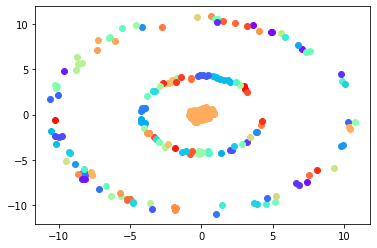

number of clusters 109


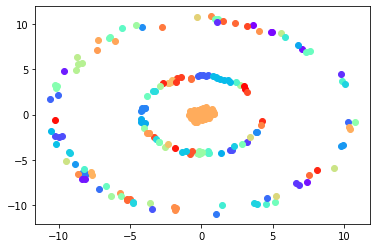

number of clusters 108


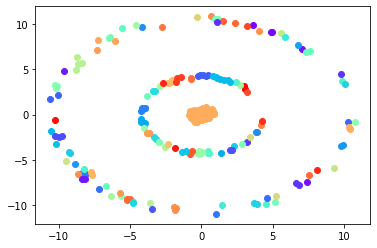

number of clusters 107


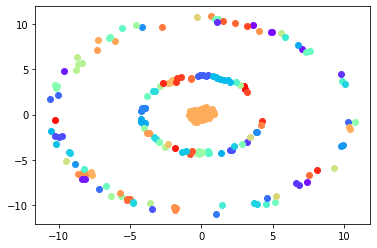

number of clusters 106


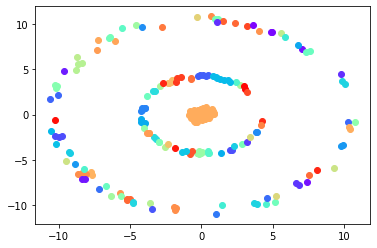

number of clusters 105


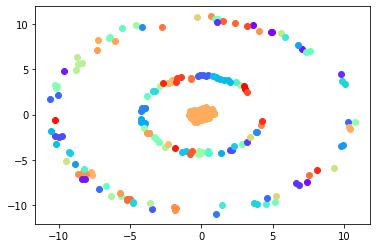

number of clusters 104


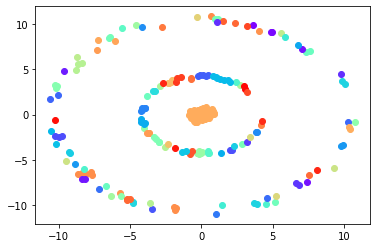

number of clusters 103


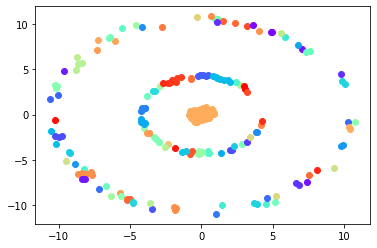

number of clusters 102


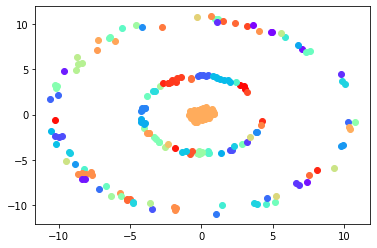

number of clusters 101


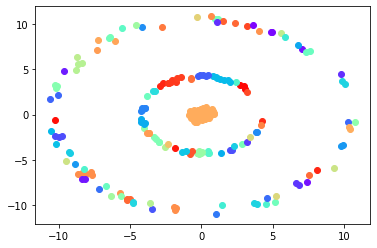

number of clusters 100


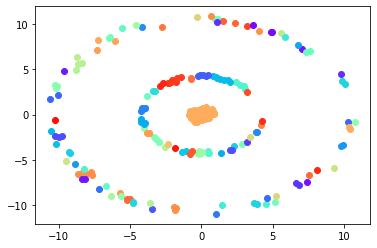

number of clusters 99


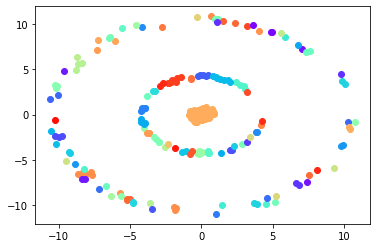

number of clusters 98


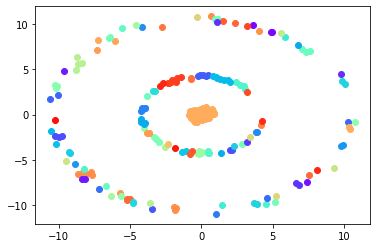

number of clusters 97


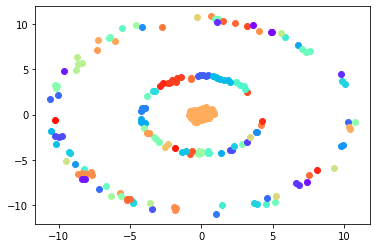

number of clusters 96


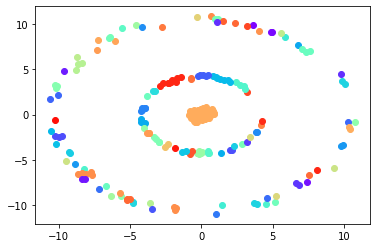

number of clusters 95


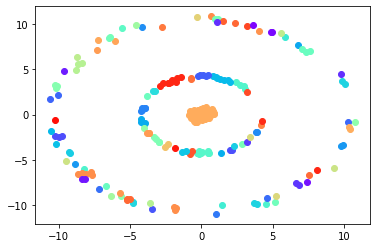

number of clusters 94


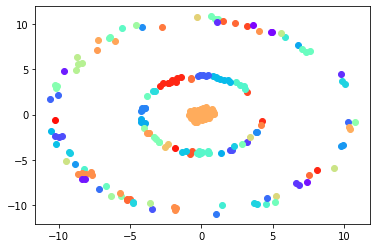

number of clusters 93


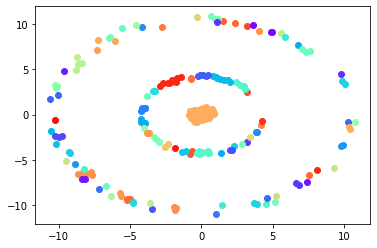

number of clusters 92


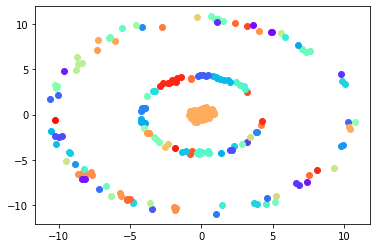

number of clusters 91


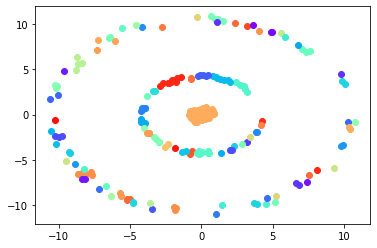

number of clusters 90


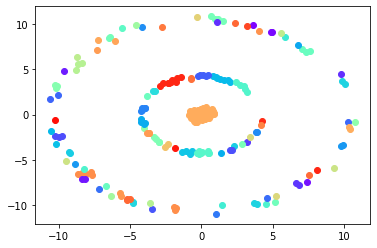

number of clusters 89


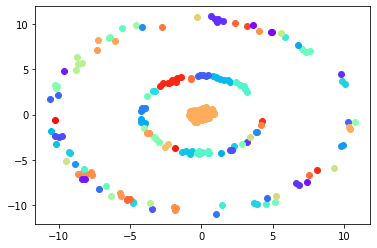

number of clusters 88


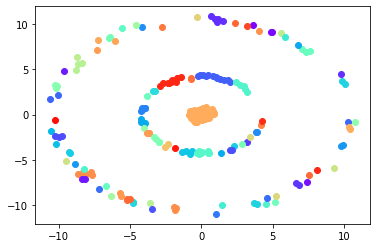

number of clusters 87


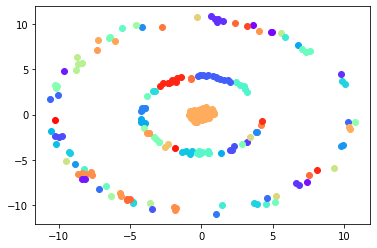

number of clusters 86


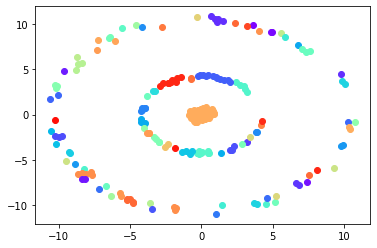

number of clusters 85


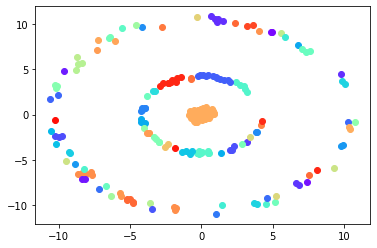

number of clusters 84


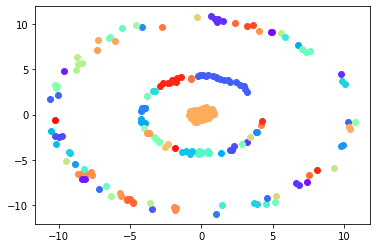

number of clusters 83


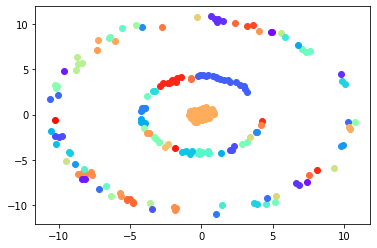

number of clusters 82


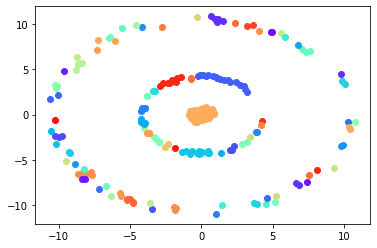

number of clusters 81


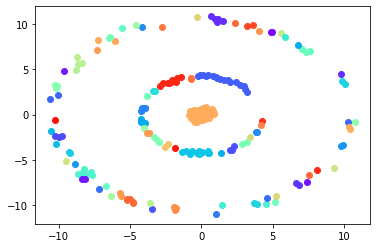

number of clusters 80


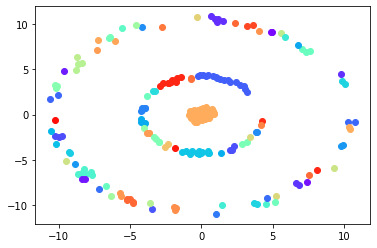

number of clusters 79


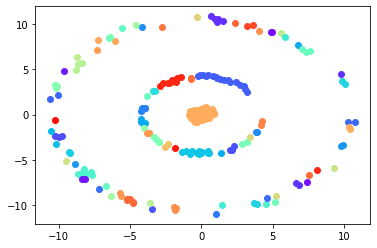

number of clusters 78


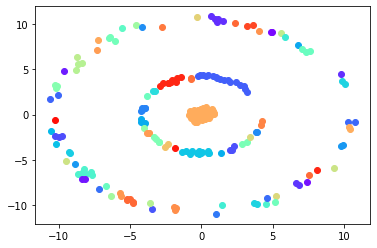

number of clusters 77


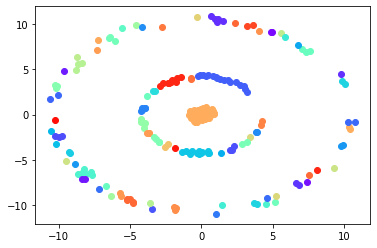

number of clusters 76


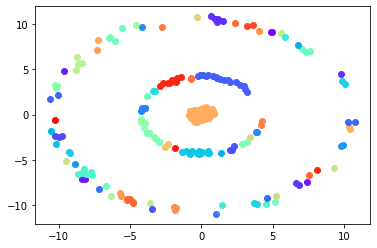

number of clusters 75


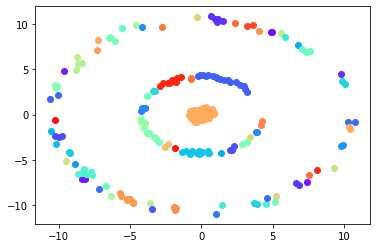

number of clusters 74


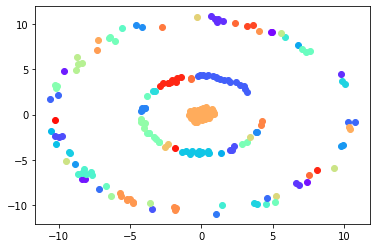

number of clusters 73


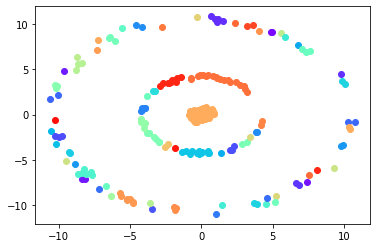

number of clusters 72


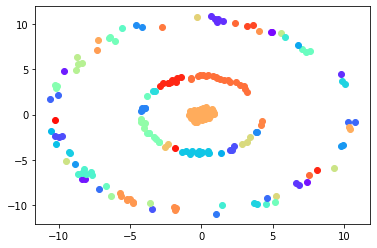

number of clusters 71


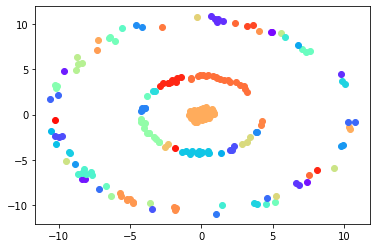

number of clusters 70


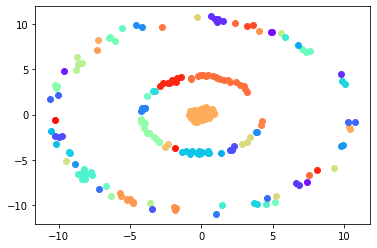

number of clusters 69


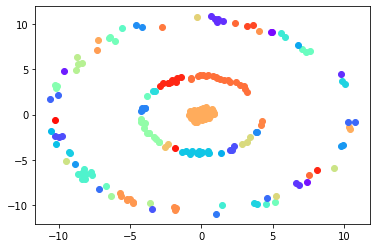

number of clusters 68


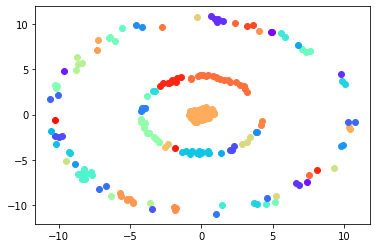

number of clusters 67


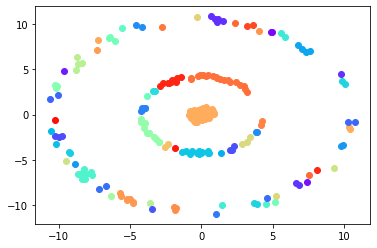

number of clusters 66


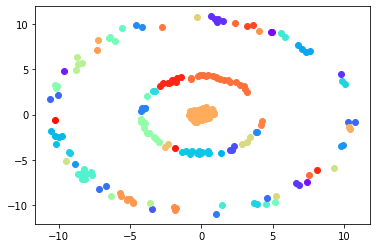

number of clusters 65


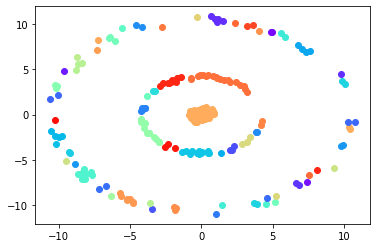

number of clusters 64


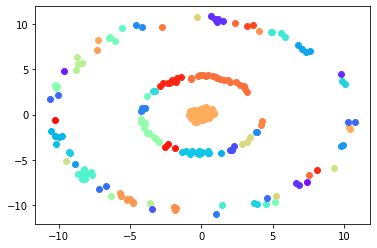

number of clusters 63


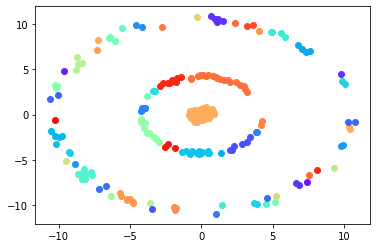

number of clusters 62


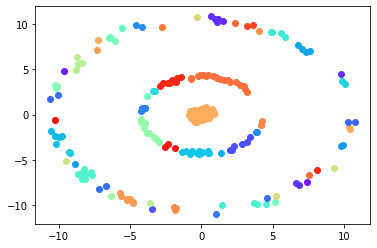

number of clusters 61


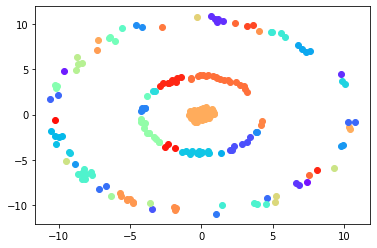

number of clusters 60


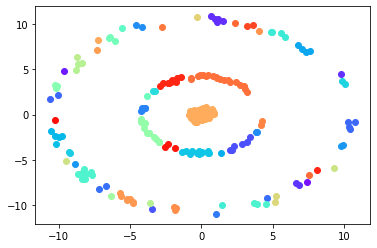

number of clusters 59


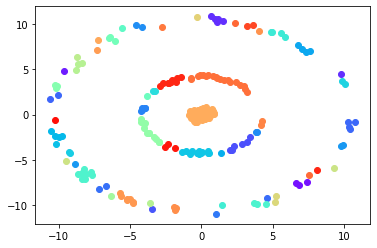

number of clusters 58


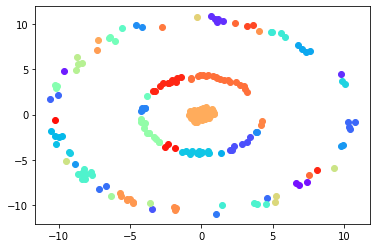

number of clusters 57


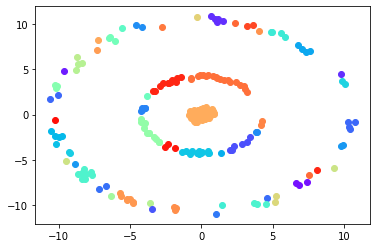

number of clusters 56


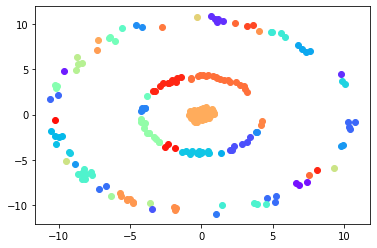

number of clusters 55


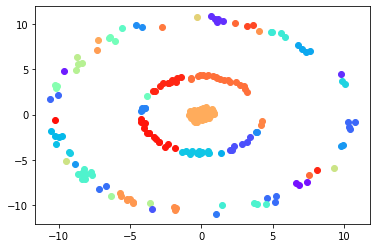

number of clusters 54


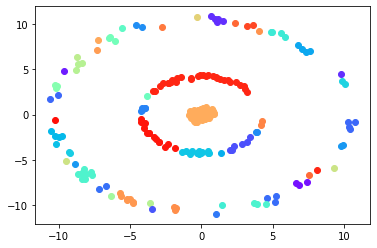

number of clusters 53


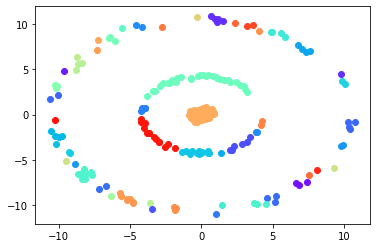

number of clusters 52


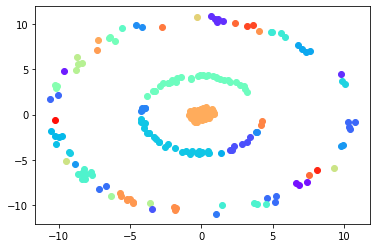

number of clusters 51


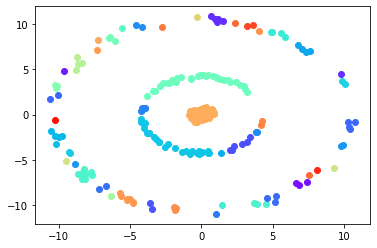

number of clusters 50


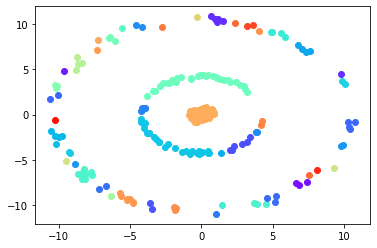

number of clusters 49


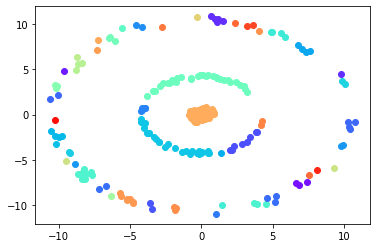

number of clusters 48


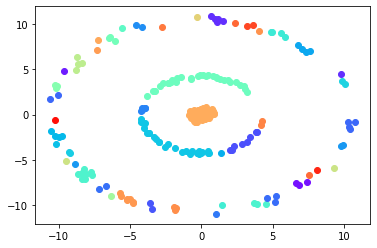

number of clusters 47


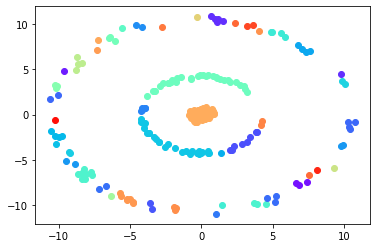

number of clusters 46


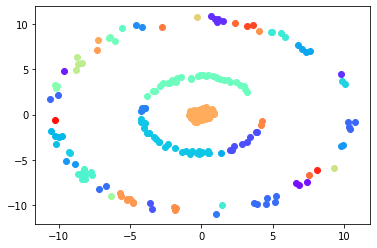

number of clusters 45


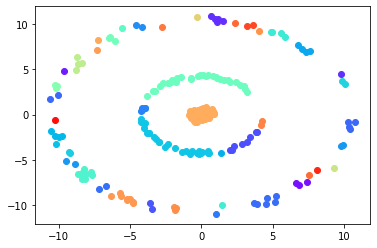

number of clusters 44


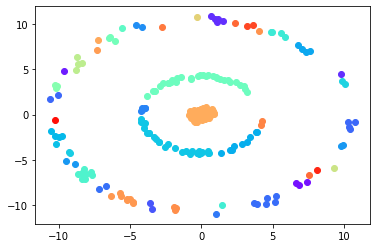

number of clusters 43


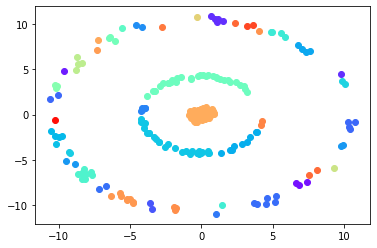

number of clusters 42


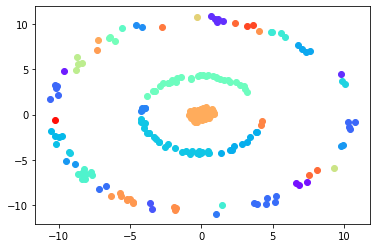

number of clusters 41


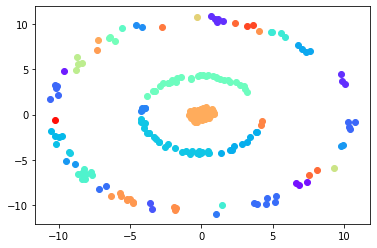

number of clusters 40


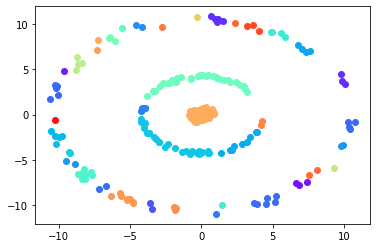

number of clusters 39


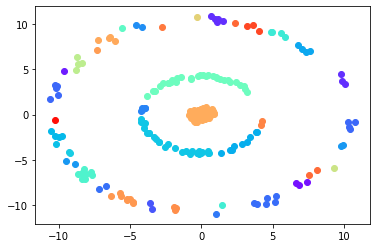

number of clusters 38


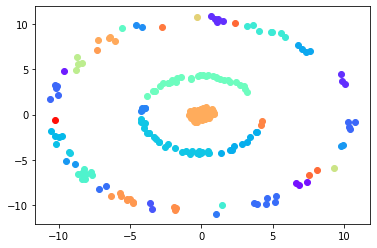

number of clusters 37


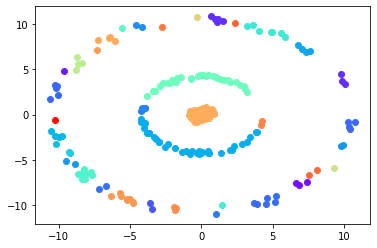

number of clusters 36


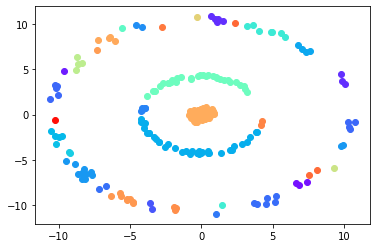

number of clusters 35


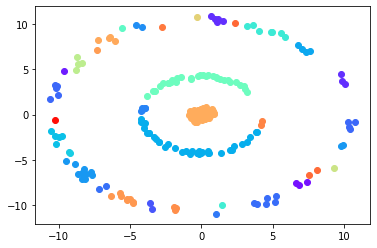

number of clusters 34


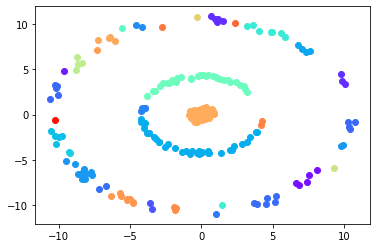

number of clusters 33


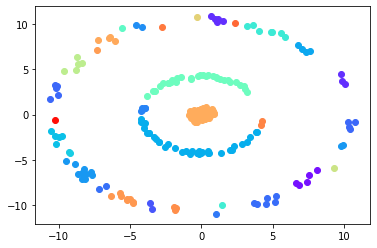

number of clusters 32


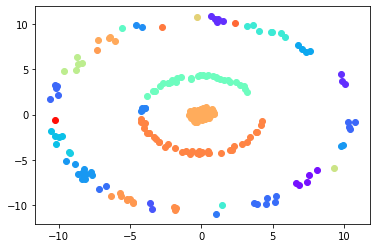

number of clusters 31


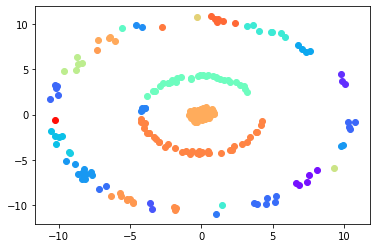

number of clusters 30


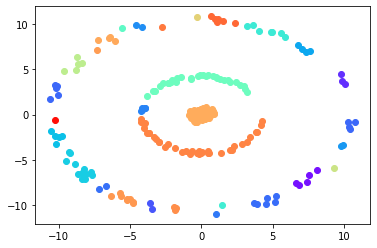

number of clusters 29


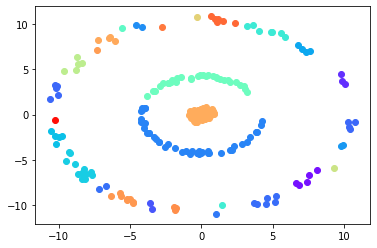

number of clusters 28


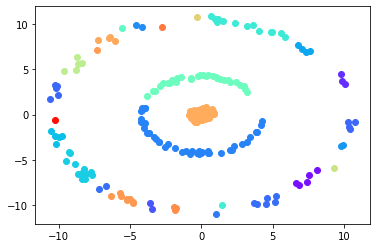

number of clusters 27


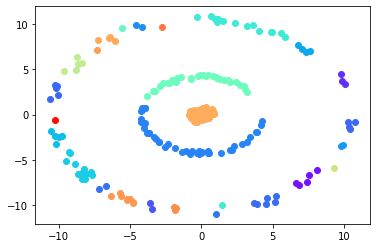

number of clusters 26


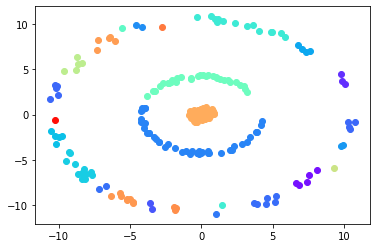

number of clusters 25


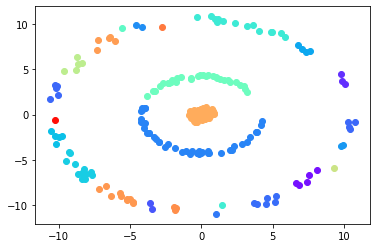

number of clusters 24


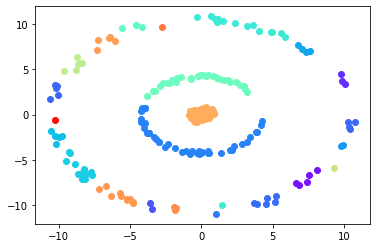

number of clusters 23


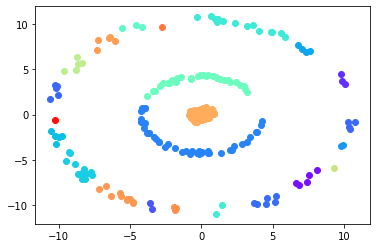

number of clusters 22


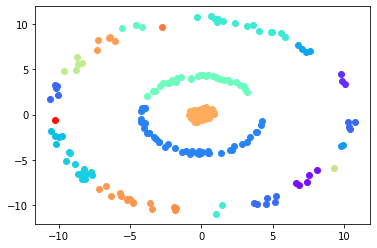

number of clusters 21


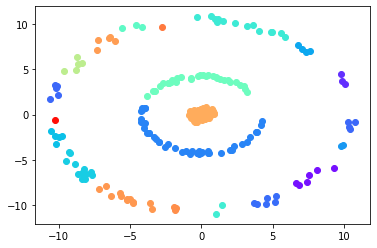

number of clusters 20


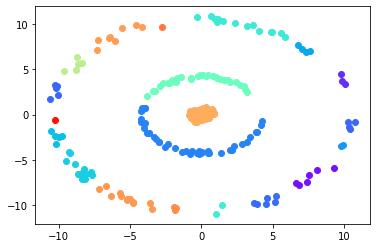

number of clusters 19


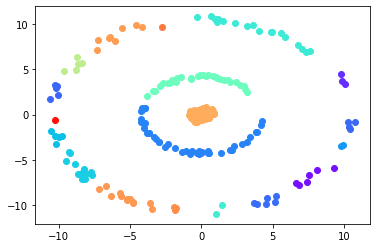

number of clusters 18


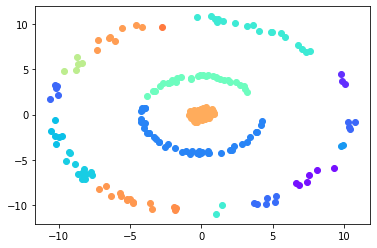

number of clusters 17


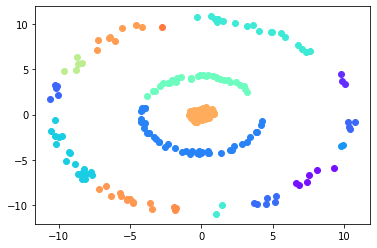

number of clusters 16


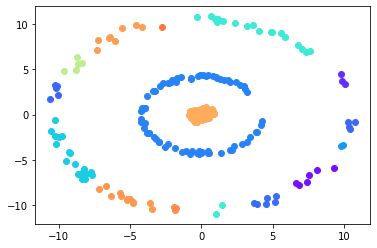

number of clusters 15


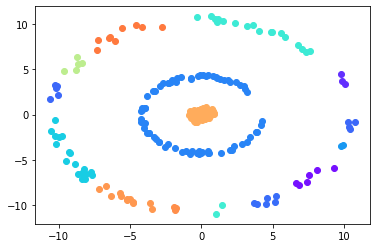

number of clusters 14


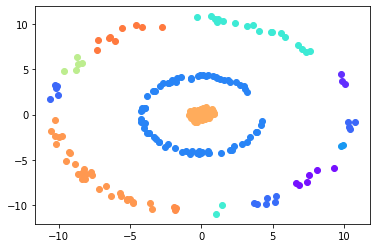

number of clusters 13


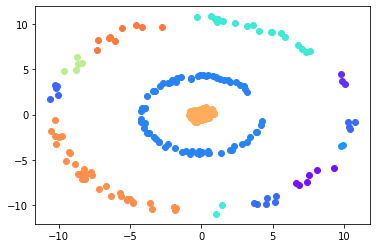

number of clusters 12


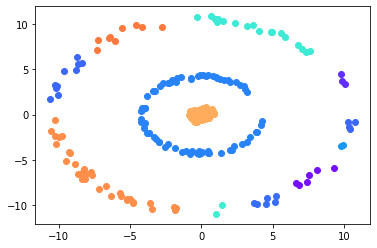

number of clusters 11


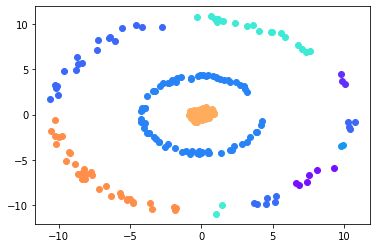

number of clusters 10


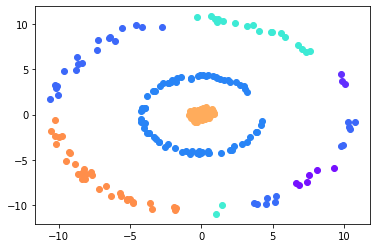

number of clusters 9


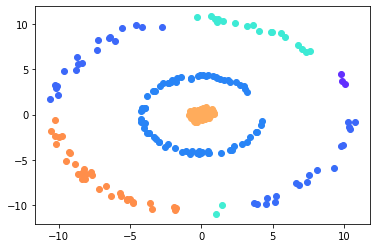

number of clusters 8


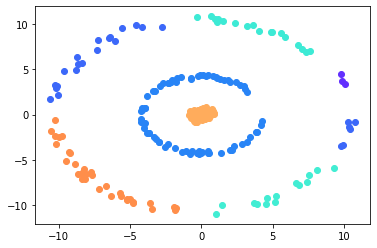

number of clusters 7


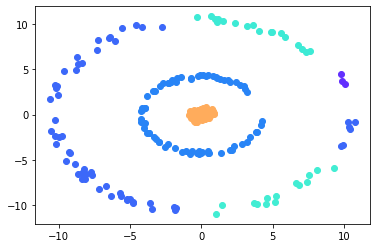

number of clusters 6


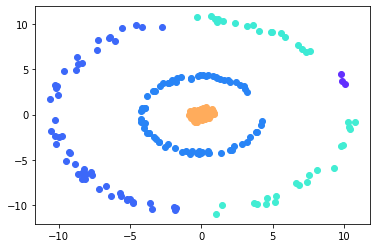

number of clusters 5


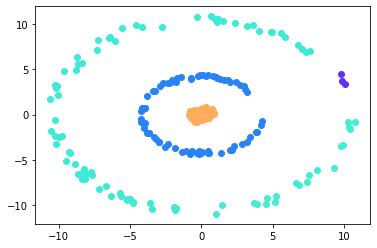

number of clusters 4


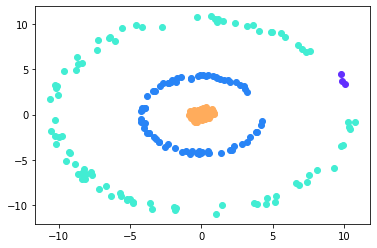

number of clusters 3


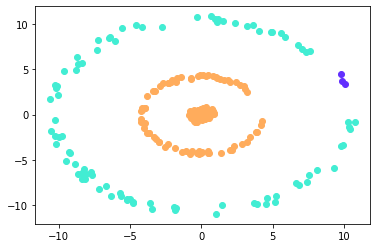

number of clusters 2


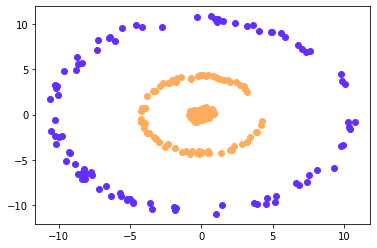

number of clusters 1


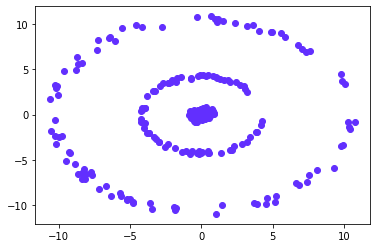

In [ ]:
df = dfex1_reduced
agglomerate(df)

number of clusters 249


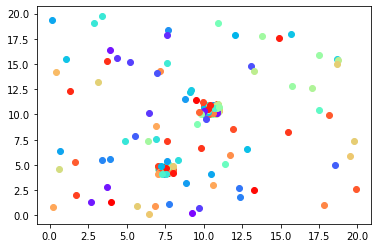

number of clusters 248


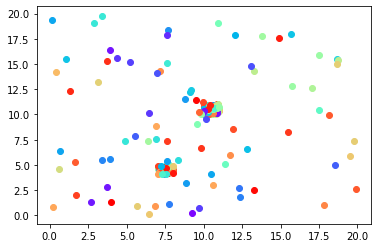

number of clusters 247


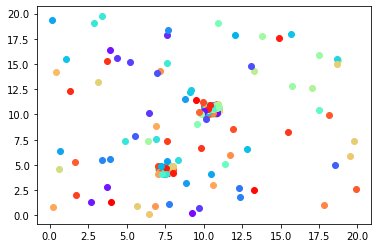

number of clusters 246


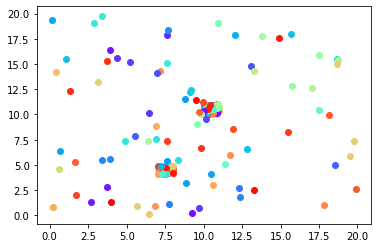

number of clusters 245


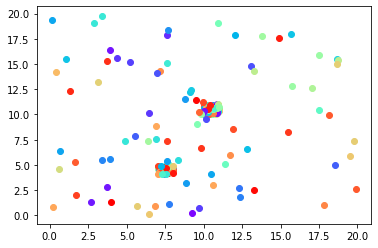

number of clusters 244


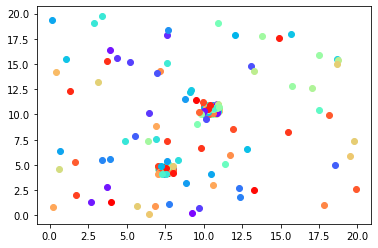

number of clusters 243


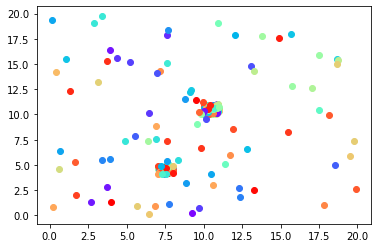

number of clusters 242


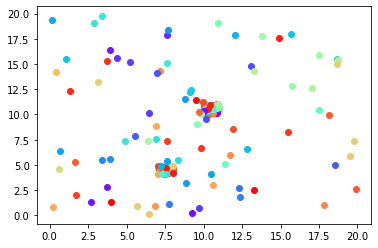

number of clusters 241


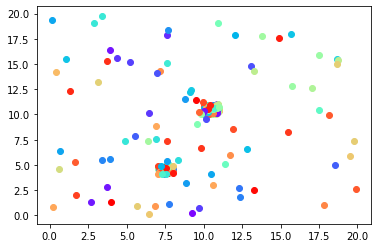

number of clusters 240


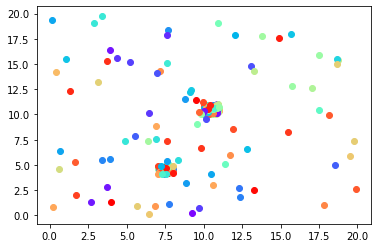

number of clusters 239


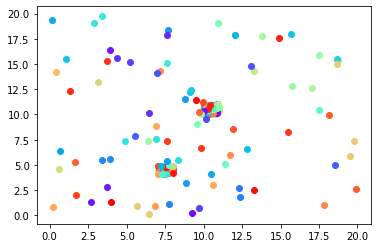

number of clusters 238


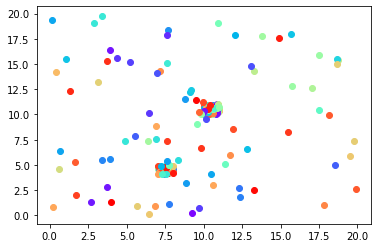

number of clusters 237


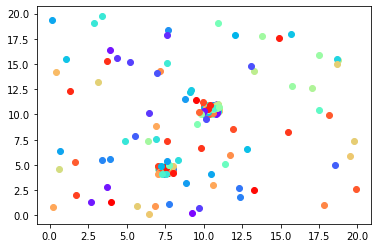

number of clusters 236


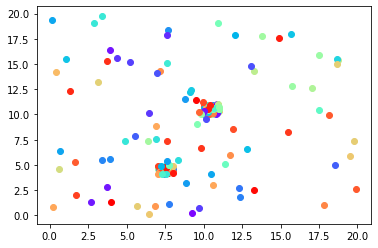

number of clusters 235


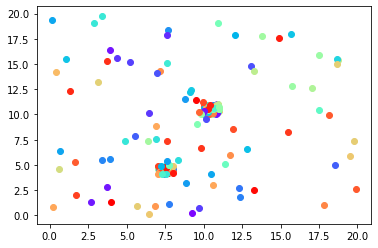

number of clusters 234


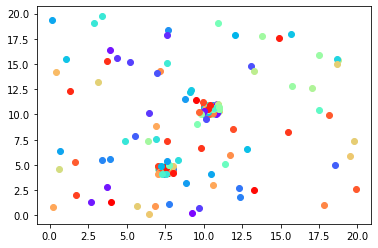

number of clusters 233


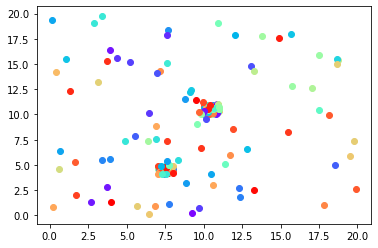

number of clusters 232


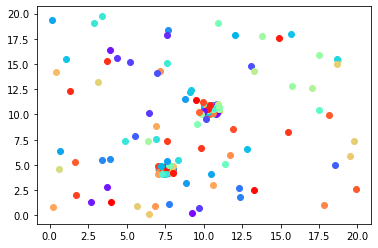

number of clusters 231


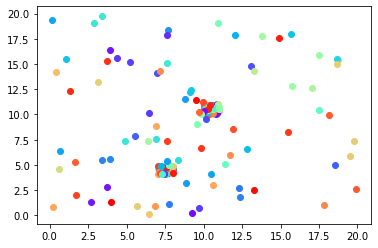

number of clusters 230


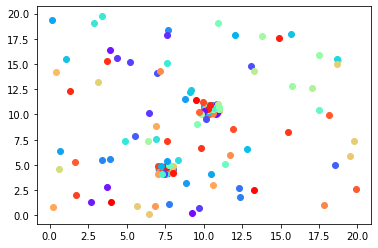

number of clusters 229


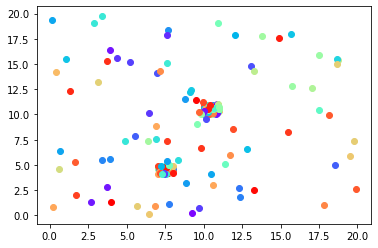

number of clusters 228


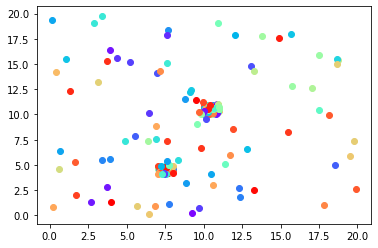

number of clusters 227


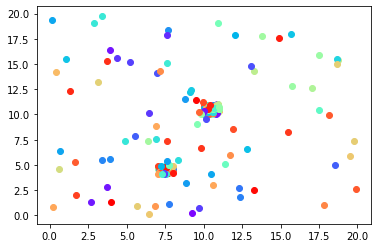

number of clusters 226


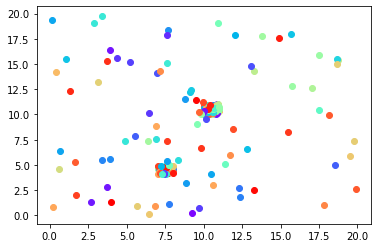

number of clusters 225


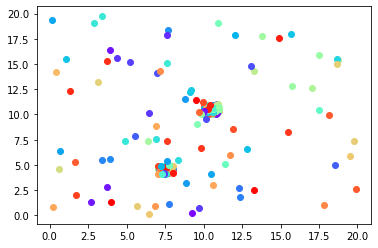

number of clusters 224


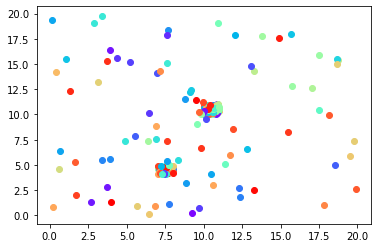

number of clusters 223


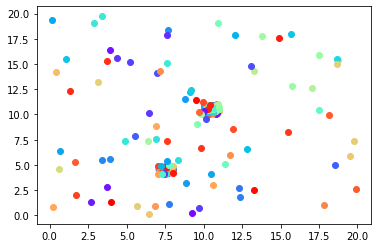

number of clusters 222


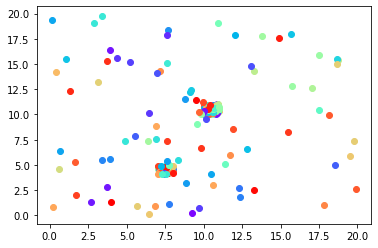

number of clusters 221


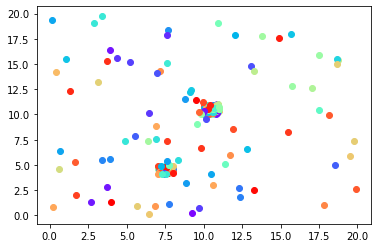

number of clusters 220


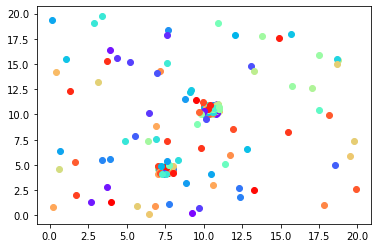

number of clusters 219


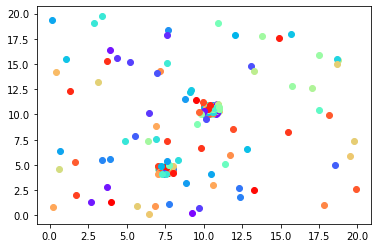

number of clusters 218


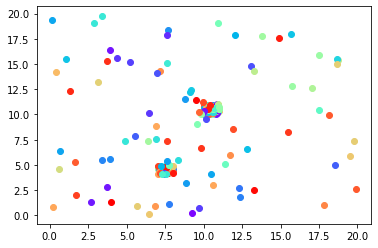

number of clusters 217


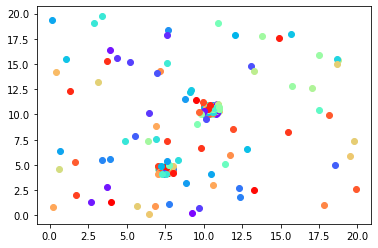

number of clusters 216


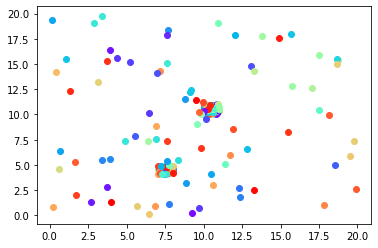

number of clusters 215


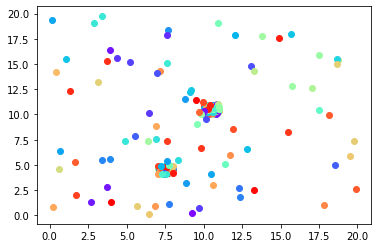

number of clusters 214


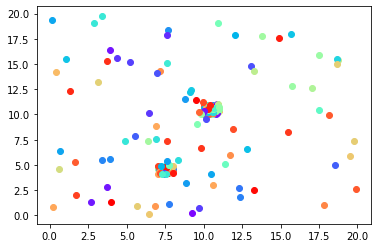

number of clusters 213


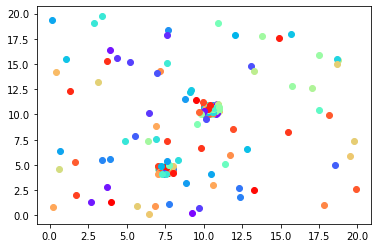

number of clusters 212


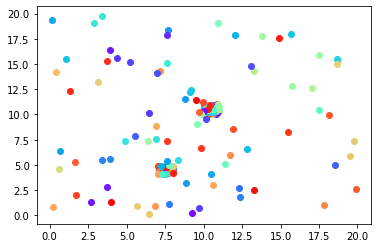

number of clusters 211


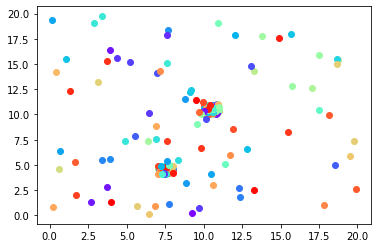

number of clusters 210


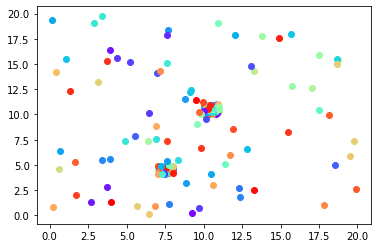

number of clusters 209


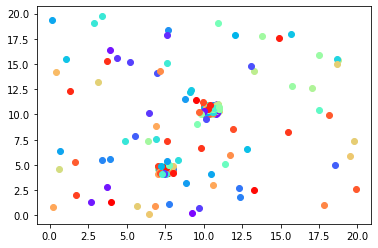

number of clusters 208


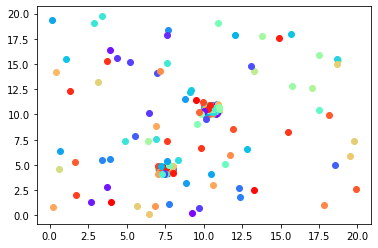

number of clusters 207


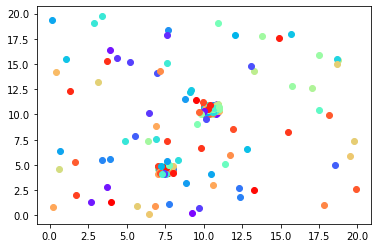

number of clusters 206


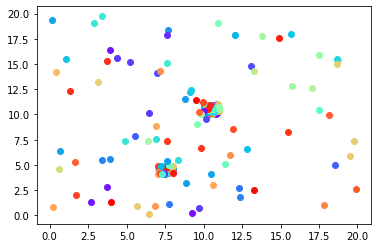

number of clusters 205


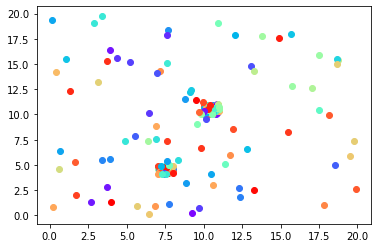

number of clusters 204


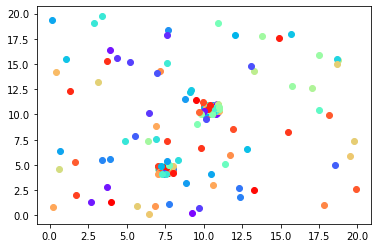

number of clusters 203


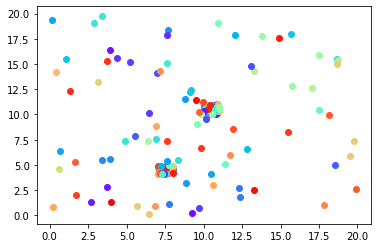

number of clusters 202


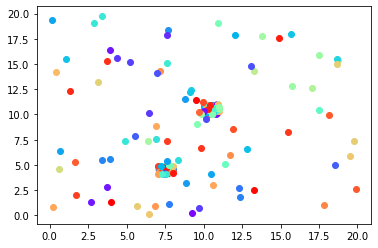

number of clusters 201


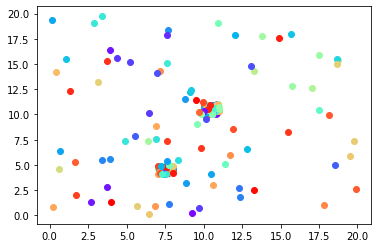

number of clusters 200


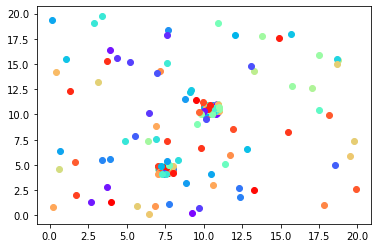

number of clusters 199


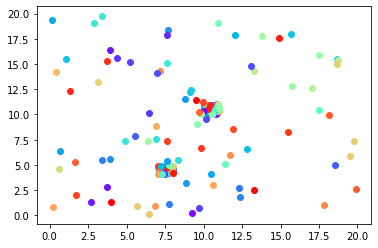

number of clusters 198


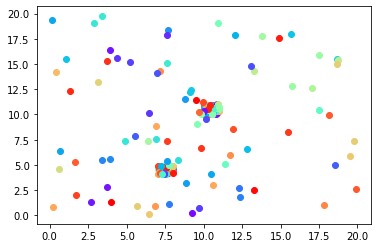

number of clusters 197


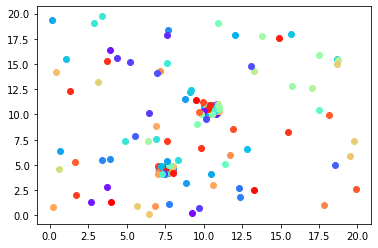

number of clusters 196


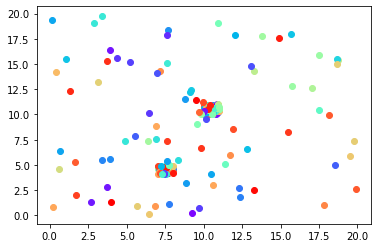

number of clusters 195


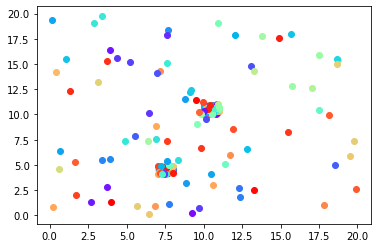

number of clusters 194


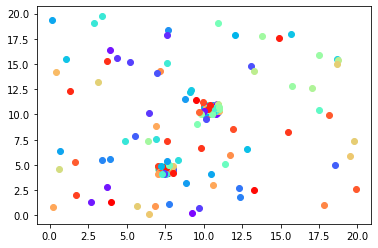

number of clusters 193


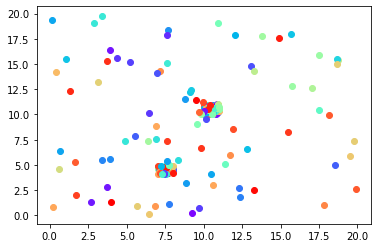

number of clusters 192


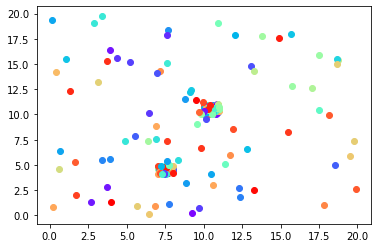

number of clusters 191


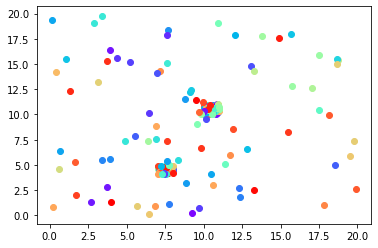

number of clusters 190


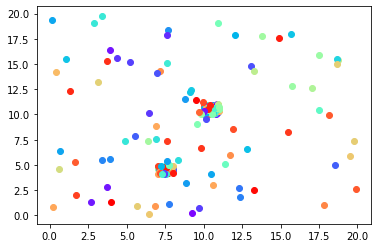

number of clusters 189


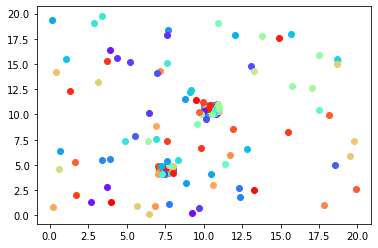

number of clusters 188


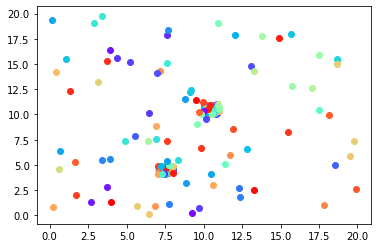

number of clusters 187


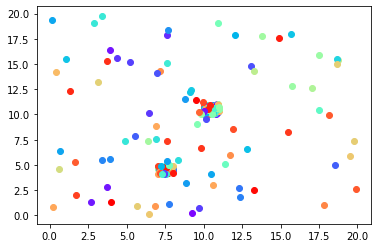

number of clusters 186


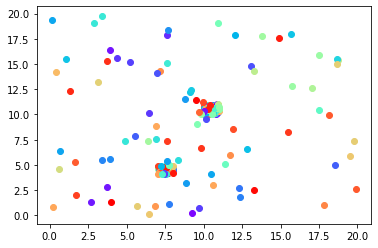

number of clusters 185


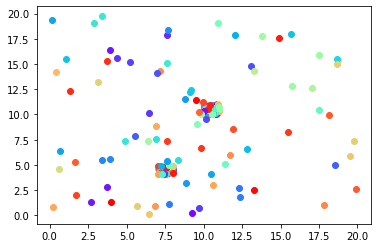

number of clusters 184


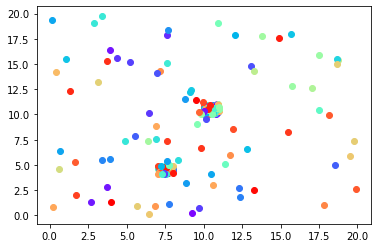

number of clusters 183


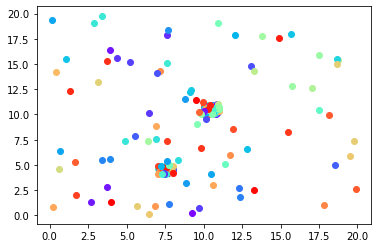

number of clusters 182


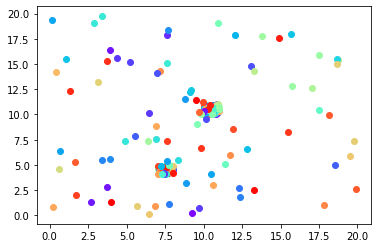

number of clusters 181


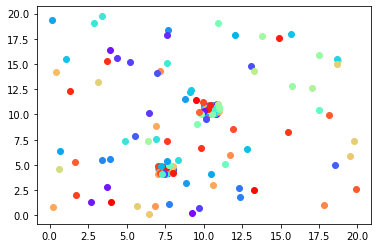

number of clusters 180


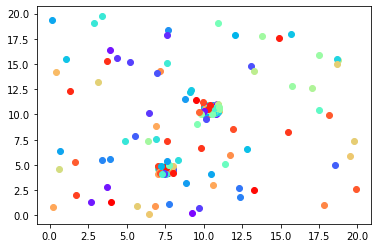

number of clusters 179


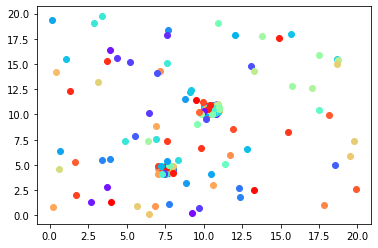

number of clusters 178


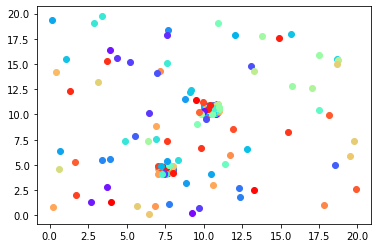

number of clusters 177


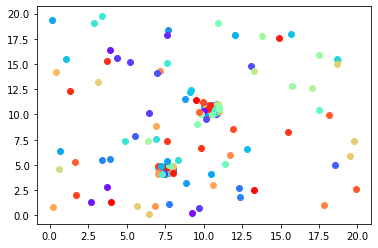

number of clusters 176


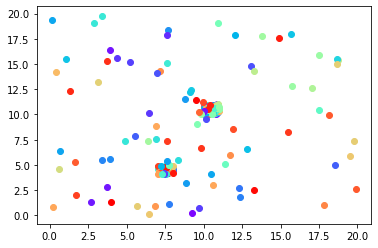

number of clusters 175


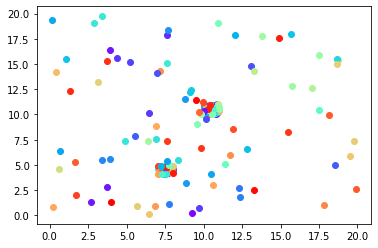

number of clusters 174


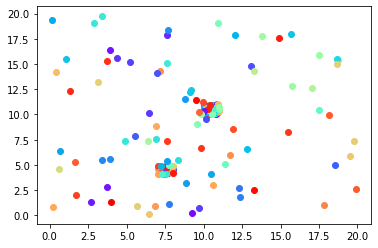

number of clusters 173


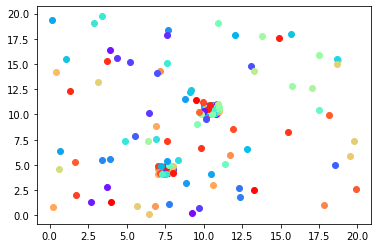

number of clusters 172


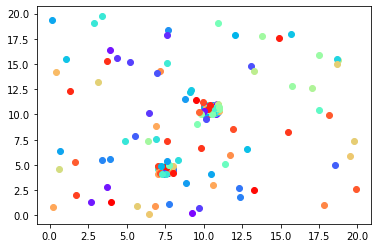

number of clusters 171


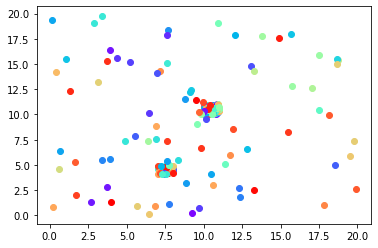

number of clusters 170


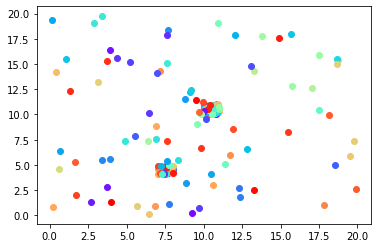

number of clusters 169


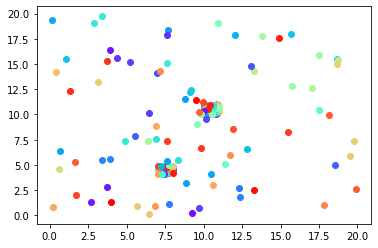

number of clusters 168


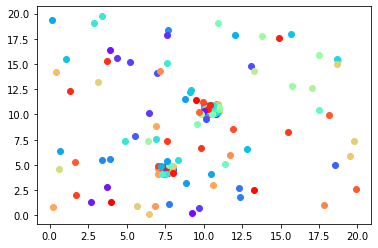

number of clusters 167


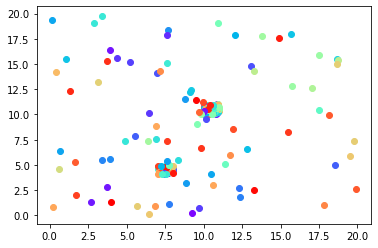

number of clusters 166


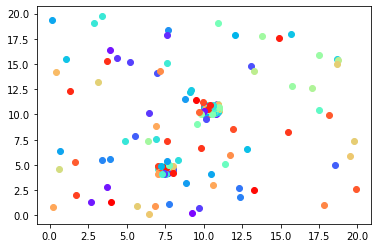

number of clusters 165


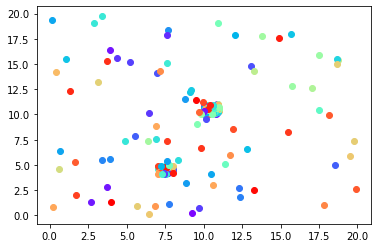

number of clusters 164


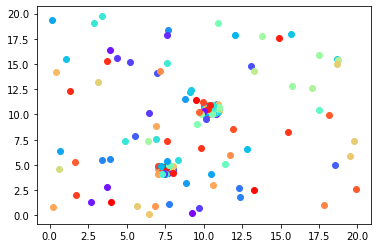

number of clusters 163


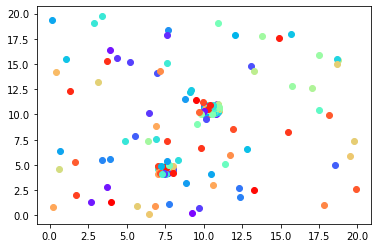

number of clusters 162


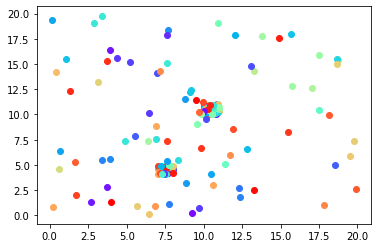

number of clusters 161


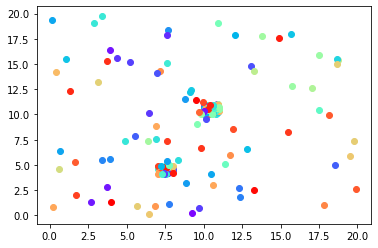

number of clusters 160


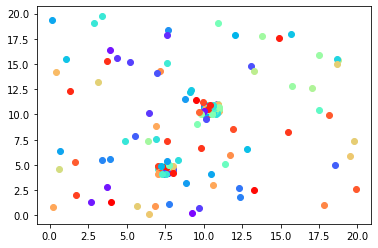

number of clusters 159


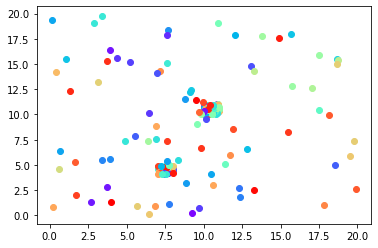

number of clusters 158


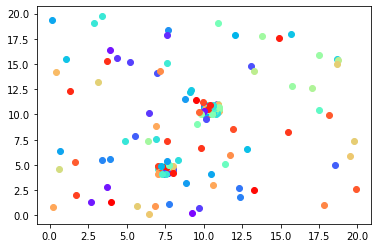

number of clusters 157


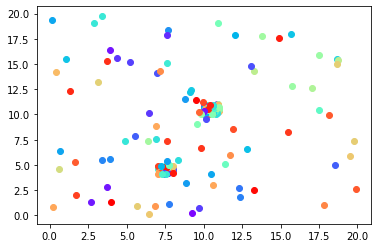

number of clusters 156


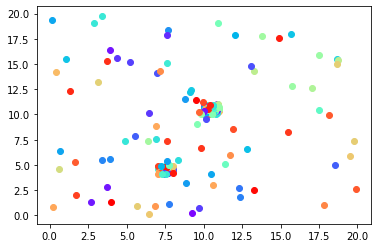

number of clusters 155


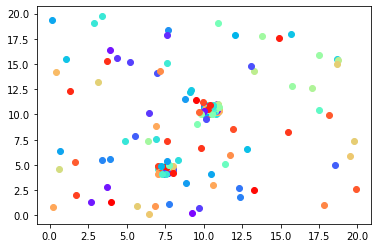

number of clusters 154


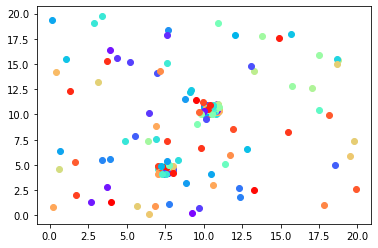

number of clusters 153


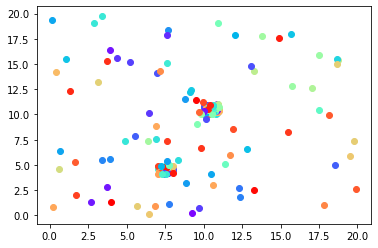

number of clusters 152


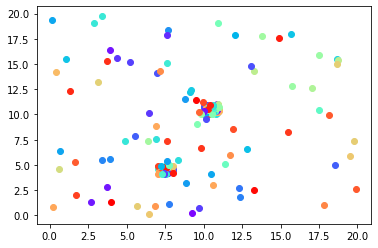

number of clusters 151


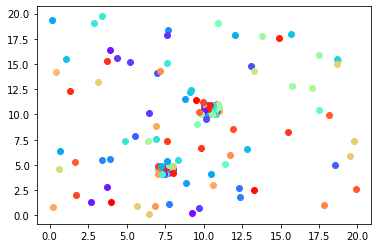

number of clusters 150


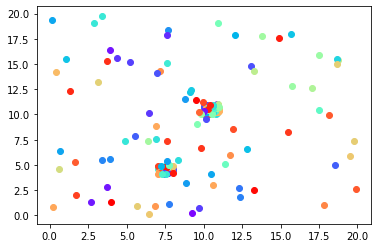

number of clusters 149


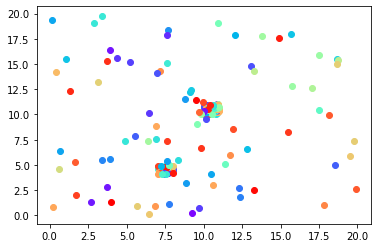

number of clusters 148


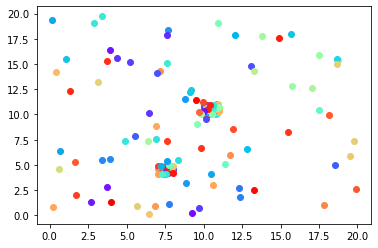

number of clusters 147


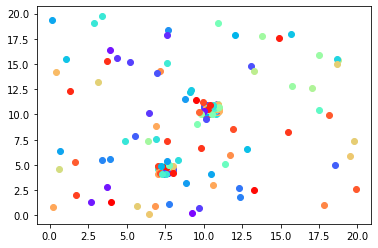

number of clusters 146


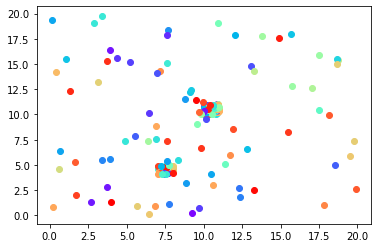

number of clusters 145


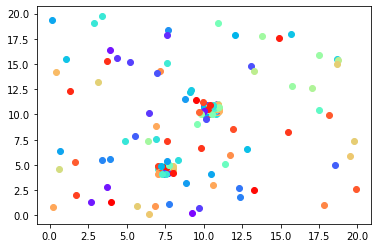

number of clusters 144


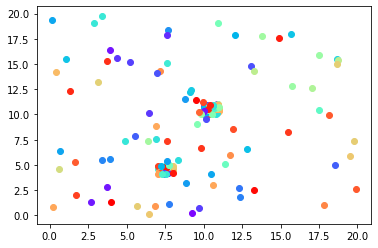

number of clusters 143


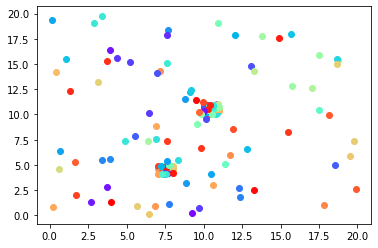

number of clusters 142


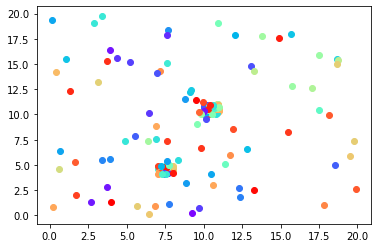

number of clusters 141


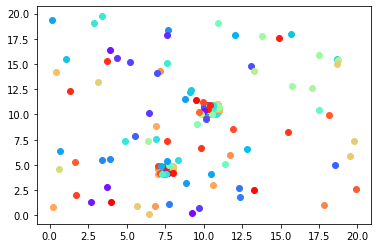

number of clusters 140


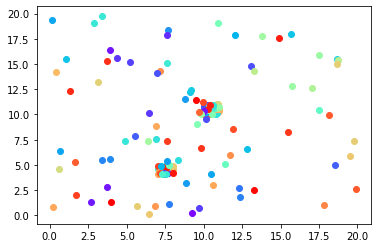

number of clusters 139


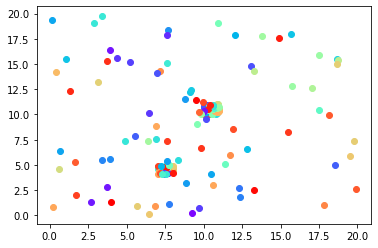

number of clusters 138


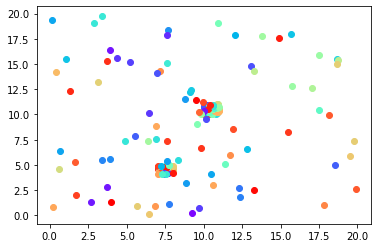

number of clusters 137


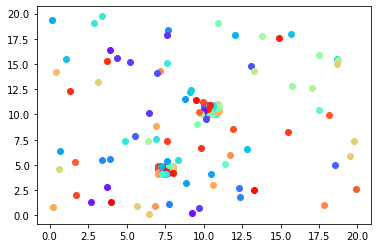

number of clusters 136


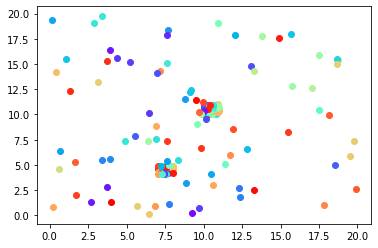

number of clusters 135


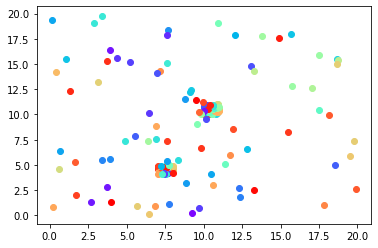

number of clusters 134


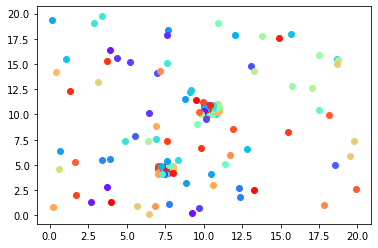

number of clusters 133


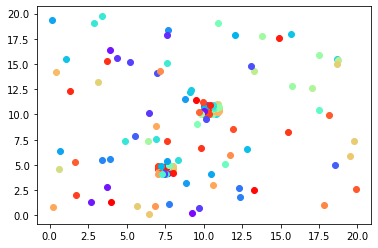

number of clusters 132


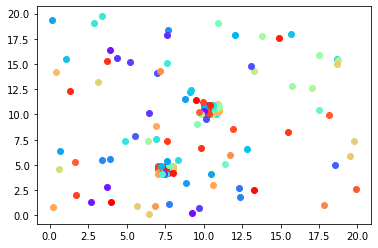

number of clusters 131


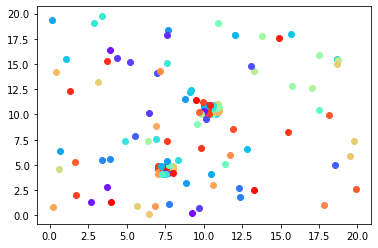

number of clusters 130


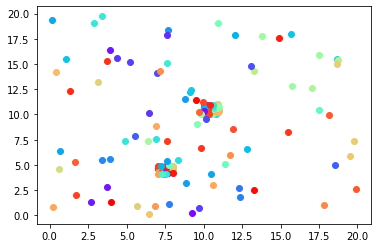

number of clusters 129


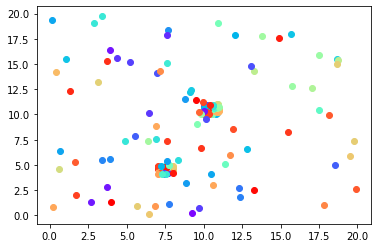

number of clusters 128


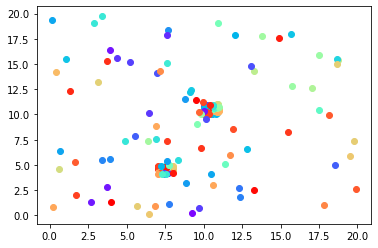

number of clusters 127


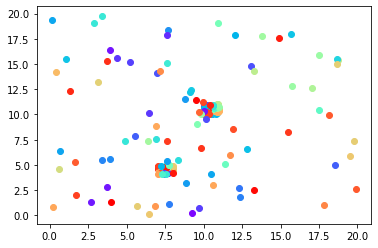

number of clusters 126


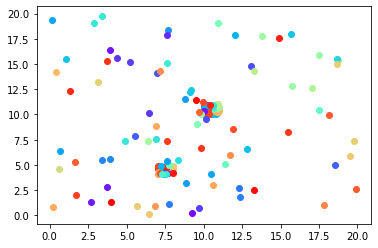

number of clusters 125


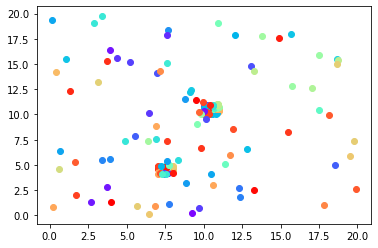

number of clusters 124


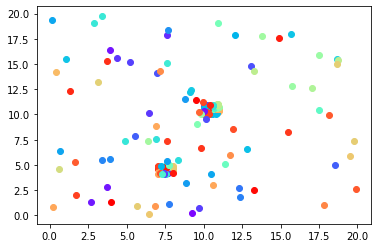

number of clusters 123


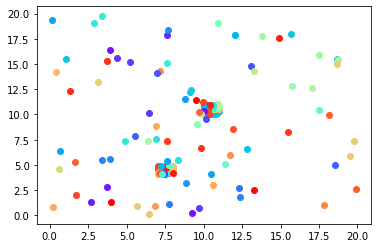

number of clusters 122


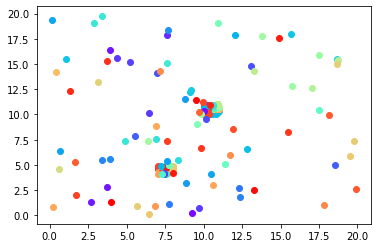

number of clusters 121


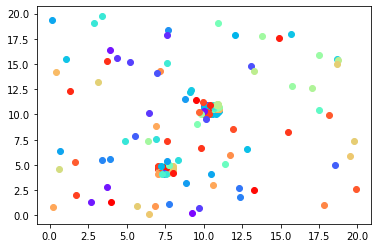

number of clusters 120


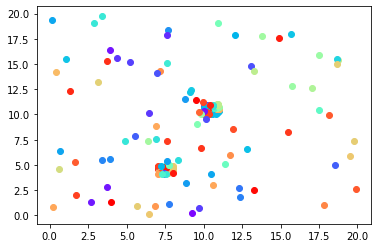

number of clusters 119


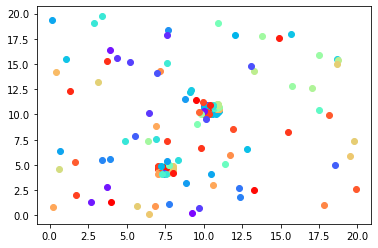

number of clusters 118


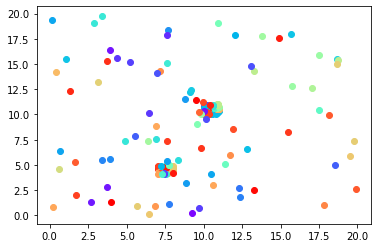

number of clusters 117


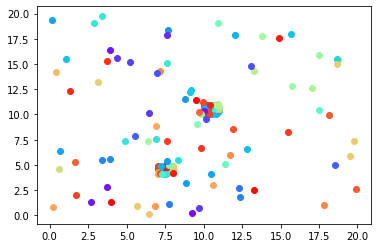

number of clusters 116


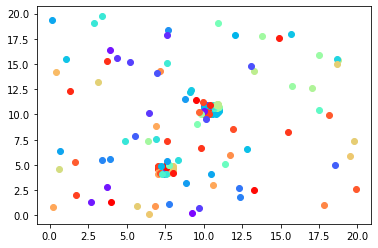

number of clusters 115


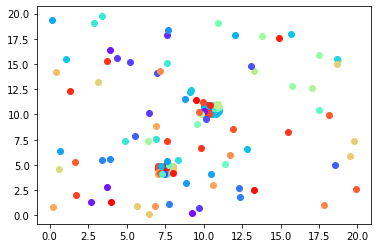

number of clusters 114


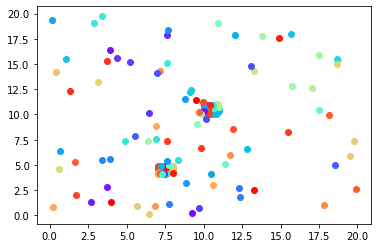

number of clusters 113


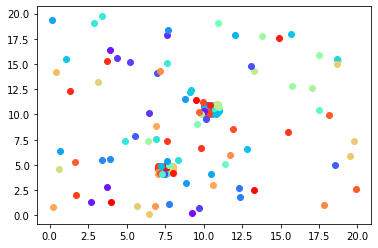

number of clusters 112


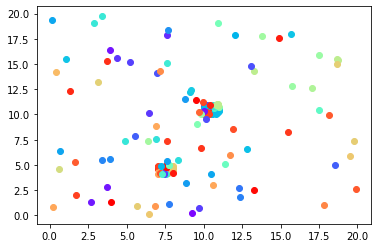

number of clusters 111


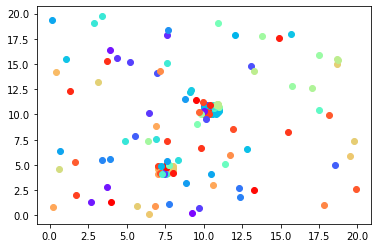

number of clusters 110


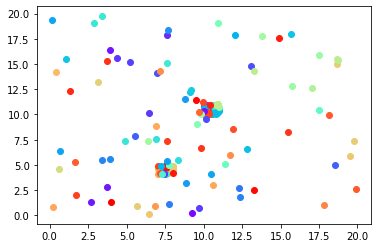

number of clusters 109


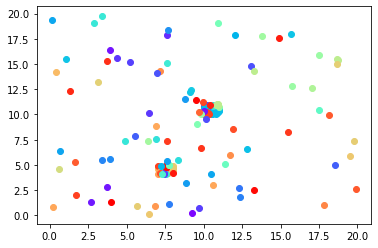

number of clusters 108


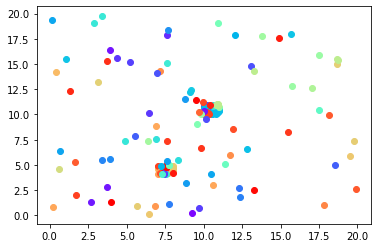

number of clusters 107


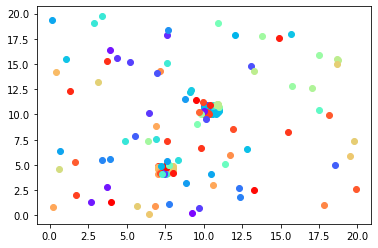

number of clusters 106


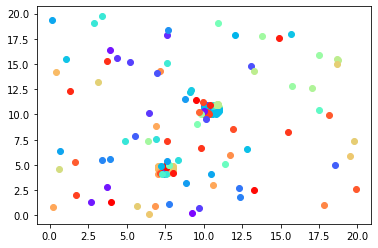

number of clusters 105


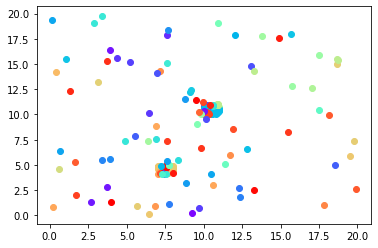

number of clusters 104


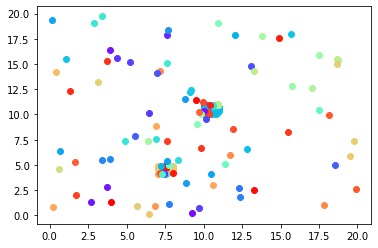

number of clusters 103


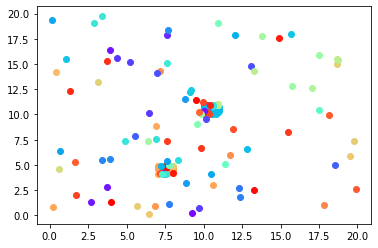

number of clusters 102


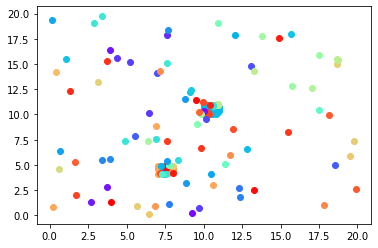

number of clusters 101


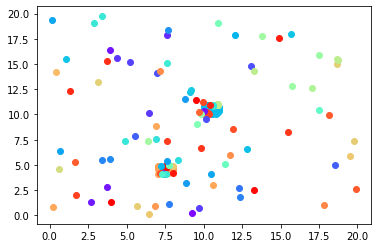

number of clusters 100


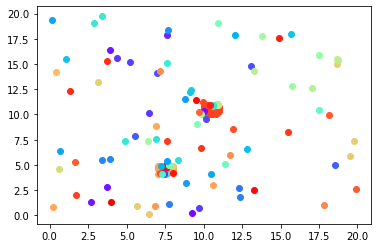

number of clusters 99


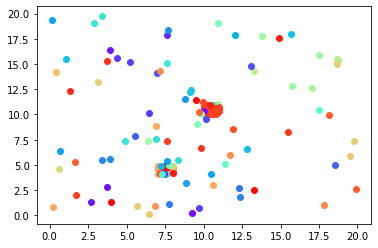

number of clusters 98


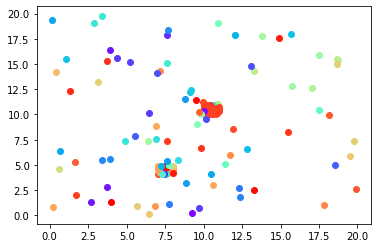

number of clusters 97


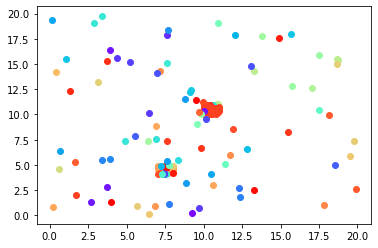

number of clusters 96


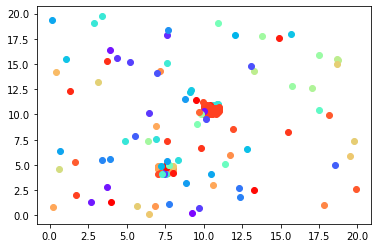

number of clusters 95


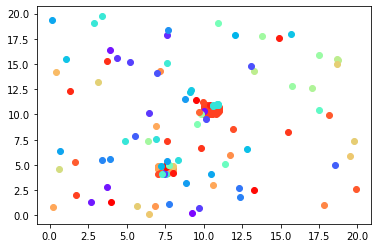

number of clusters 94


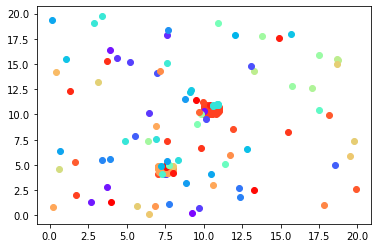

number of clusters 93


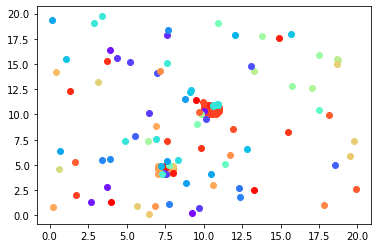

number of clusters 92


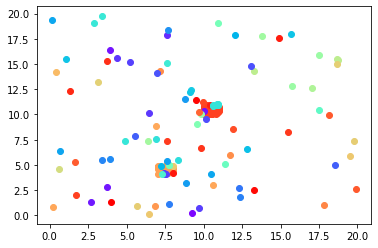

number of clusters 91


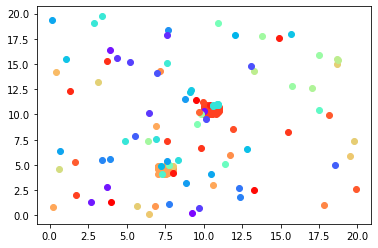

number of clusters 90


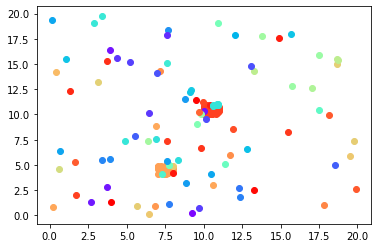

number of clusters 89


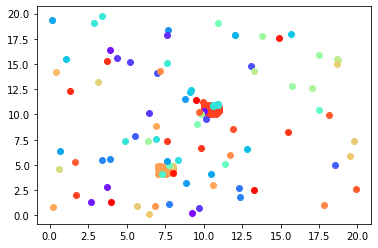

number of clusters 88


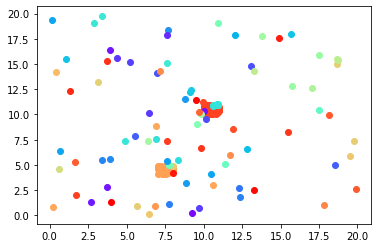

number of clusters 87


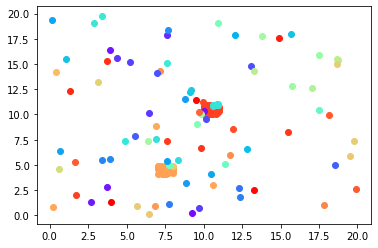

number of clusters 86


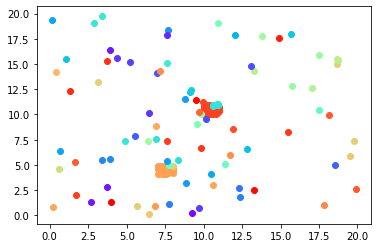

number of clusters 85


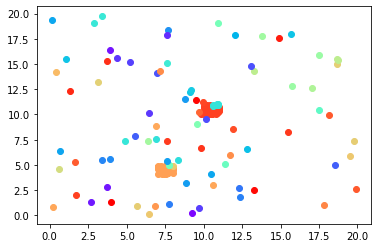

number of clusters 84


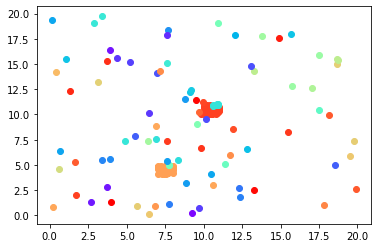

number of clusters 83


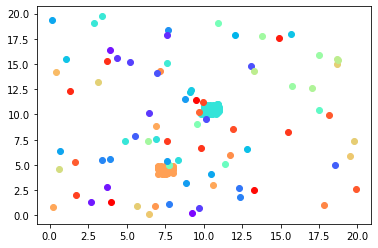

number of clusters 82


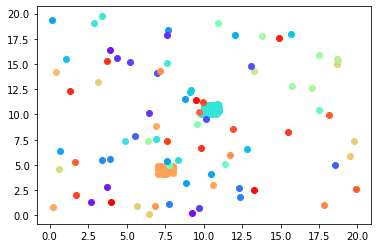

number of clusters 81


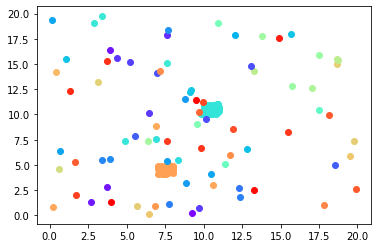

number of clusters 80


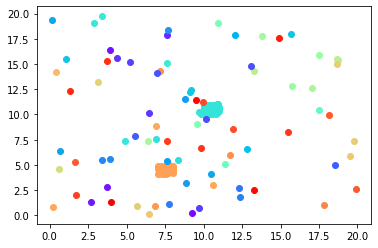

number of clusters 79


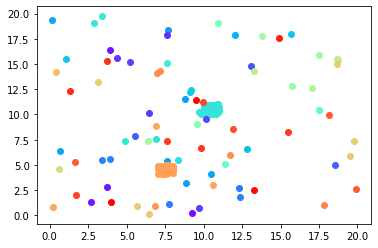

number of clusters 78


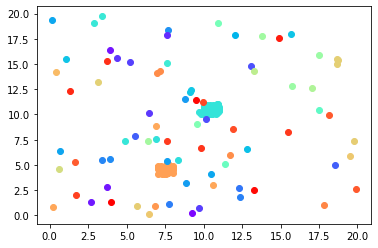

number of clusters 77


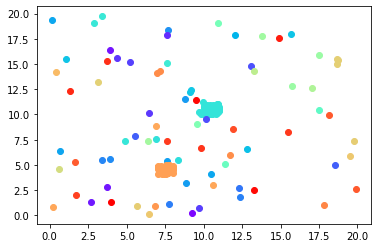

number of clusters 76


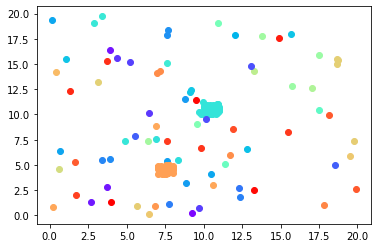

number of clusters 75


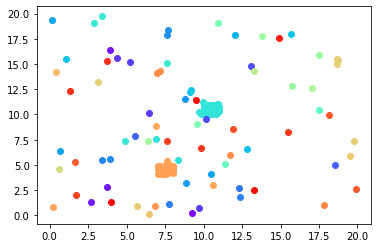

number of clusters 74


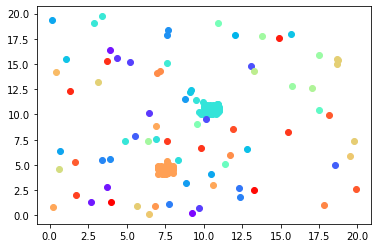

number of clusters 73


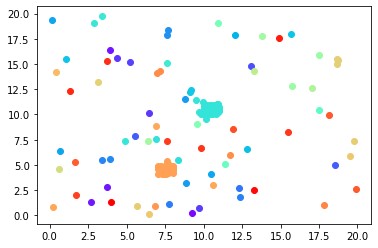

number of clusters 72


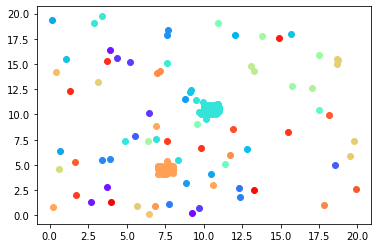

number of clusters 71


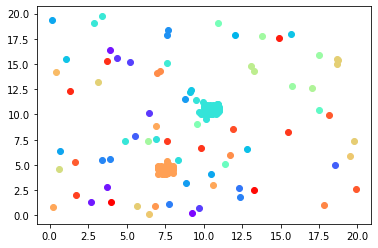

number of clusters 70


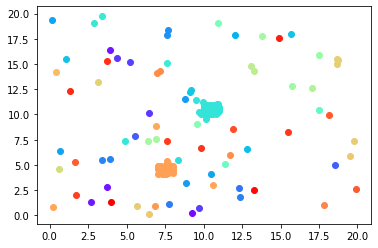

number of clusters 69


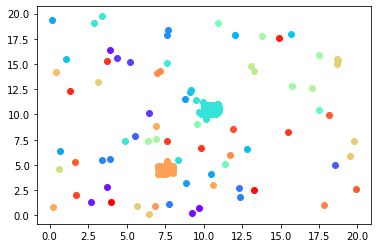

number of clusters 68


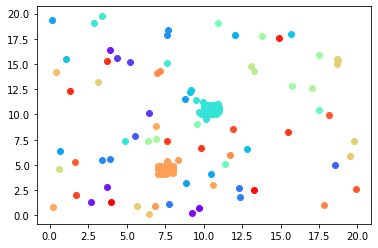

number of clusters 67


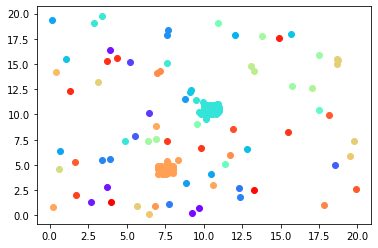

number of clusters 66


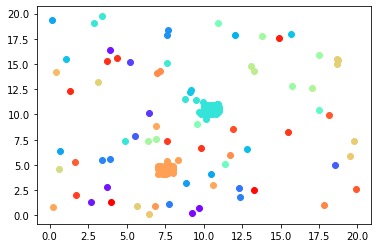

number of clusters 65


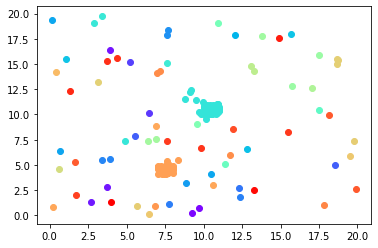

number of clusters 64


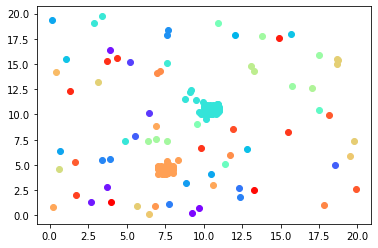

number of clusters 63


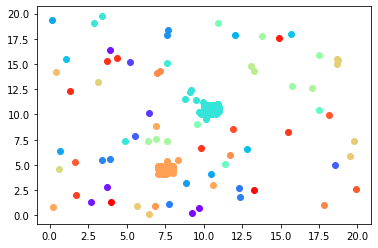

number of clusters 62


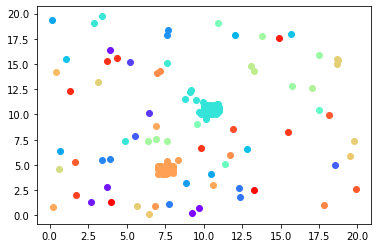

number of clusters 61


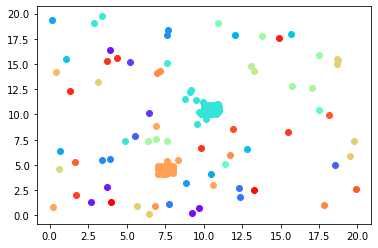

number of clusters 60


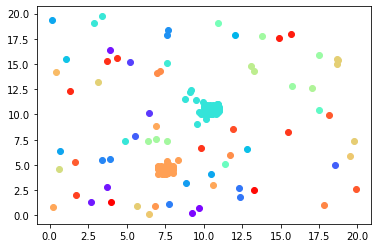

number of clusters 59


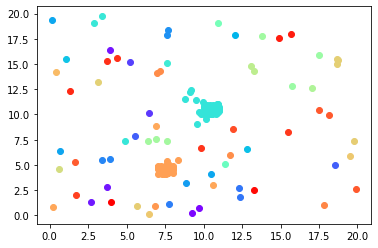

number of clusters 58


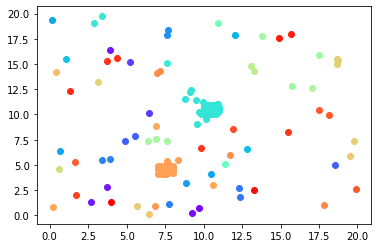

number of clusters 57


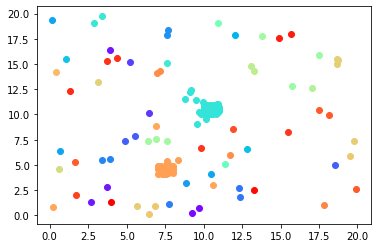

number of clusters 56


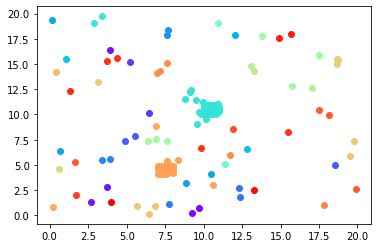

number of clusters 55


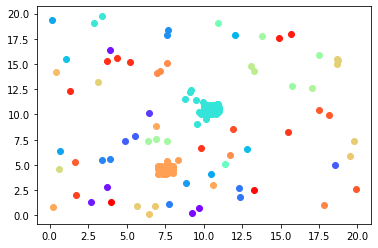

number of clusters 54


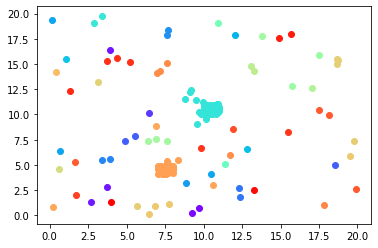

number of clusters 53


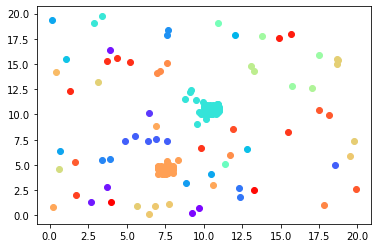

number of clusters 52


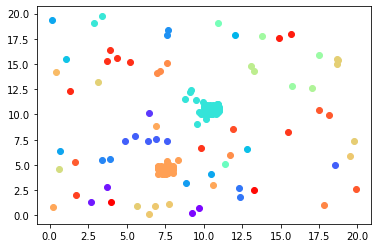

number of clusters 51


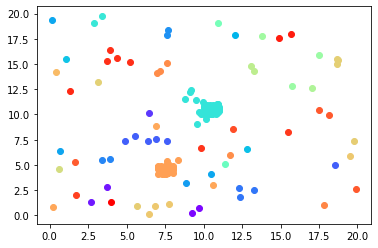

number of clusters 50


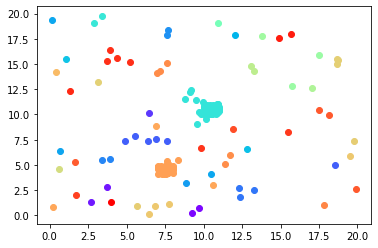

number of clusters 49


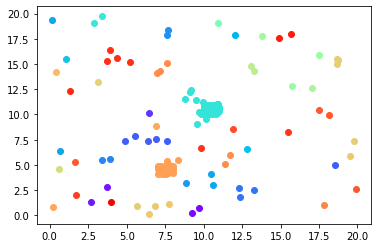

number of clusters 48


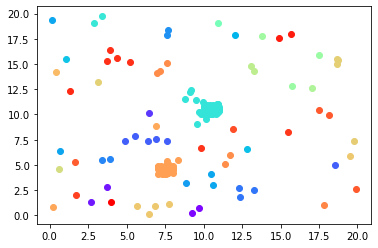

number of clusters 47


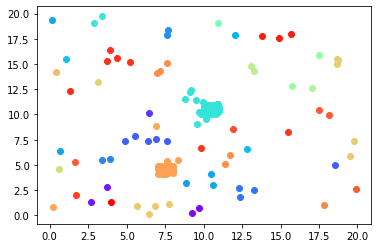

number of clusters 46


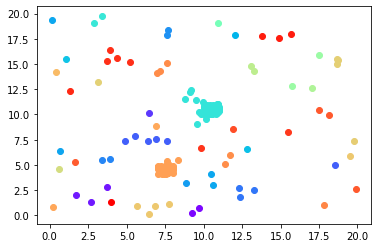

number of clusters 45


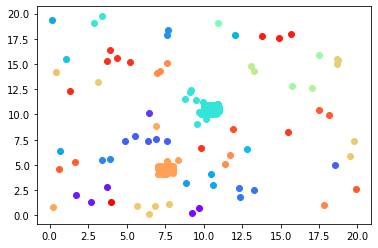

number of clusters 44


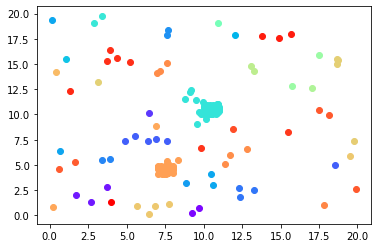

number of clusters 43


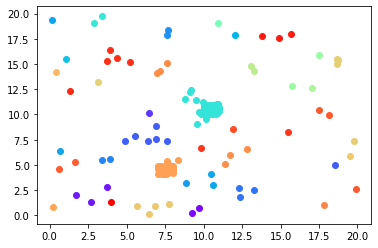

number of clusters 42


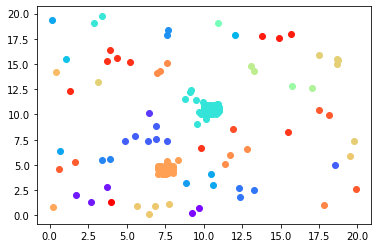

number of clusters 41


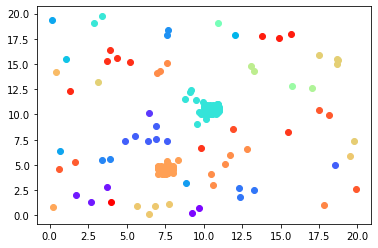

number of clusters 40


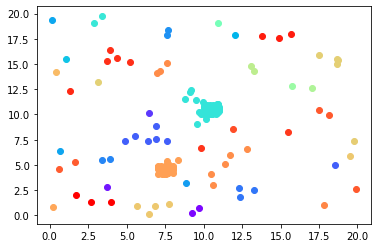

number of clusters 39


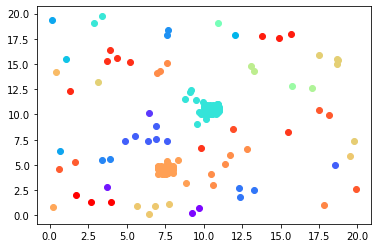

number of clusters 38


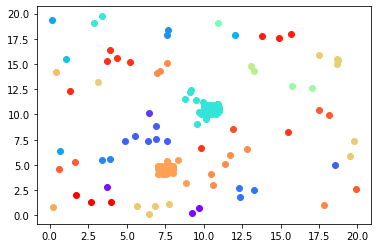

number of clusters 37


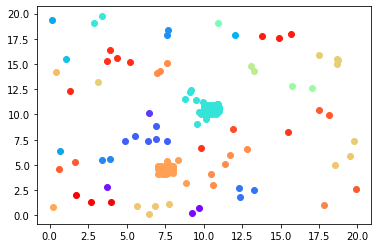

number of clusters 36


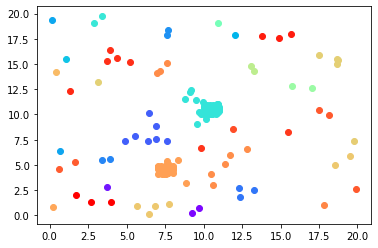

number of clusters 35


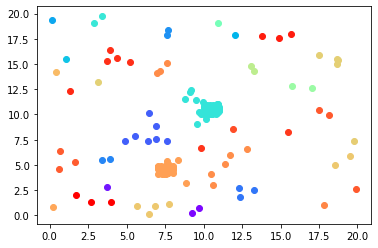

number of clusters 34


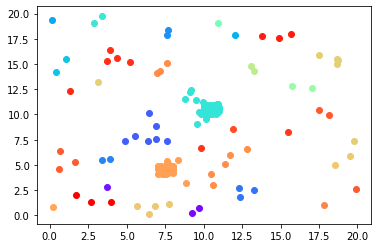

number of clusters 33


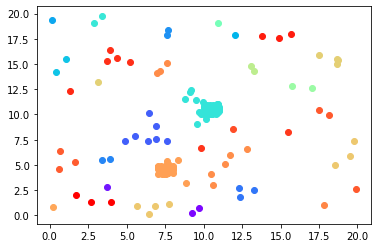

number of clusters 32


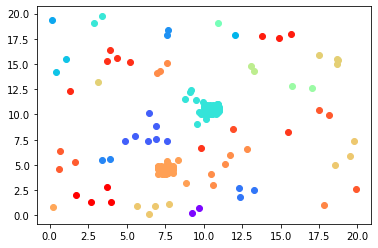

number of clusters 31


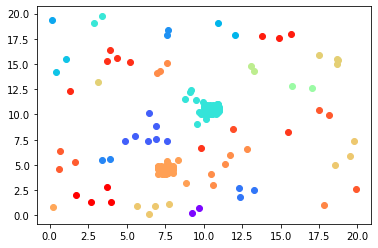

number of clusters 30


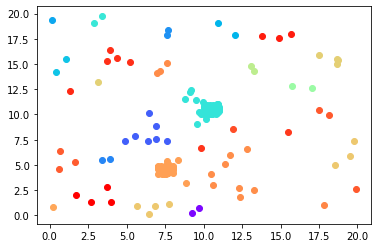

number of clusters 29


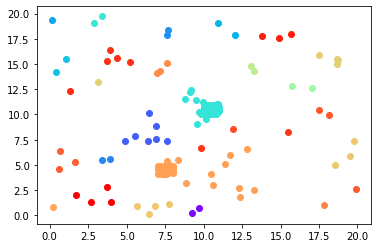

number of clusters 28


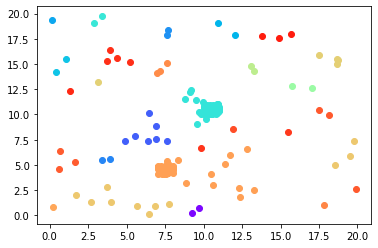

number of clusters 27


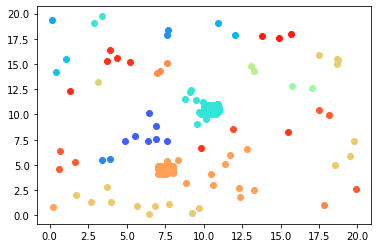

number of clusters 26


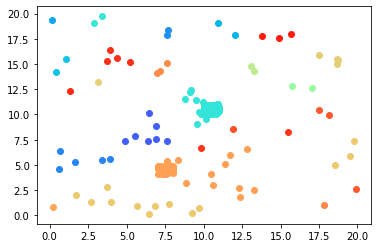

number of clusters 25


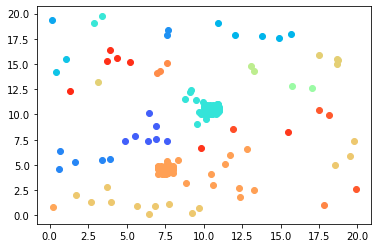

number of clusters 24


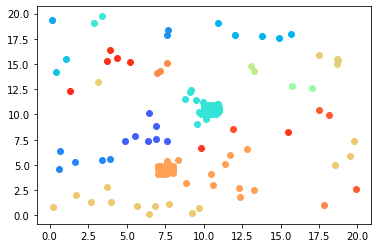

number of clusters 23


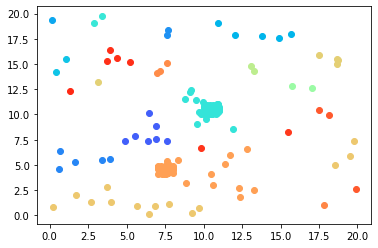

number of clusters 22


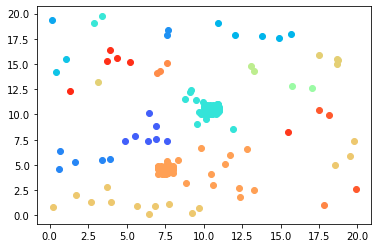

number of clusters 21


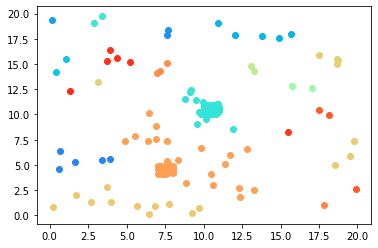

number of clusters 20


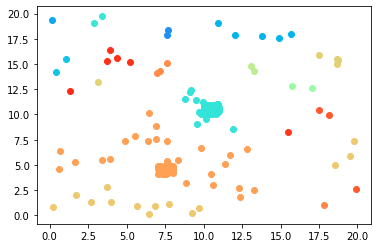

number of clusters 19


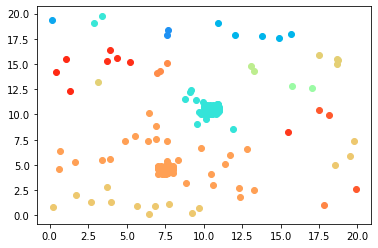

number of clusters 18


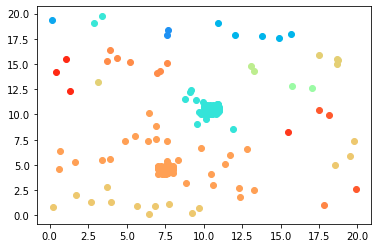

number of clusters 17


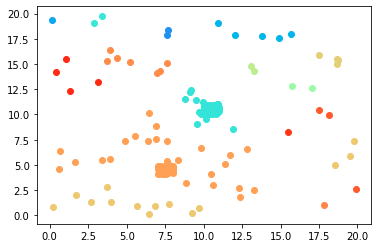

number of clusters 16


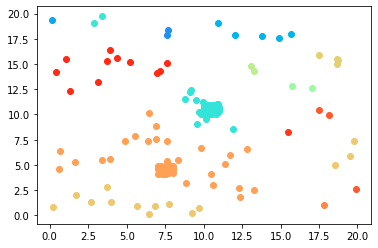

number of clusters 15


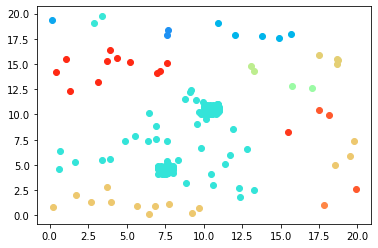

number of clusters 14


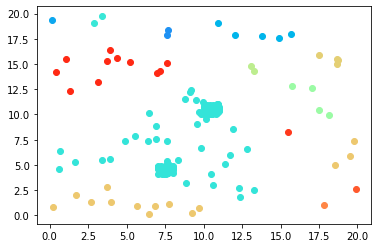

number of clusters 13


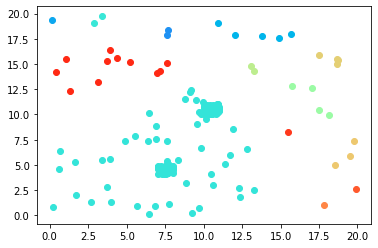

number of clusters 12


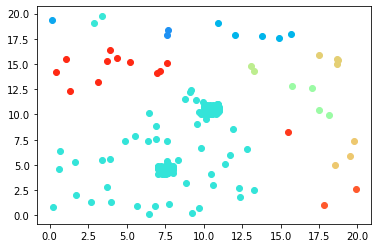

number of clusters 11


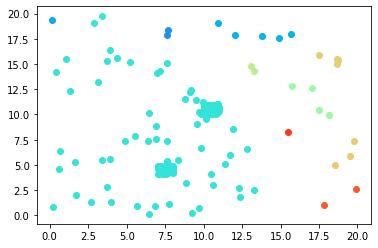

number of clusters 10


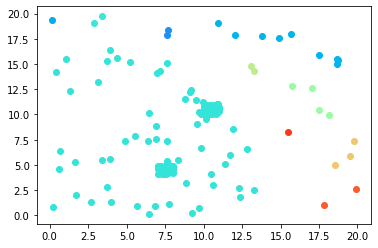

number of clusters 9


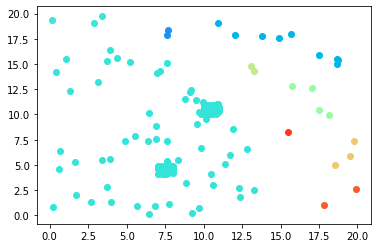

number of clusters 8


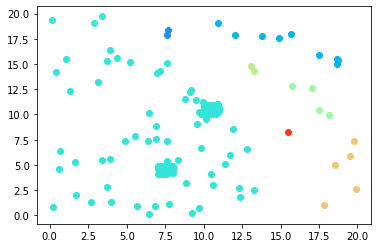

number of clusters 7


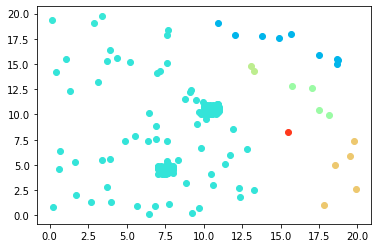

number of clusters 6


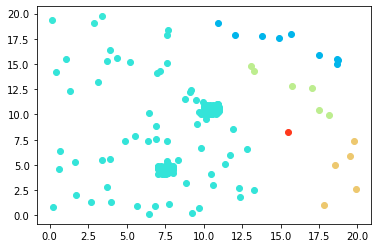

number of clusters 5


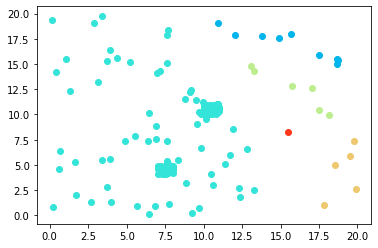

number of clusters 4


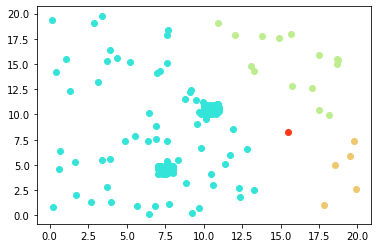

number of clusters 3


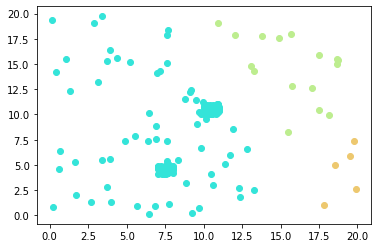

number of clusters 2


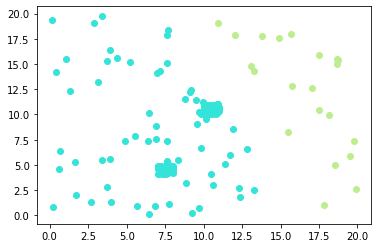

number of clusters 1


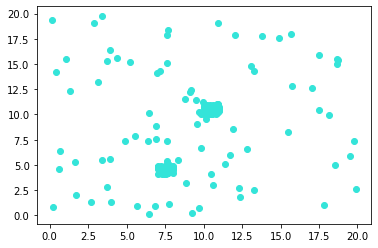

In [ ]:
df = dfex2_reduced
agglomerate(df)

number of clusters 249


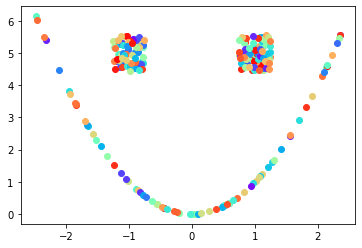

number of clusters 248


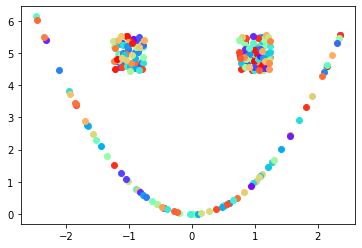

number of clusters 247


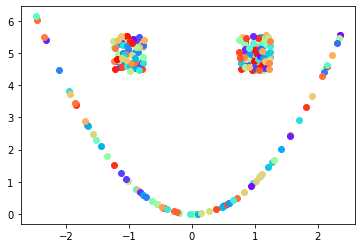

number of clusters 246


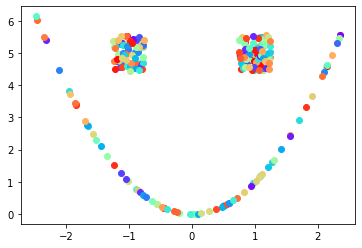

number of clusters 245


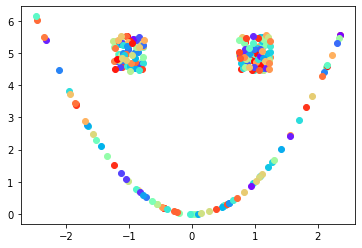

number of clusters 244


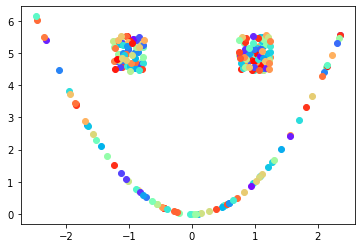

number of clusters 243


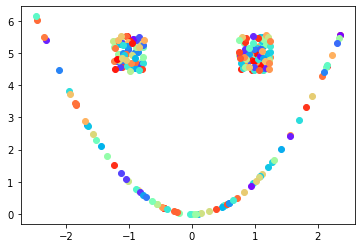

number of clusters 242


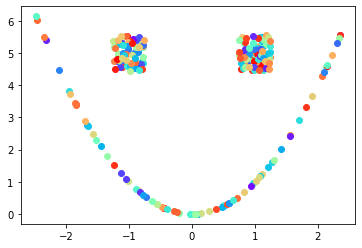

number of clusters 241


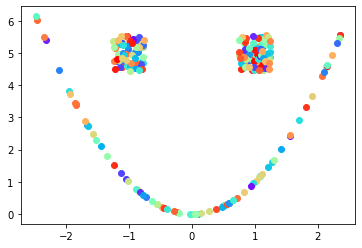

number of clusters 240


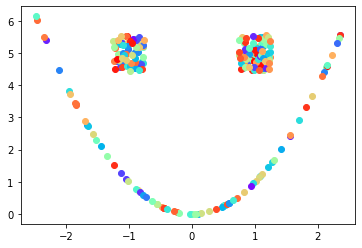

number of clusters 239


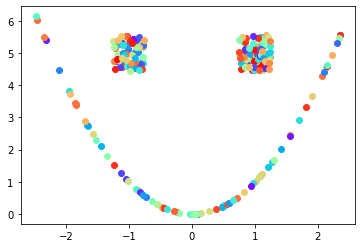

number of clusters 238


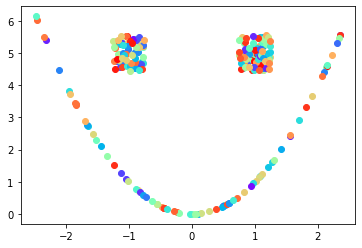

number of clusters 237


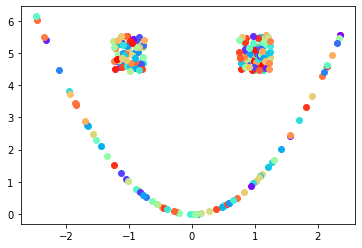

number of clusters 236


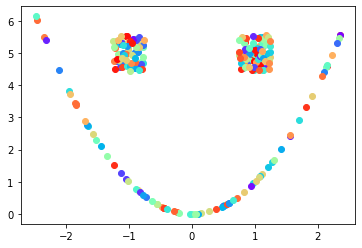

number of clusters 235


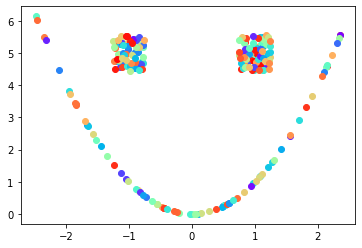

number of clusters 234


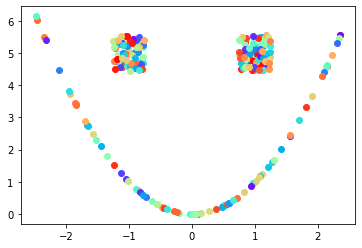

number of clusters 233


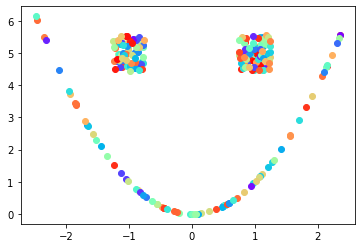

number of clusters 232


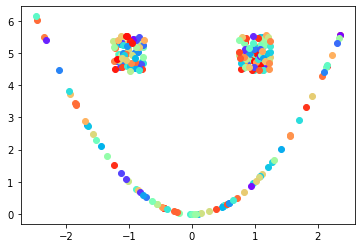

number of clusters 231


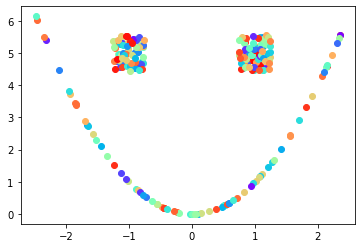

number of clusters 230


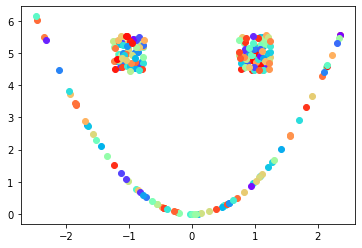

number of clusters 229


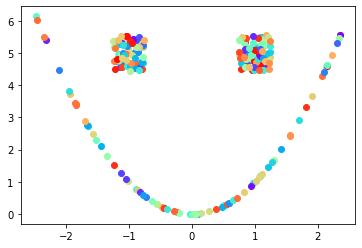

number of clusters 228


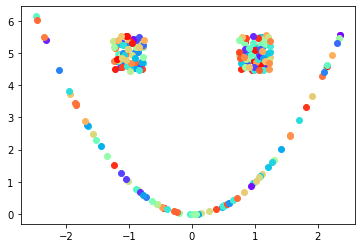

number of clusters 227


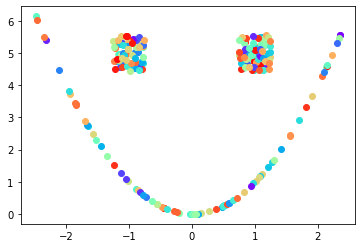

number of clusters 226


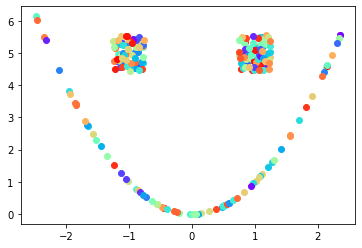

number of clusters 225


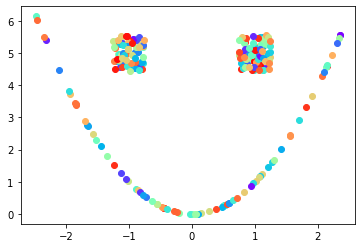

number of clusters 224


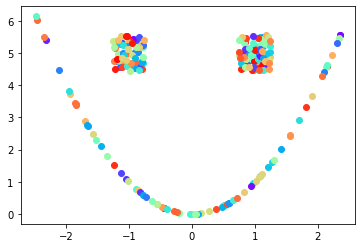

number of clusters 223


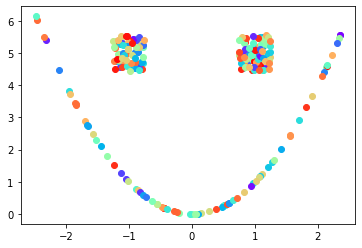

number of clusters 222


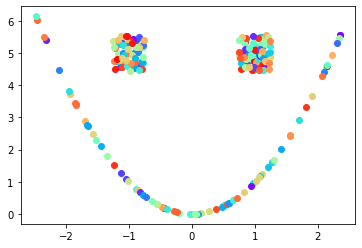

number of clusters 221


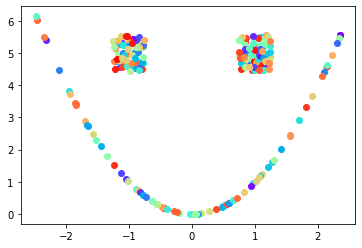

number of clusters 220


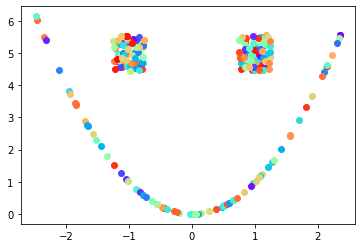

number of clusters 219


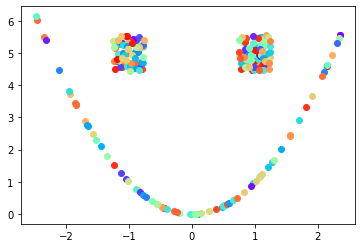

number of clusters 218


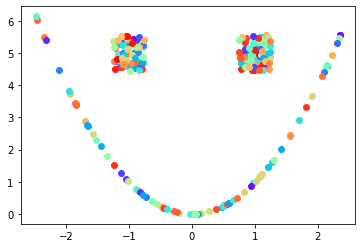

number of clusters 217


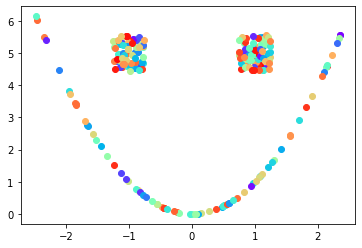

number of clusters 216


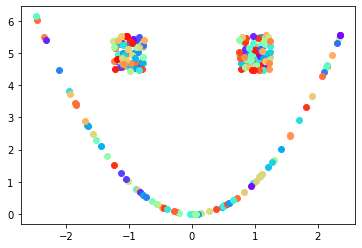

number of clusters 215


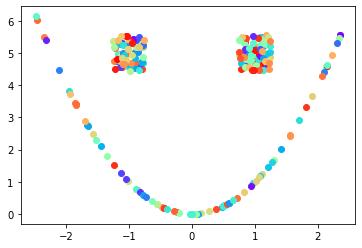

number of clusters 214


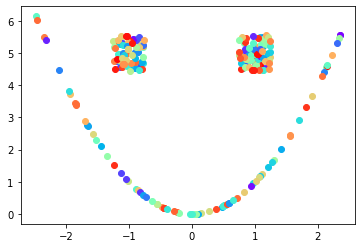

number of clusters 213


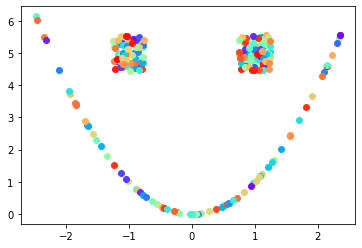

number of clusters 212


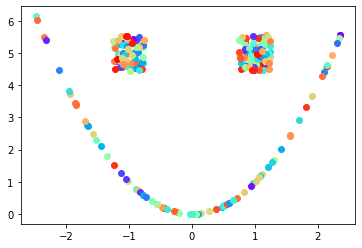

number of clusters 211


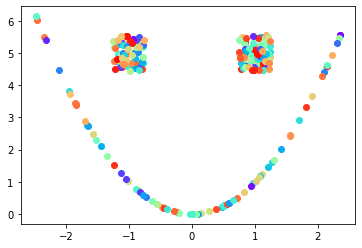

number of clusters 210


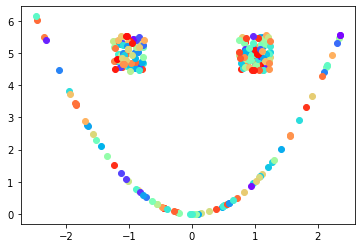

number of clusters 209


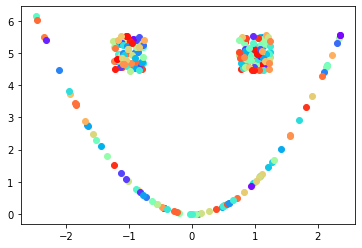

number of clusters 208


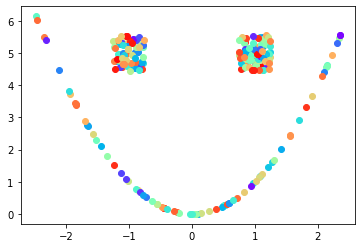

number of clusters 207


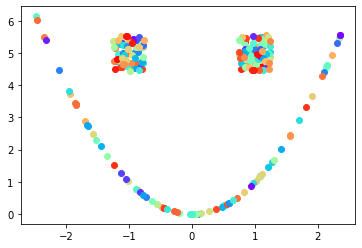

number of clusters 206


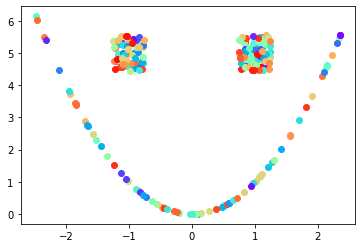

number of clusters 205


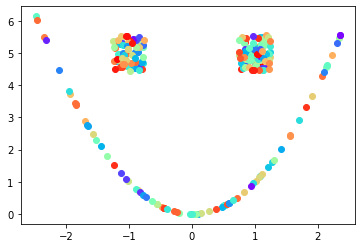

number of clusters 204


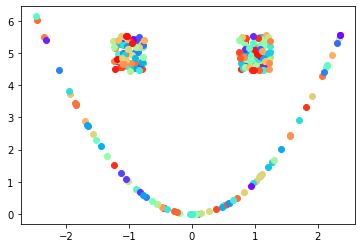

number of clusters 203


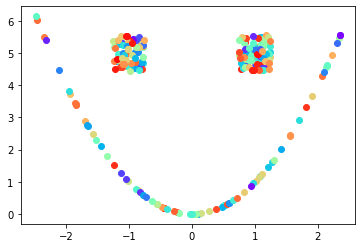

number of clusters 202


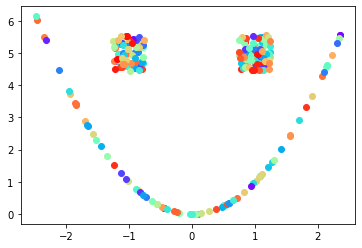

number of clusters 201


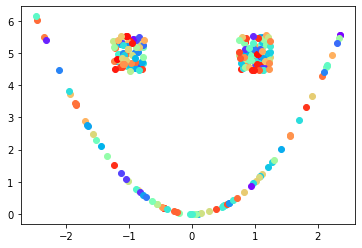

number of clusters 200


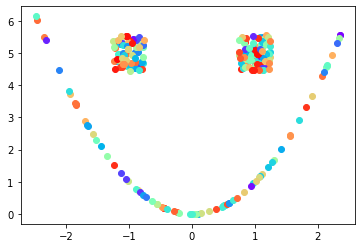

number of clusters 199


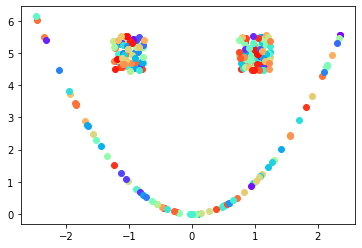

number of clusters 198


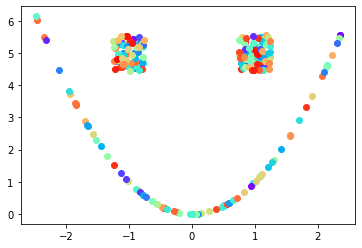

number of clusters 197


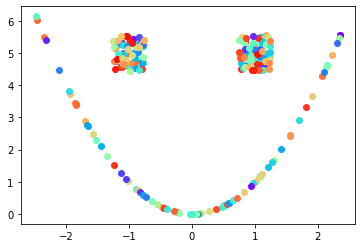

number of clusters 196


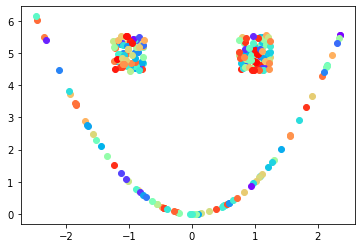

number of clusters 195


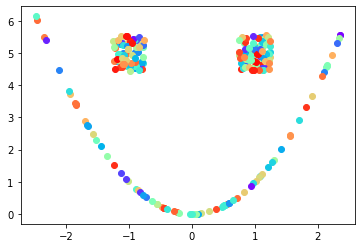

number of clusters 194


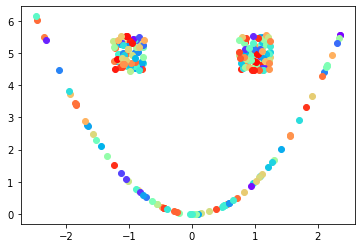

number of clusters 193


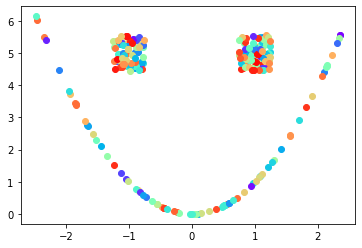

number of clusters 192


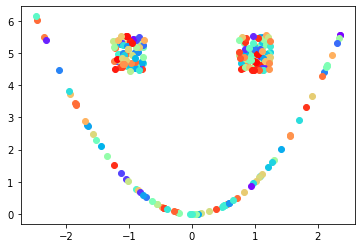

number of clusters 191


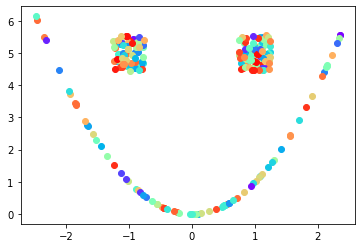

number of clusters 190


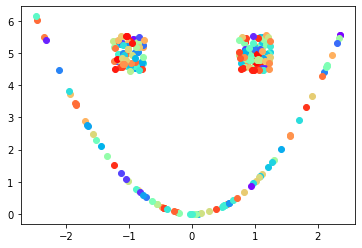

number of clusters 189


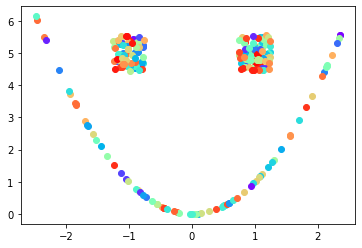

number of clusters 188


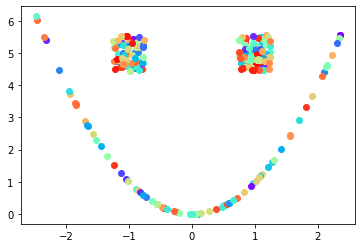

number of clusters 187


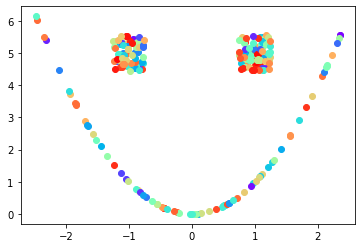

number of clusters 186


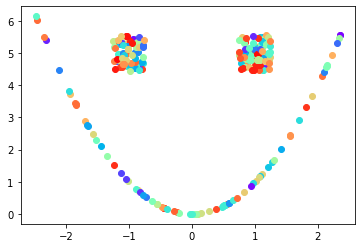

number of clusters 185


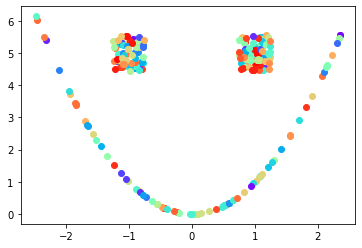

number of clusters 184


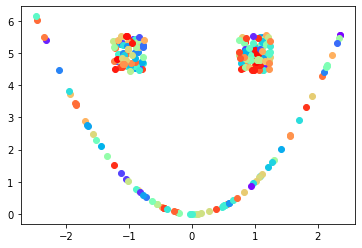

number of clusters 183


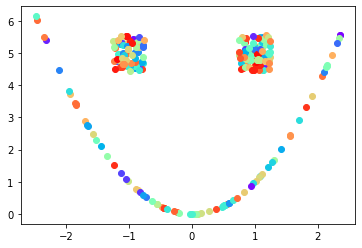

number of clusters 182


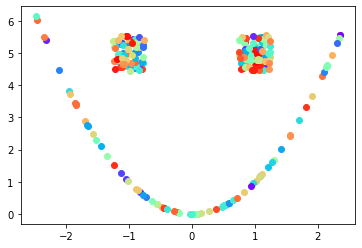

number of clusters 181


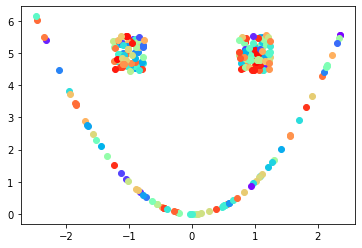

number of clusters 180


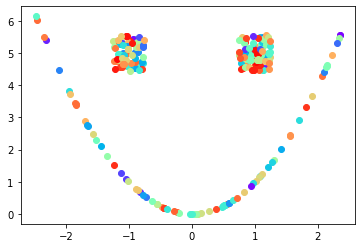

number of clusters 179


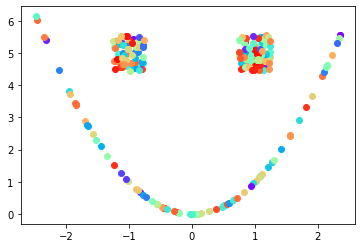

number of clusters 178


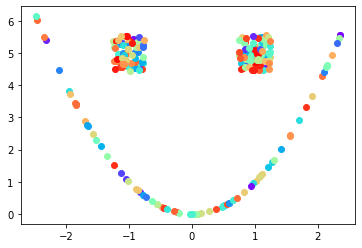

number of clusters 177


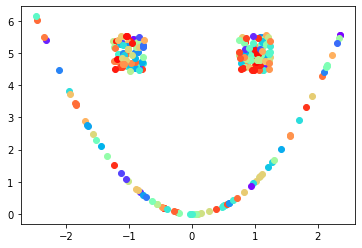

number of clusters 176


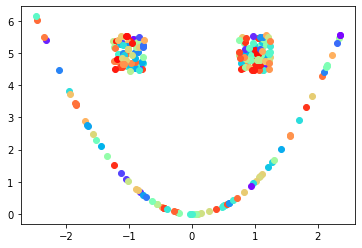

number of clusters 175


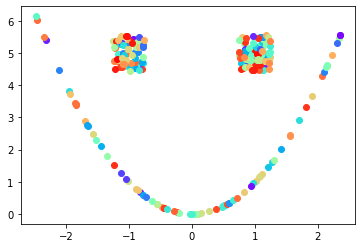

number of clusters 174


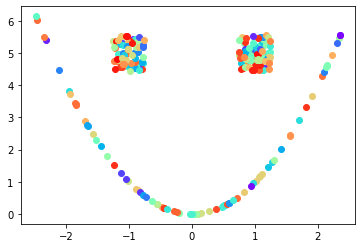

number of clusters 173


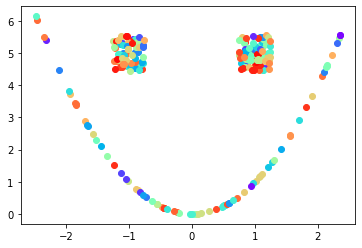

number of clusters 172


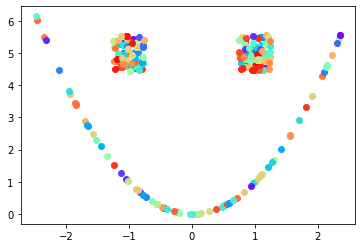

number of clusters 171


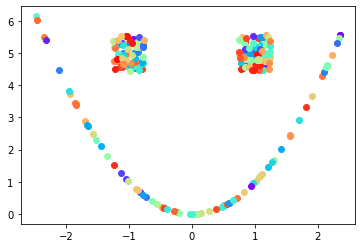

number of clusters 170


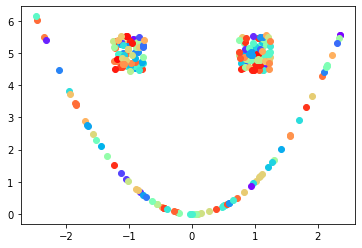

number of clusters 169


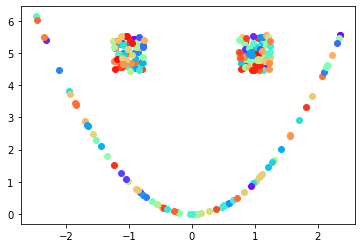

number of clusters 168


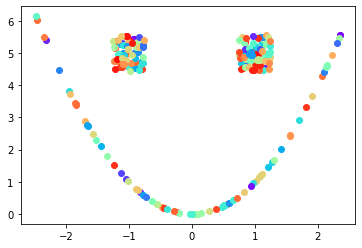

number of clusters 167


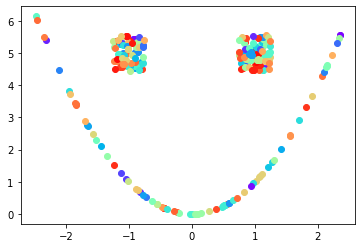

number of clusters 166


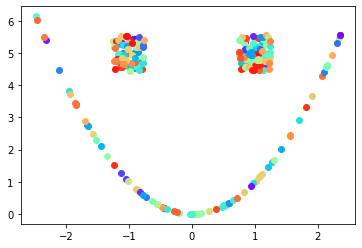

number of clusters 165


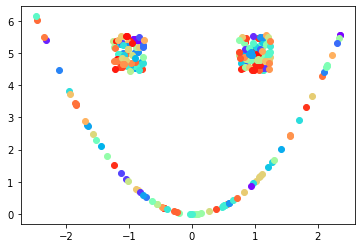

number of clusters 164


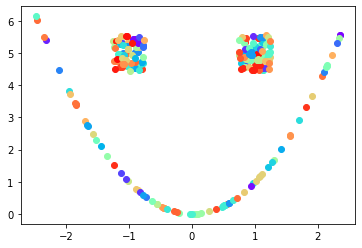

number of clusters 163


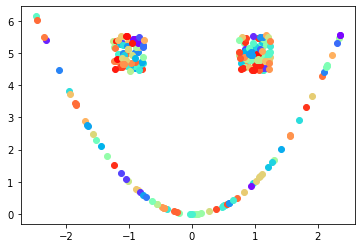

number of clusters 162


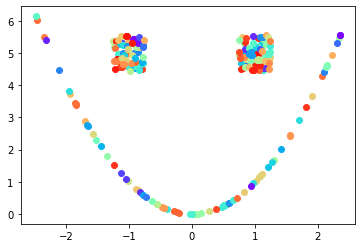

number of clusters 161


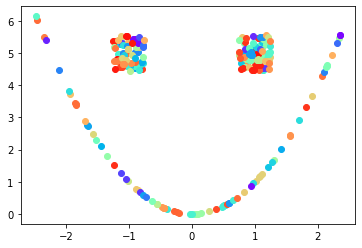

number of clusters 160


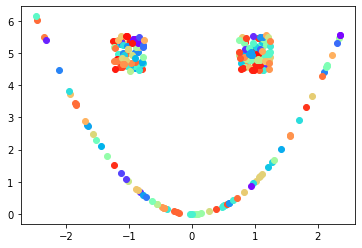

number of clusters 159


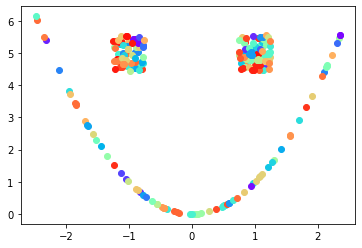

number of clusters 158


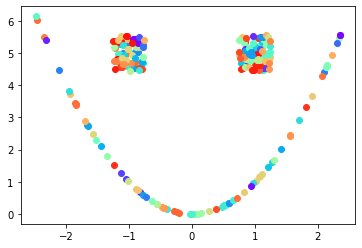

number of clusters 157


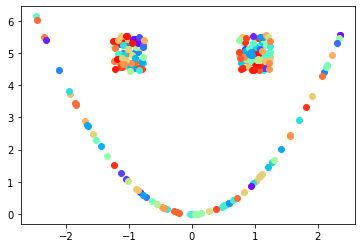

number of clusters 156


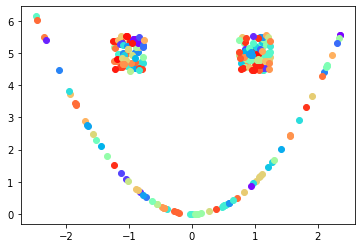

number of clusters 155


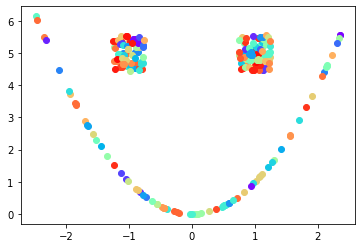

number of clusters 154


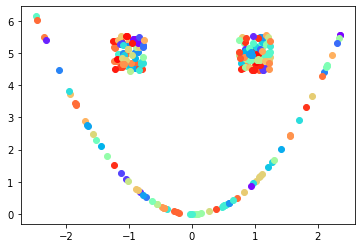

number of clusters 153


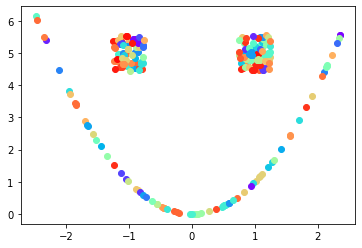

number of clusters 152


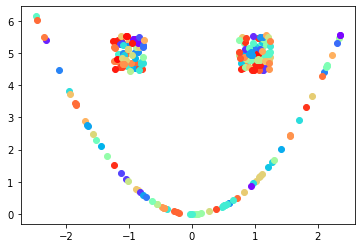

number of clusters 151


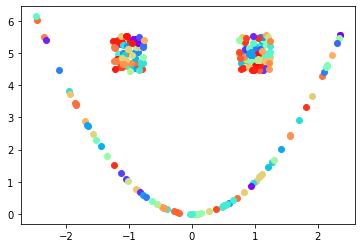

number of clusters 150


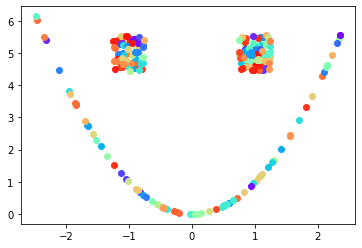

number of clusters 149


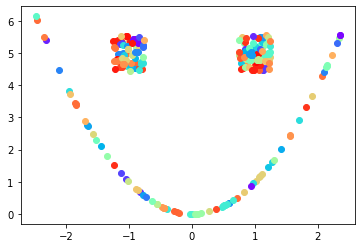

number of clusters 148


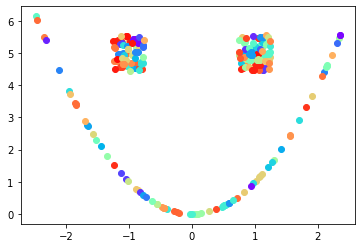

number of clusters 147


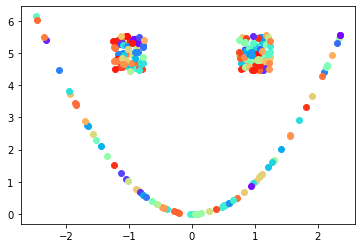

number of clusters 146


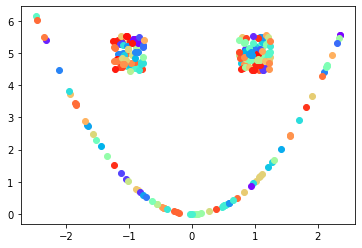

number of clusters 145


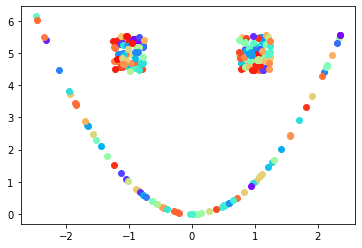

number of clusters 144


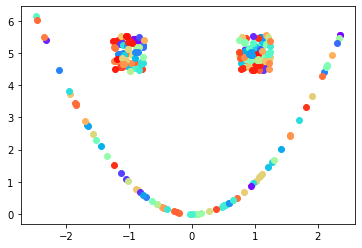

number of clusters 143


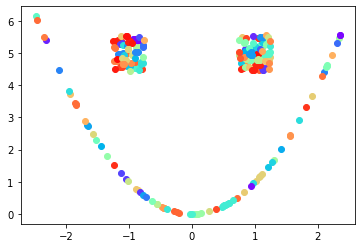

number of clusters 142


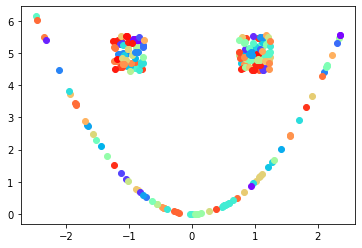

number of clusters 141


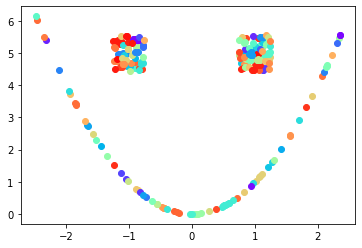

number of clusters 140


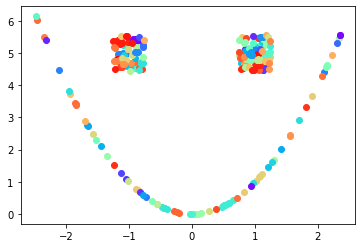

number of clusters 139


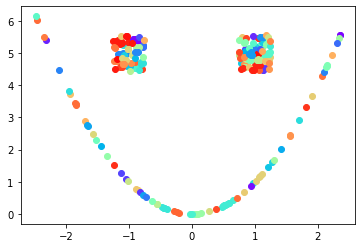

number of clusters 138


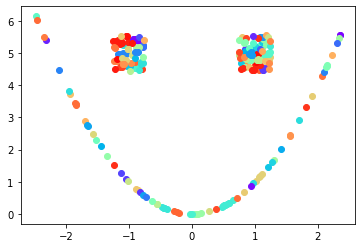

number of clusters 137


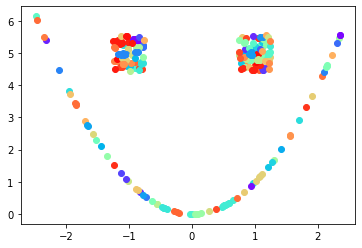

number of clusters 136


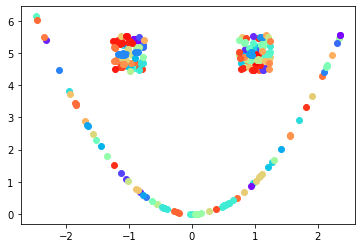

number of clusters 135


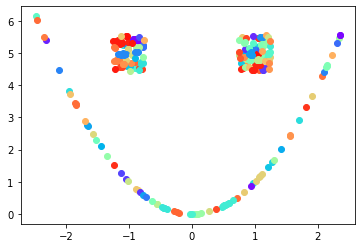

number of clusters 134


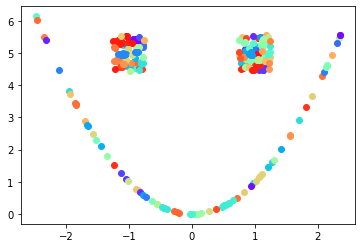

number of clusters 133


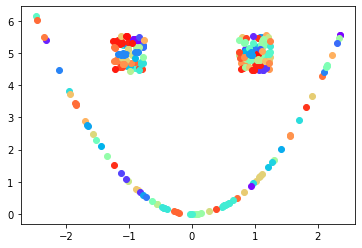

number of clusters 132


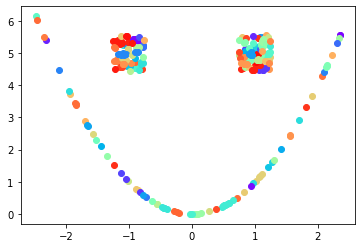

number of clusters 131


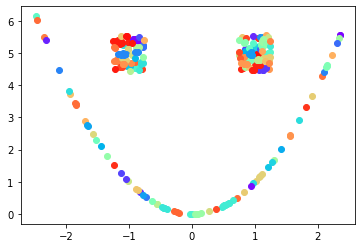

number of clusters 130


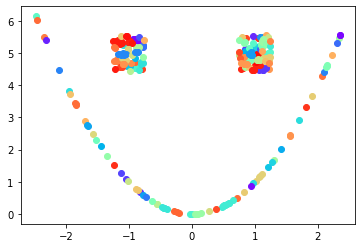

number of clusters 129


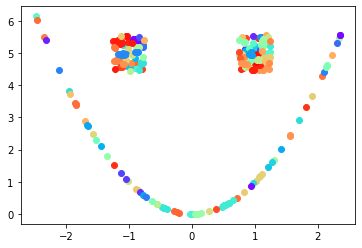

number of clusters 128


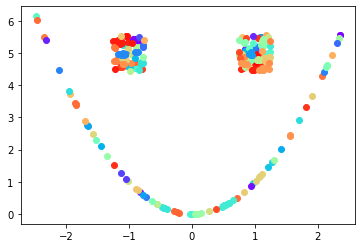

number of clusters 127


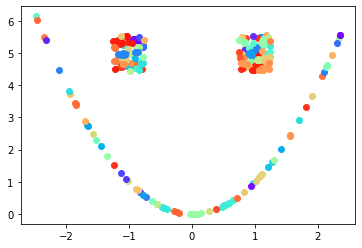

number of clusters 126


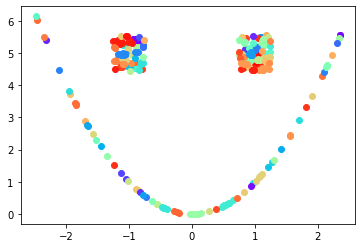

number of clusters 125


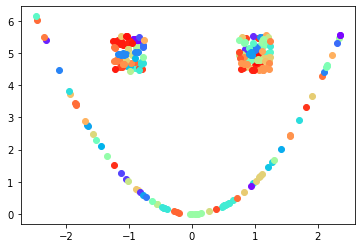

number of clusters 124


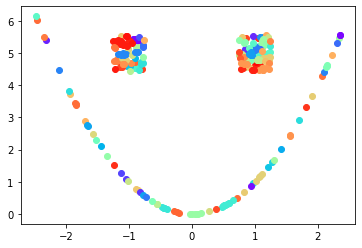

number of clusters 123


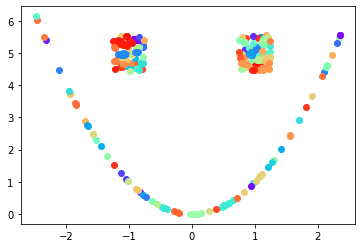

number of clusters 122


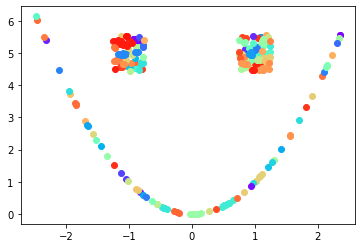

number of clusters 121


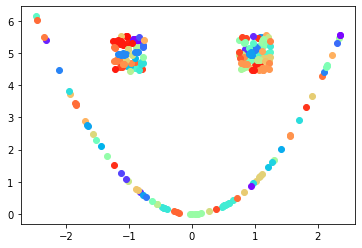

number of clusters 120


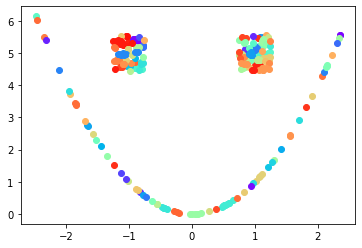

number of clusters 119


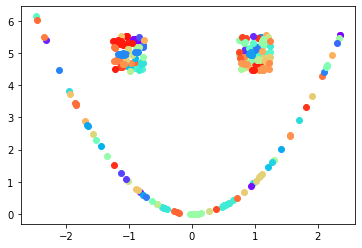

number of clusters 118


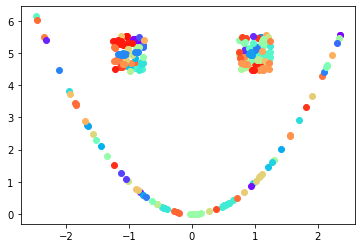

number of clusters 117


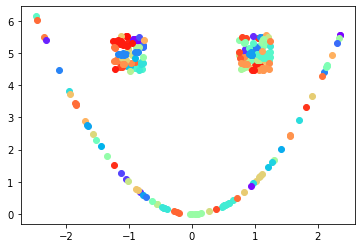

number of clusters 116


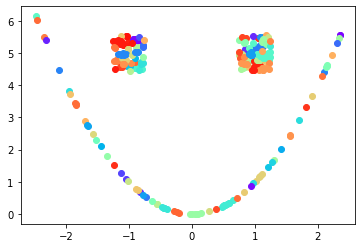

number of clusters 115


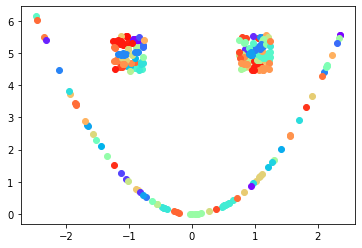

number of clusters 114


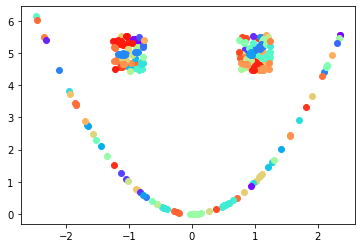

number of clusters 113


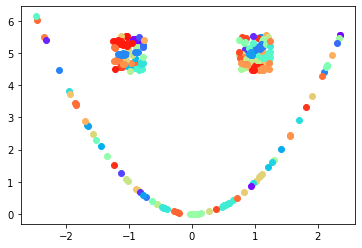

number of clusters 112


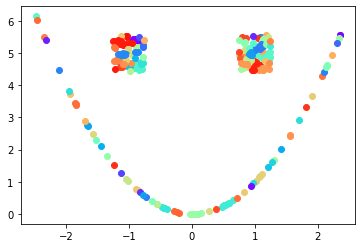

number of clusters 111


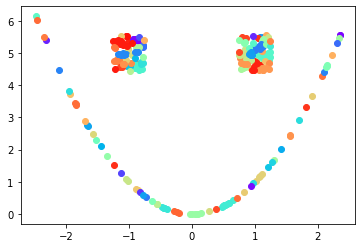

number of clusters 110


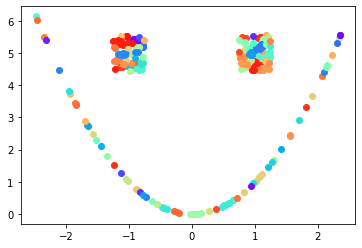

number of clusters 109


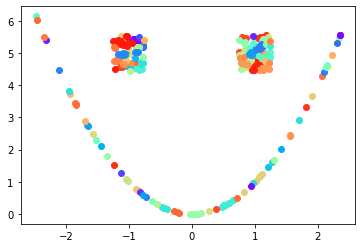

number of clusters 108


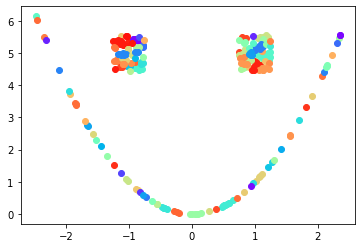

number of clusters 107


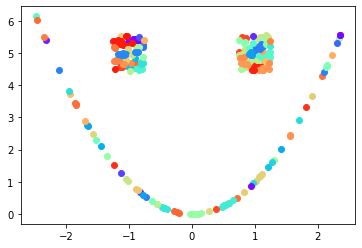

number of clusters 106


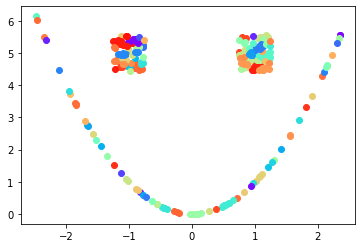

number of clusters 105


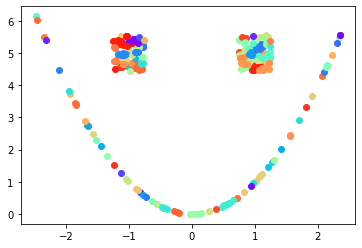

number of clusters 104


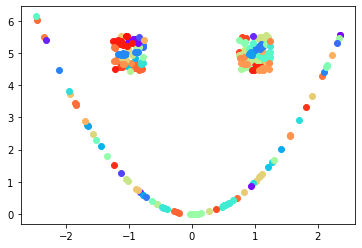

number of clusters 103


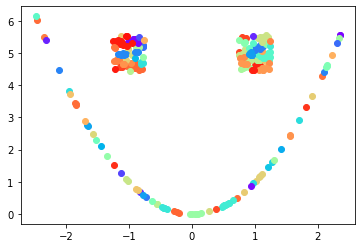

number of clusters 102


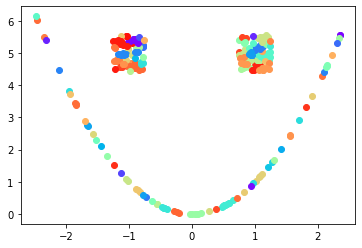

number of clusters 101


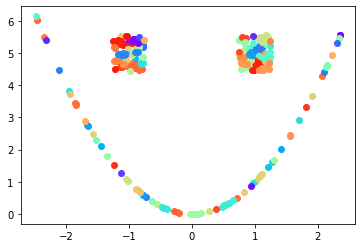

number of clusters 100


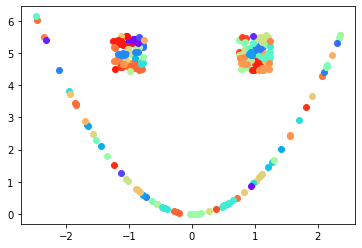

number of clusters 99


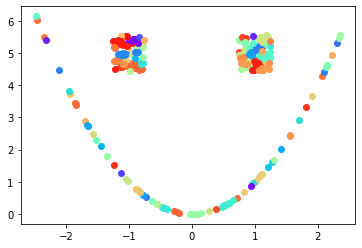

number of clusters 98


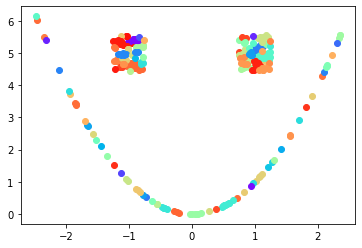

number of clusters 97


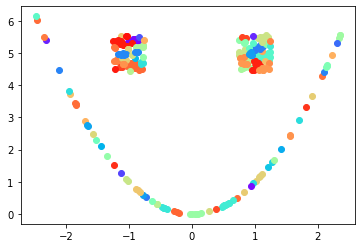

number of clusters 96


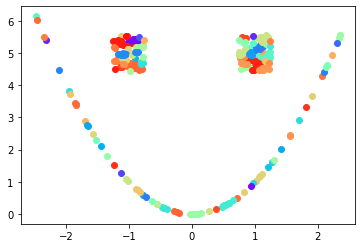

number of clusters 95


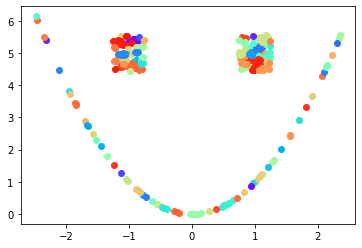

number of clusters 94


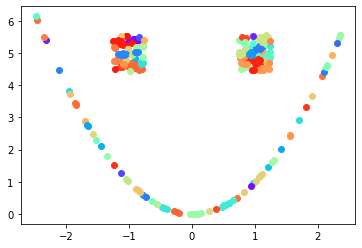

number of clusters 93


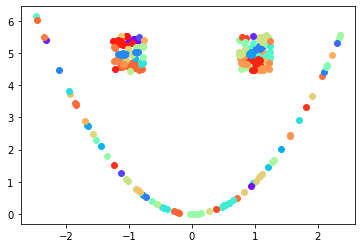

number of clusters 92


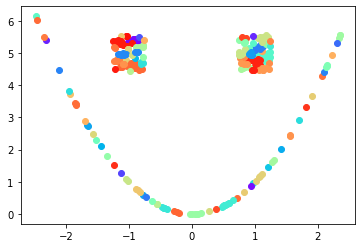

number of clusters 91


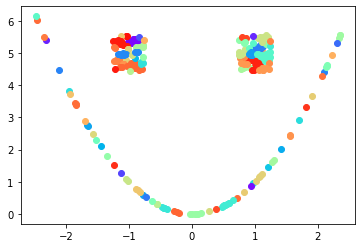

number of clusters 90


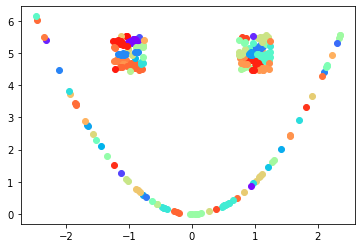

number of clusters 89


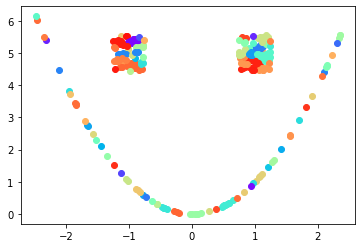

number of clusters 88


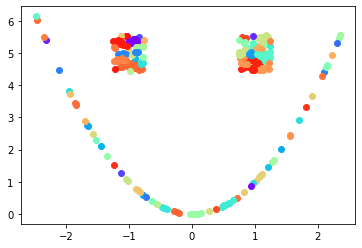

number of clusters 87


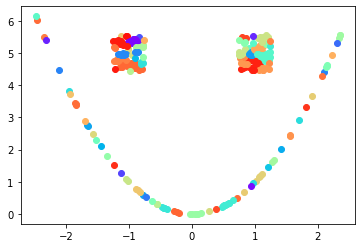

number of clusters 86


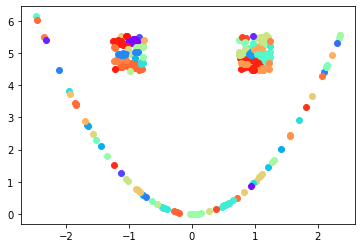

number of clusters 85


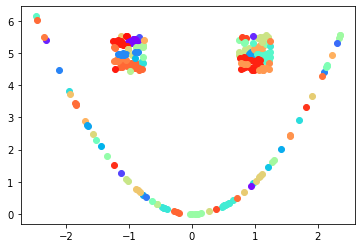

number of clusters 84


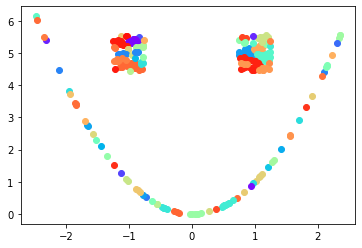

number of clusters 83


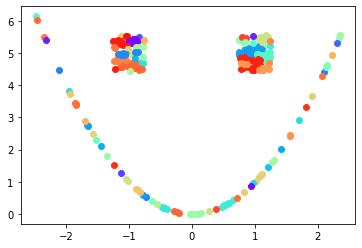

number of clusters 82


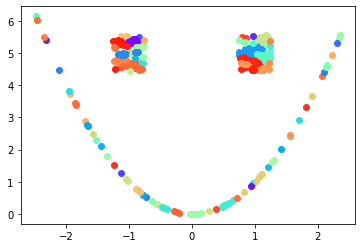

number of clusters 81


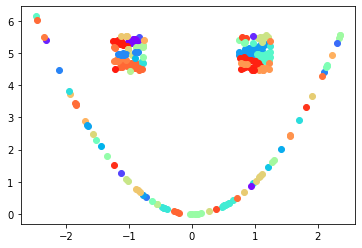

number of clusters 80


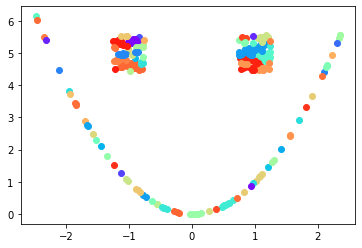

number of clusters 79


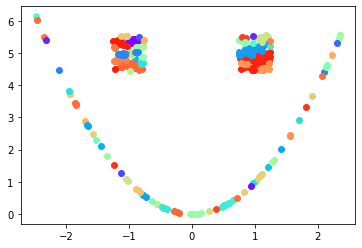

number of clusters 78


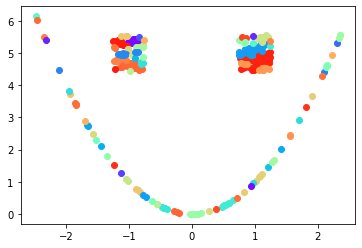

number of clusters 77


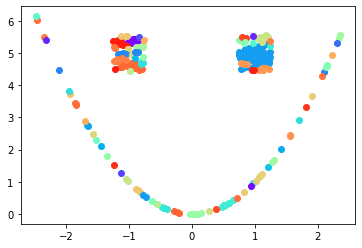

number of clusters 76


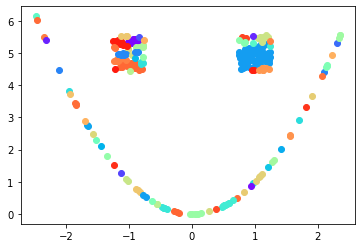

number of clusters 75


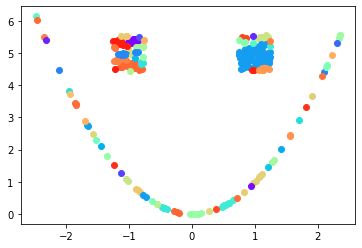

number of clusters 74


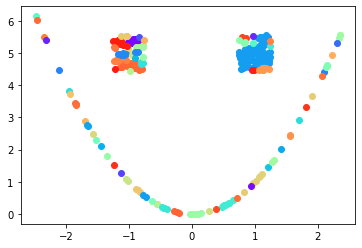

number of clusters 73


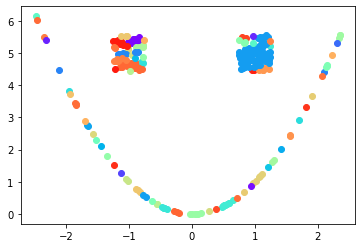

number of clusters 72


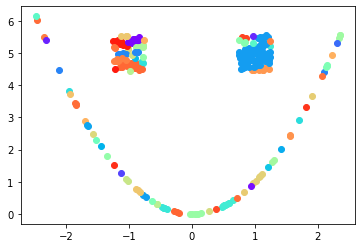

number of clusters 71


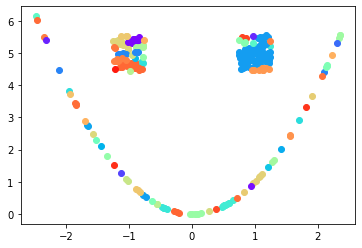

number of clusters 70


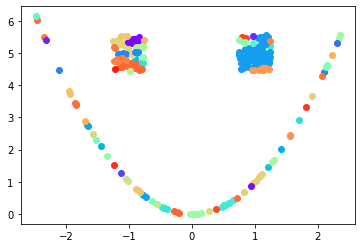

number of clusters 69


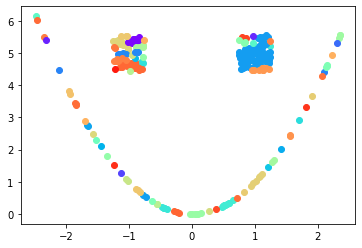

number of clusters 68


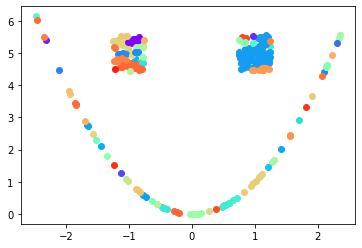

number of clusters 67


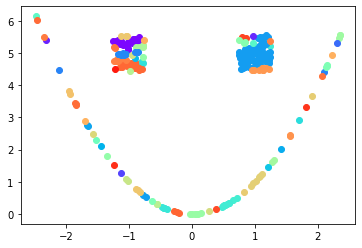

number of clusters 66


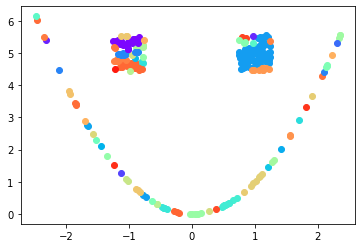

number of clusters 65


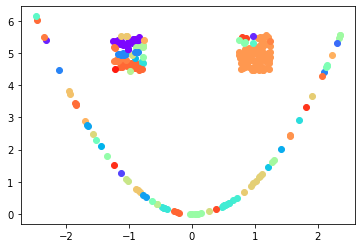

number of clusters 64


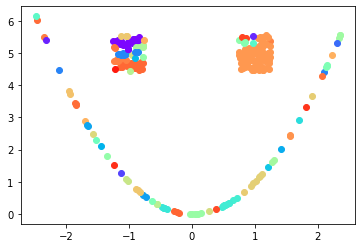

number of clusters 63


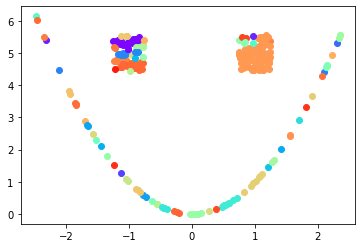

number of clusters 62


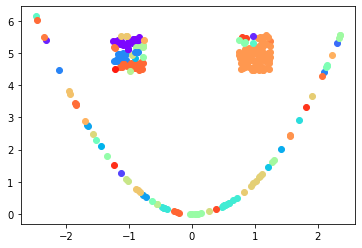

number of clusters 61


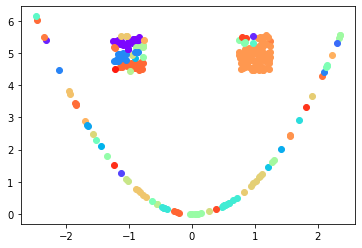

number of clusters 60


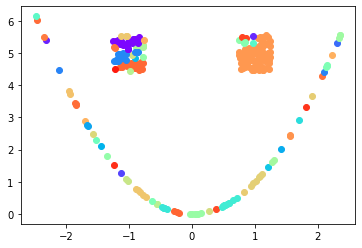

number of clusters 59


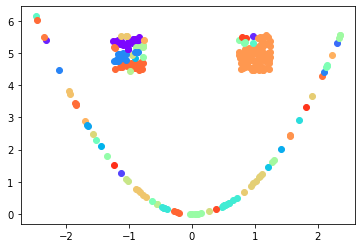

number of clusters 58


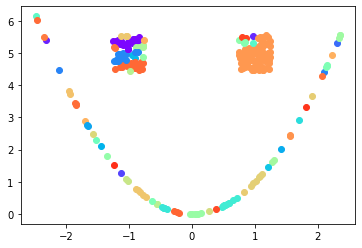

number of clusters 57


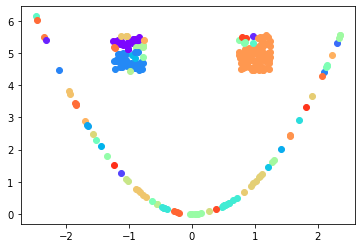

number of clusters 56


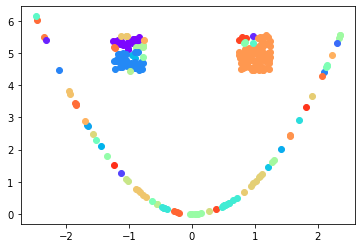

number of clusters 55


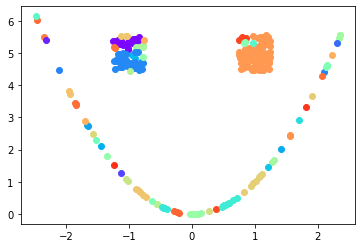

number of clusters 54


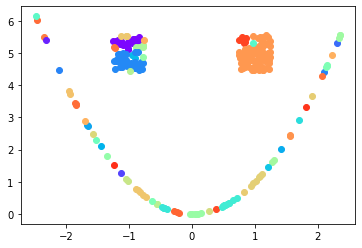

number of clusters 53


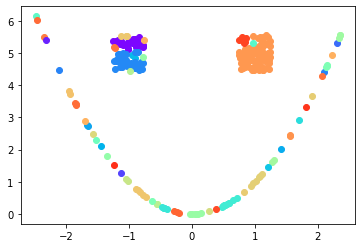

number of clusters 52


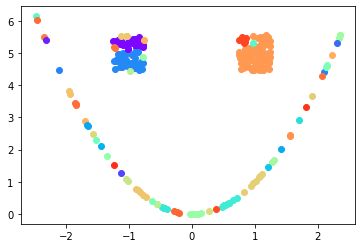

number of clusters 51


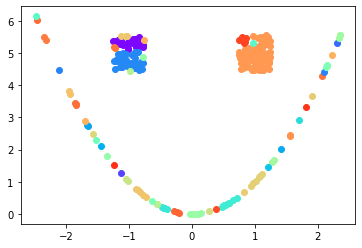

number of clusters 50


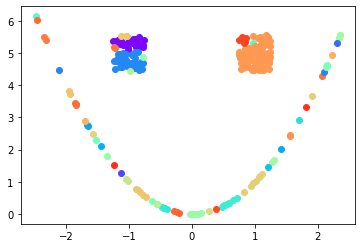

number of clusters 49


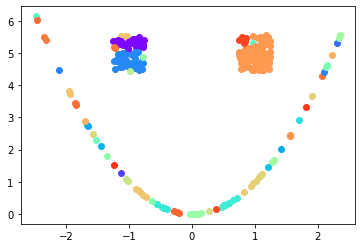

number of clusters 48


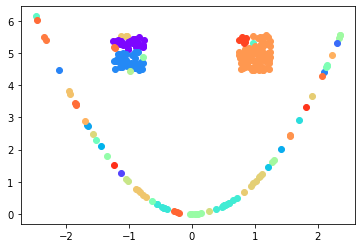

number of clusters 47


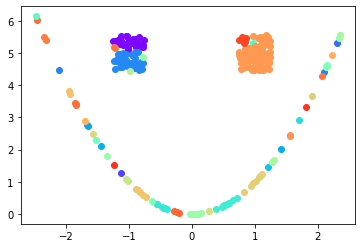

number of clusters 46


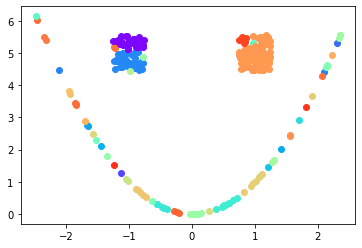

number of clusters 45


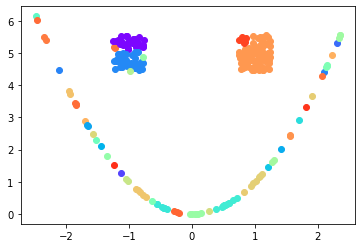

number of clusters 44


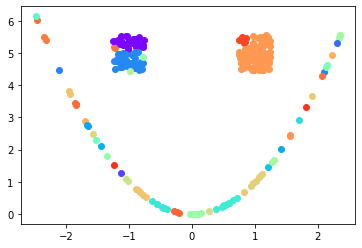

number of clusters 43


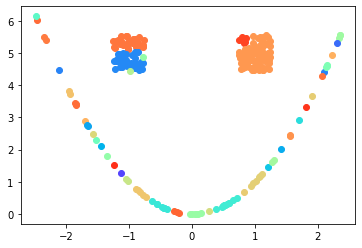

number of clusters 42


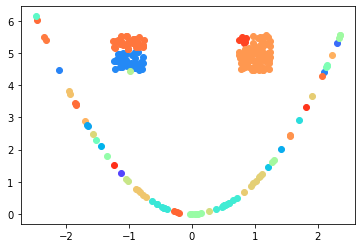

number of clusters 41


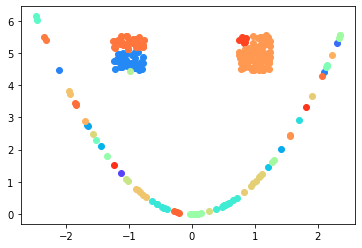

number of clusters 40


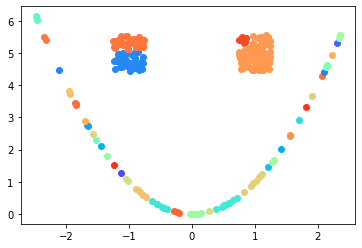

number of clusters 39


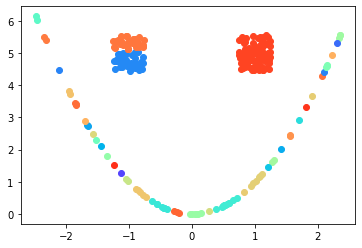

number of clusters 38


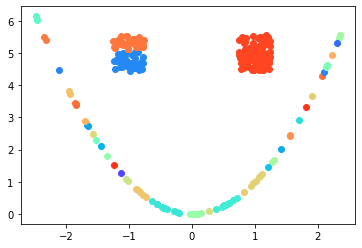

number of clusters 37


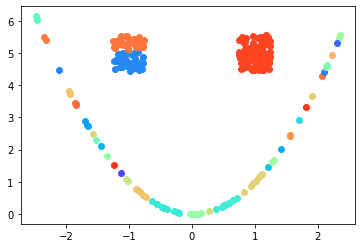

number of clusters 36


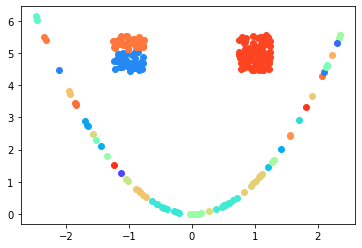

number of clusters 35


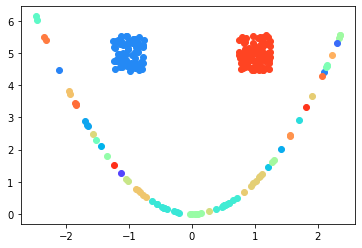

number of clusters 34


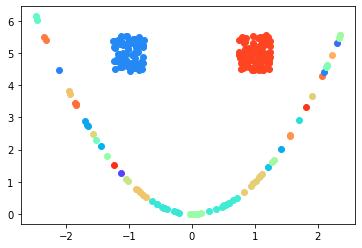

number of clusters 33


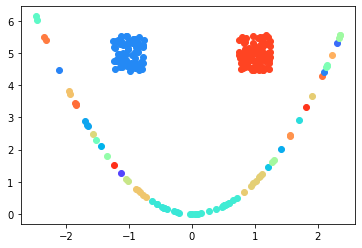

number of clusters 32


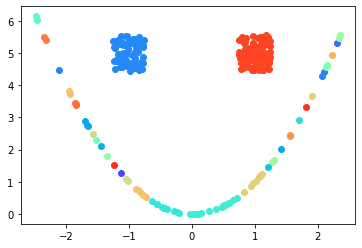

number of clusters 31


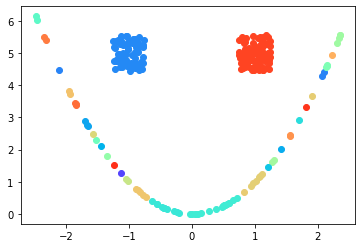

number of clusters 30


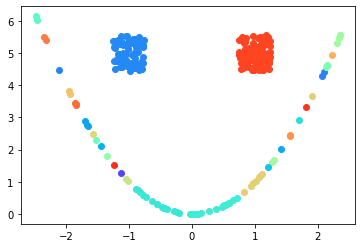

number of clusters 29


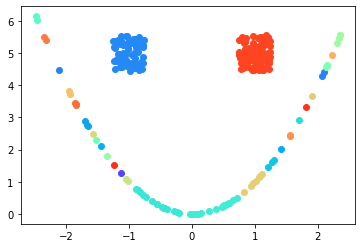

number of clusters 28


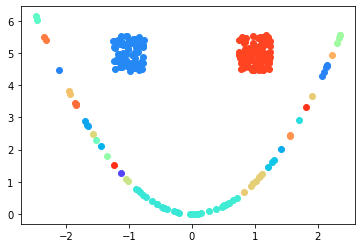

number of clusters 27


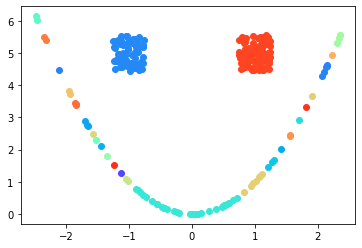

number of clusters 26


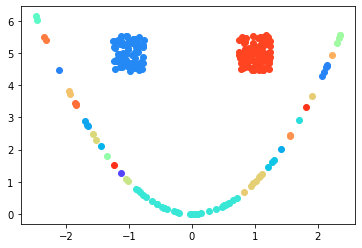

number of clusters 25


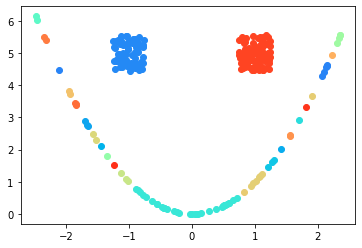

number of clusters 24


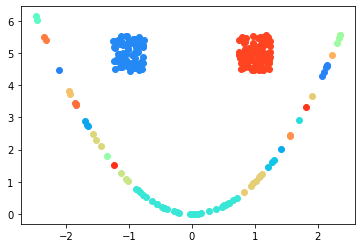

number of clusters 23


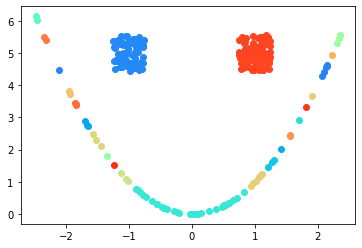

number of clusters 22


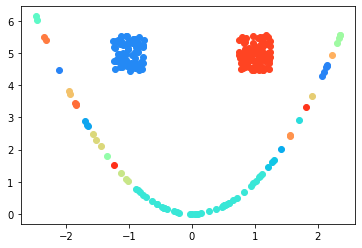

number of clusters 21


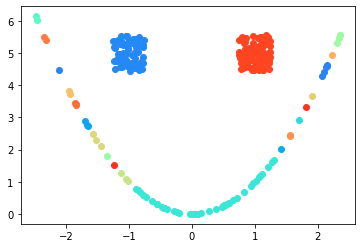

number of clusters 20


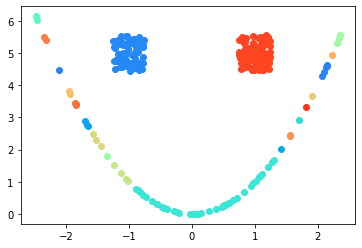

number of clusters 19


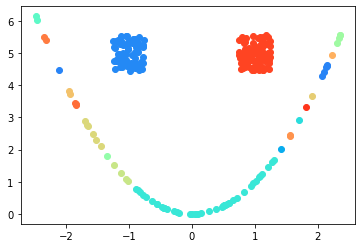

number of clusters 18


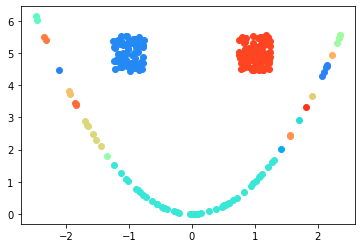

number of clusters 17


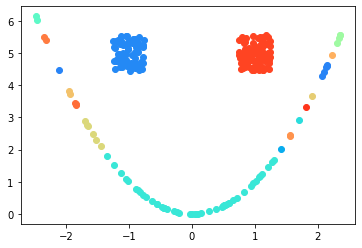

number of clusters 16


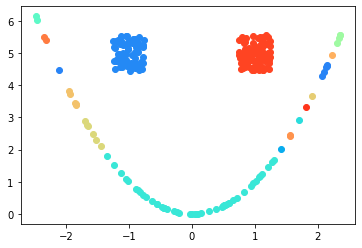

number of clusters 15


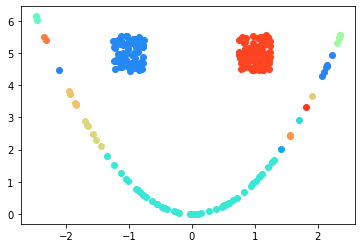

number of clusters 14


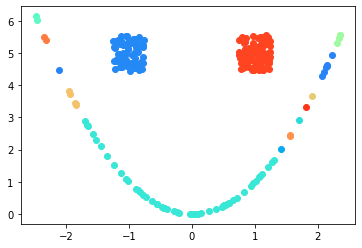

number of clusters 13


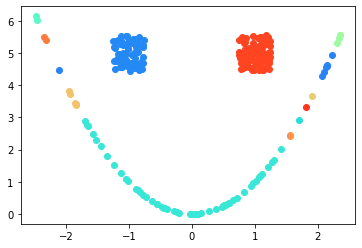

number of clusters 12


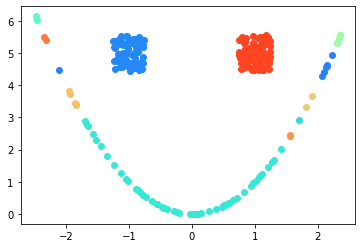

number of clusters 11


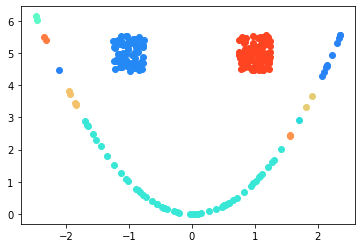

number of clusters 10


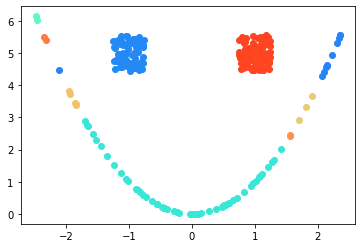

number of clusters 9


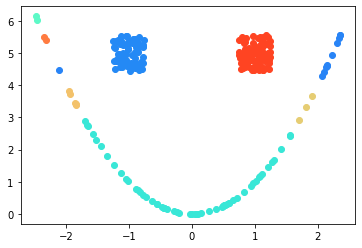

number of clusters 8


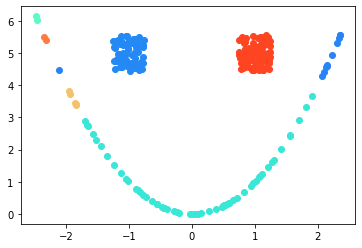

number of clusters 7


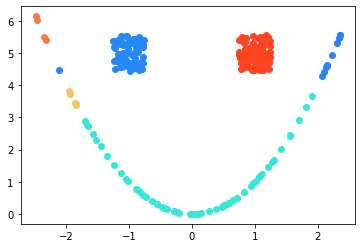

number of clusters 6


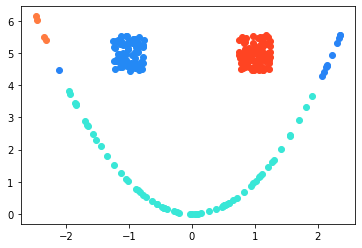

number of clusters 5


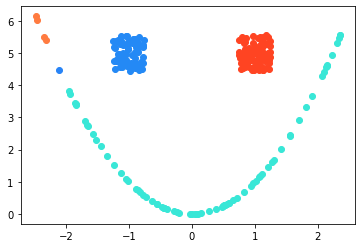

number of clusters 4


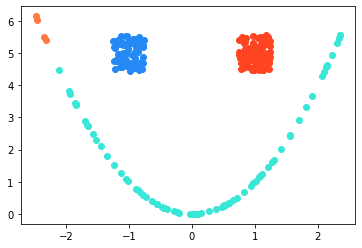

number of clusters 3


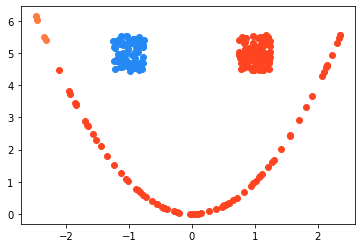

number of clusters 2


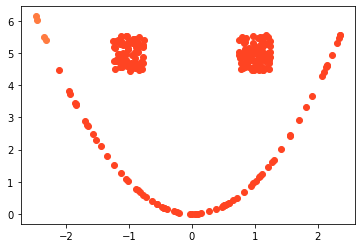

number of clusters 1


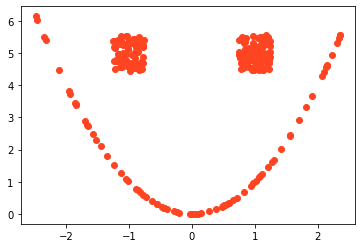

In [ ]:
df = dfex3_reduced
agglomerate(df)

# create a neural network 

before doing that, make a function to garble 5/10/15/20% of the labels

In [ ]:
from random import sample

#copy dataframes so we have new dataframes 
dfex1noise = dfex1.copy(deep = True) 
dfex2noise = dfex2.copy(deep = True)
dfex3noise = dfex3.copy(deep = True)

percentages = [5, 10, 15, 20]

print(dfex1noise["label"].unique())
print(dfex2noise["label"].unique())
print(dfex3noise["label"].unique())

[1 2 3]
[1 2 3]
[1 2 3]


# create 4 models for testing our hyperparameters
model 1 - complex

model 2 - somewhat complex

model 3 - same as model 2, but trained on lower epochs

model 4 - bare bones

In [ ]:
import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense


model = Sequential()
model.add(Dense(40, activation='relu', input_shape=(2,))) #input shape is 2 dimensions because 2d space 
model.add(Dense(30, activation='relu'))
model.add(Dense(10, activation='relu'))
model.add(Dense(3, activation='softmax'))
model.compile(optimizer='sgd', loss='categorical_crossentropy', metrics=['accuracy']) #categorical cross entropy since it is a categorical classification problem 
#sgd - stochastic gradient descent 

In [ ]:
model2 = Sequential()
model2.add(Dense(30, activation='relu', input_shape=(2,)))
model2.add(Dense(8, activation='relu'))
model2.add(Dense(3, activation='softmax'))

model2.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
model3 = Sequential()
model3.add(Dense(30, activation='relu', input_shape=(2,)))
model3.add(Dense(8, activation='relu'))
model3.add(Dense(3, activation='softmax'))

model3.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
model4 = Sequential()
model4.add(Dense(10, activation='relu', input_shape=(2,)))
model4.add(Dense(3, activation='softmax'))

model4.compile(optimizer='sgd', loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split

kf = KFold(n_splits = 3, shuffle = True, random_state = 2) #3 fold cross validation 

df = dfex1noise #EXAMPLE 1

for percentage in percentages:
  print("--------TRAINING AND TESTING EX 1 ON", percentage, "% NOISE")

  #this loop will add noise to our data
  #samples a varying fraction of our dataset (5/10/15/20)
  for index, rows in df.sample(frac = percentage/100, random_state=1).iterrows():
    #add noise 
    new_val = int(random.random() * 3) + 1 #randomly assigns the row a new value 
    df.loc[index, 'label'] = new_val


  fold = 0
  for train_index, test_index in kf.split(df):
      train = df.iloc[train_index]
      test = df.iloc[test_index]

      # fit the model
      history = model.fit(train[["x","y"]], pd.get_dummies(train["label"]), validation_split = 0.2, epochs=20, batch_size=32, verbose=0)  #validation split of 20% of training data 
      history2 = model2.fit(train[["x","y"]], pd.get_dummies(train["label"]), validation_split = 0.2, epochs=20, batch_size=32, verbose=0) 
      history3 = model3.fit(train[["x","y"]], pd.get_dummies(train["label"]), validation_split = 0.2, epochs=10, batch_size=32, verbose=0) 
      history4 = model4.fit(train[["x","y"]], pd.get_dummies(train["label"]), validation_split = 0.2, epochs=5, batch_size=32, verbose=0) 

      #evaluate the model
      loss, acc = model.evaluate(test[["x", "y"]], pd.get_dummies(test["label"]), verbose=0)
      loss2, acc2 = model2.evaluate(test[["x", "y"]], pd.get_dummies(test["label"]), verbose=0)
      loss3, acc3 = model3.evaluate(test[["x", "y"]], pd.get_dummies(test["label"]), verbose=0)
      loss4, acc4 = model4.evaluate(test[["x", "y"]], pd.get_dummies(test["label"]), verbose=0)


      fold+=1
      print("\tFOLD", fold)
      print("\t\tmodel 1 train accuracy is...", history.history["accuracy"][-1], "validation accuracy is...", history.history["val_accuracy"][-1], "test accuracy is ...", acc) #print last accuracy and val accuracy
      print("\t\tmodel 2 train accuracy is...", history2.history["accuracy"][-1], "validation accuracy is...", history2.history["val_accuracy"][-1], "test accuracy is ...", acc2) #print last accuracy and val accuracy
      print("\t\tmodel 3 train accuracy is...", history3.history["accuracy"][-1], "validation accuracy is...", history3.history["val_accuracy"][-1], "test accuracy is ...", acc3) #print last accuracy and val accuracy
      print("\t\tmodel 3 train accuracy is...", history4.history["accuracy"][-1], "validation accuracy is...", history4.history["val_accuracy"][-1], "test accuracy is ...", acc4) #print last accuracy and val accuracy

--------TRAINING AND TESTING EX 1 ON 5 % NOISE
	FOLD 1
		model 1 train accuracy is... 0.9624999761581421 validation accuracy is... 0.856249988079071 test accuracy is ... 0.9549999833106995
		model 2 train accuracy is... 0.9624999761581421 validation accuracy is... 0.9750000238418579 test accuracy is ... 0.9549999833106995
		model 3 train accuracy is... 0.9624999761581421 validation accuracy is... 0.9750000238418579 test accuracy is ... 0.9549999833106995
		model 3 train accuracy is... 0.9468749761581421 validation accuracy is... 0.8500000238418579 test accuracy is ... 0.9100000262260437
	FOLD 2
		model 1 train accuracy is... 0.9624999761581421 validation accuracy is... 0.949999988079071 test accuracy is ... 0.9649999737739563
		model 2 train accuracy is... 0.9624999761581421 validation accuracy is... 0.949999988079071 test accuracy is ... 0.9649999737739563
		model 3 train accuracy is... 0.9624999761581421 validation accuracy is... 0.949999988079071 test accuracy is ... 0.9649999737739

In [ ]:
kf = KFold(n_splits = 3, shuffle = True, random_state = 2)

df = dfex2noise

for percentage in percentages:
  print("--------TRAINING AND TESTING EX 2 ON", percentage, "% NOISE")

  for index, rows in df.sample(frac = percentage/100, random_state=1).iterrows():
    #add noise 
    new_val = int(random.random() * 3) + 1 
    df.loc[index, 'label'] = new_val


  fold = 0
  for train_index, test_index in kf.split(df):
      train = df.iloc[train_index]
      test = df.iloc[test_index]

      # compile the model
      model.compile(optimizer='sgd', loss='categorical_crossentropy', metrics=['accuracy'])

      # fit the model
      history = model.fit(train[["x","y"]], pd.get_dummies(train["label"]), validation_split = 0.2, epochs=20, batch_size=32, verbose=0)
      history2 = model2.fit(train[["x","y"]], pd.get_dummies(train["label"]), validation_split = 0.2, epochs=20, batch_size=32, verbose=0) 
      history3 = model3.fit(train[["x","y"]], pd.get_dummies(train["label"]), validation_split = 0.2, epochs=10, batch_size=32, verbose=0) 
      history4 = model4.fit(train[["x","y"]], pd.get_dummies(train["label"]), validation_split = 0.2, epochs=5, batch_size=32, verbose=0) 
      #evaluate the model
      loss, acc = model.evaluate(test[["x", "y"]], pd.get_dummies(test["label"]), verbose=0)
      loss2, acc2 = model2.evaluate(test[["x", "y"]], pd.get_dummies(test["label"]), verbose=0)
      loss3, acc3 = model3.evaluate(test[["x", "y"]], pd.get_dummies(test["label"]), verbose=0)
      loss4, acc4 = model4.evaluate(test[["x", "y"]], pd.get_dummies(test["label"]), verbose=0)


      fold+=1
      print("\tFOLD", fold)
      print("\t\tmodel 1 train accuracy is...", history.history["accuracy"][-1], "validation accuracy is...", history.history["val_accuracy"][-1], "test accuracy is ...", acc) #print last accuracy and val accuracy
      print("\t\tmodel 2 train accuracy is...", history2.history["accuracy"][-1], "validation accuracy is...", history2.history["val_accuracy"][-1], "test accuracy is ...", acc2) #print last accuracy and val accuracy
      print("\t\tmodel 3 train accuracy is...", history3.history["accuracy"][-1], "validation accuracy is...", history3.history["val_accuracy"][-1], "test accuracy is ...", acc3) #print last accuracy and val accuracy
      print("\t\tmodel 3 train accuracy is...", history4.history["accuracy"][-1], "validation accuracy is...", history4.history["val_accuracy"][-1], "test accuracy is ...", acc4) #print last accuracy and val accuracy

--------TRAINING AND TESTING EX 1 ON 5 % NOISE
	FOLD 1
		model 1 train accuracy is... 0.828125 validation accuracy is... 0.012500000186264515 test accuracy is ... 0.625
		model 2 train accuracy is... 0.878125011920929 validation accuracy is... 0.9750000238418579 test accuracy is ... 0.8949999809265137
		model 3 train accuracy is... 0.7250000238418579 validation accuracy is... 0.012500000186264515 test accuracy is ... 0.6499999761581421
		model 3 train accuracy is... 0.421875 validation accuracy is... 0.1875 test accuracy is ... 0.6050000190734863
	FOLD 2
		model 1 train accuracy is... 0.890625 validation accuracy is... 0.9750000238418579 test accuracy is ... 0.8899999856948853
		model 2 train accuracy is... 0.890625 validation accuracy is... 0.9750000238418579 test accuracy is ... 0.9200000166893005
		model 3 train accuracy is... 0.8218749761581421 validation accuracy is... 0.5 test accuracy is ... 0.7149999737739563
		model 3 train accuracy is... 0.4781250059604645 validation accuracy

In [ ]:
kf = KFold(n_splits = 3, shuffle = True, random_state = 2)

df = dfex3noise

for percentage in percentages:
  print("--------TRAINING AND TESTING EX 3 ON", percentage, "% NOISE")

  for index, rows in df.sample(frac = percentage/100, random_state=1).iterrows():
    #add noise 
    new_val = int(random.random() * 3) + 1 
    df.loc[index, 'label'] = new_val


  fold = 0
  for train_index, test_index in kf.split(df):
      train = df.iloc[train_index]
      test = df.iloc[test_index]

      # compile the model
      model.compile(optimizer='sgd', loss='categorical_crossentropy', metrics=['accuracy'])

      # fit the model
      history = model.fit(train[["x","y"]], pd.get_dummies(train["label"]), validation_split = 0.2, epochs=20, batch_size=32, verbose=0) 
      history2 = model2.fit(train[["x","y"]], pd.get_dummies(train["label"]), validation_split = 0.2, epochs=20, batch_size=32, verbose=0) 
      history3 = model3.fit(train[["x","y"]], pd.get_dummies(train["label"]), validation_split = 0.2, epochs=10, batch_size=32, verbose=0) 
      history4 = model4.fit(train[["x","y"]], pd.get_dummies(train["label"]), validation_split = 0.2, epochs=5, batch_size=32, verbose=0) 

      #evaluate the model
      loss, acc = model.evaluate(test[["x", "y"]], pd.get_dummies(test["label"]), verbose=0)
      loss2, acc2 = model2.evaluate(test[["x", "y"]], pd.get_dummies(test["label"]), verbose=0)
      loss3, acc3 = model3.evaluate(test[["x", "y"]], pd.get_dummies(test["label"]), verbose=0)
      loss4, acc4 = model4.evaluate(test[["x", "y"]], pd.get_dummies(test["label"]), verbose=0)


      fold+=1
      print("\tFOLD", fold)
      print("\t\tmodel 1 train accuracy is...", history.history["accuracy"][-1], "validation accuracy is...", history.history["val_accuracy"][-1], "test accuracy is ...", acc) #print last accuracy and val accuracy
      print("\t\tmodel 2 train accuracy is...", history2.history["accuracy"][-1], "validation accuracy is...", history2.history["val_accuracy"][-1], "test accuracy is ...", acc2) #print last accuracy and val accuracy
      print("\t\tmodel 3 train accuracy is...", history3.history["accuracy"][-1], "validation accuracy is...", history3.history["val_accuracy"][-1], "test accuracy is ...", acc3) #print last accuracy and val accuracy
      print("\t\tmodel 3 train accuracy is...", history4.history["accuracy"][-1], "validation accuracy is...", history4.history["val_accuracy"][-1], "test accuracy is ...", acc4) #print last accuracy and val accuracy

--------TRAINING AND TESTING EX 1 ON 5 % NOISE
	FOLD 1
		model 1 train accuracy is... 0.7437499761581421 validation accuracy is... 0.02500000037252903 test accuracy is ... 0.6299999952316284
		model 2 train accuracy is... 0.887499988079071 validation accuracy is... 0.9750000238418579 test accuracy is ... 0.9150000214576721
		model 3 train accuracy is... 0.737500011920929 validation accuracy is... 0.012500000186264515 test accuracy is ... 0.6399999856948853
		model 3 train accuracy is... 0.6656249761581421 validation accuracy is... 0.0 test accuracy is ... 0.5450000166893005
	FOLD 2
		model 1 train accuracy is... 0.9437500238418579 validation accuracy is... 0.949999988079071 test accuracy is ... 0.9449999928474426
		model 2 train accuracy is... 0.9156249761581421 validation accuracy is... 0.9624999761581421 test accuracy is ... 0.8999999761581421
		model 3 train accuracy is... 0.762499988079071 validation accuracy is... 0.02500000037252903 test accuracy is ... 0.6050000190734863
		model